In [1]:
import pyspark
import pyspark.sql.functions as F
from pyspark.sql.functions import col
from pyspark.sql.types import StringType, IntegerType, FloatType, DateType, BooleanType

In [2]:
import os
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pprint
import pickle
import pyspark
import random
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta

import pyspark
import pyspark.sql.functions as F
from pyspark.sql.functions import col
from pyspark.sql.types import StringType, IntegerType, FloatType, DateType, BooleanType

from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import make_scorer, f1_score, roc_auc_score
from sklearn.datasets import make_classification

import xgboost as xgb

c:\anaconda3\envs\mle_as2\Lib\site-packages\xgboost\compat.py:105: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


In [3]:
import pyspark
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("model_train_main") \
    .master("local[*]") \
    .getOrCreate()

spark.sparkContext.setLogLevel("ERROR")

In [ ]:
# connect to label store
folder_path = "datamart/gold/label_store/"
files_list = [folder_path+os.path.basename(f) for f in glob.glob(os.path.join(folder_path, '*'))]
label_store_sdf = spark.read.option("header", "true").parquet(*files_list)
print("row_count:",label_store_sdf.count())

label_store_sdf.show()

In [ ]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt

# 假設你已經有 SparkSession (spark) 且 label_store_sdf 已讀取完成
print("DataFrame loaded:", label_store_sdf.count(), "rows")
label_store_sdf.printSchema()


DataFrame loaded: 10515 rows
root
 |-- loan_id: string (nullable = true)
 |-- Customer_ID: string (nullable = true)
 |-- label: integer (nullable = true)
 |-- label_def: string (nullable = true)
 |-- snapshot_date: date (nullable = true)



In [ ]:
# 確保 snapshot_date 是日期型態
label_store_sdf = label_store_sdf.withColumn("snapshot_date", F.to_date("snapshot_date"))

# 找出最早與最晚的 snapshot_date
date_range = label_store_sdf.agg(
    F.min("snapshot_date").alias("earliest_date"),
    F.max("snapshot_date").alias("latest_date")
).collect()[0]

print(f"Data covers from {date_range['earliest_date']} to {date_range['latest_date']}")


Data covers from 2023-04-01 to 2024-12-01


In [ ]:
monthly_counts = (label_store_sdf
    .groupBy("snapshot_date")
    .count()
    .orderBy("snapshot_date"))

monthly_counts.show(100, False)


+-------------+-----+
|snapshot_date|count|
+-------------+-----+
|2023-04-01   |530  |
|2023-05-01   |501  |
|2023-06-01   |506  |
|2023-07-01   |510  |
|2023-08-01   |521  |
|2023-09-01   |517  |
|2023-10-01   |471  |
|2023-11-01   |481  |
|2023-12-01   |454  |
|2024-01-01   |487  |
|2024-02-01   |491  |
|2024-03-01   |489  |
|2024-04-01   |485  |
|2024-05-01   |518  |
|2024-06-01   |511  |
|2024-07-01   |513  |
|2024-08-01   |491  |
|2024-09-01   |498  |
|2024-10-01   |505  |
|2024-11-01   |543  |
|2024-12-01   |493  |
+-------------+-----+



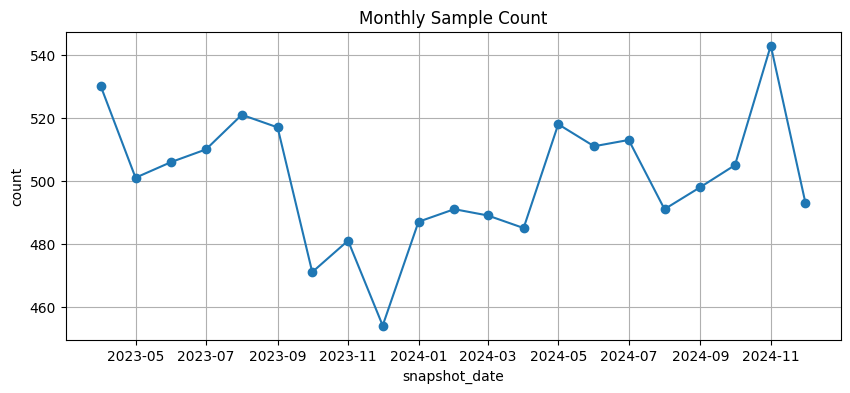

In [ ]:
pdf = monthly_counts.toPandas()
plt.figure(figsize=(10,4))
plt.plot(pdf["snapshot_date"], pdf["count"], marker="o")
plt.title("Monthly Sample Count")
plt.xlabel("snapshot_date")
plt.ylabel("count")
plt.grid(True)
plt.show()


In [ ]:
# set up config
model_train_date_str = "2024-09-01"
train_test_period_months = 12
oot_period_months = 2
train_test_ratio = 0.8

config = {}
config["model_train_date_str"] = model_train_date_str
config["train_test_period_months"] = train_test_period_months
config["oot_period_months"] =  oot_period_months
config["model_train_date"] =  datetime.strptime(model_train_date_str, "%Y-%m-%d")
config["oot_end_date"] =  config['model_train_date'] - timedelta(days = 1)
config["oot_start_date"] =  config['model_train_date'] - relativedelta(months = oot_period_months)
config["train_test_end_date"] =  config["oot_start_date"] - timedelta(days = 1)
config["train_test_start_date"] =  config["oot_start_date"] - relativedelta(months = train_test_period_months)
config["train_test_ratio"] = train_test_ratio 


pprint.pprint(config)

{'model_train_date': datetime.datetime(2024, 9, 1, 0, 0),
 'model_train_date_str': '2024-09-01',
 'oot_end_date': datetime.datetime(2024, 8, 31, 0, 0),
 'oot_period_months': 2,
 'oot_start_date': datetime.datetime(2024, 7, 1, 0, 0),
 'train_test_end_date': datetime.datetime(2024, 6, 30, 0, 0),
 'train_test_period_months': 12,
 'train_test_ratio': 0.8,
 'train_test_start_date': datetime.datetime(2023, 7, 1, 0, 0)}


label

In [ ]:
# extract label store
labels_sdf = label_store_sdf.filter((col("snapshot_date") >= config["train_test_start_date"]) & (col("snapshot_date") <= config["oot_end_date"]))

print("extracted labels_sdf rows:", labels_sdf.count())
print("train_test_start_date: ", config["train_test_start_date"])
print("oot_end_date: ", config["oot_end_date"])

extracted labels_sdf rows: 6939
train_test_start_date:  2023-07-01 00:00:00
oot_end_date:  2024-08-31 00:00:00


In [ ]:
labels_sdf.select("snapshot_date").distinct().orderBy("snapshot_date").collect()

[Row(snapshot_date=datetime.date(2023, 7, 1)),
 Row(snapshot_date=datetime.date(2023, 8, 1)),
 Row(snapshot_date=datetime.date(2023, 9, 1)),
 Row(snapshot_date=datetime.date(2023, 10, 1)),
 Row(snapshot_date=datetime.date(2023, 11, 1)),
 Row(snapshot_date=datetime.date(2023, 12, 1)),
 Row(snapshot_date=datetime.date(2024, 1, 1)),
 Row(snapshot_date=datetime.date(2024, 2, 1)),
 Row(snapshot_date=datetime.date(2024, 3, 1)),
 Row(snapshot_date=datetime.date(2024, 4, 1)),
 Row(snapshot_date=datetime.date(2024, 5, 1)),
 Row(snapshot_date=datetime.date(2024, 6, 1)),
 Row(snapshot_date=datetime.date(2024, 7, 1)),
 Row(snapshot_date=datetime.date(2024, 8, 1))]

feature

In [ ]:
folder_path = "datamart/silver/fin/"
files_list = [folder_path+os.path.basename(f) for f in glob.glob(os.path.join(folder_path, '*'))]
fin_sdf = spark.read.parquet(*files_list)

print("===== FIN =====")
print("rows:", fin_sdf.count())
fin_sdf.printSchema()

fin_sdf.show(5)

===== FIN =====
rows: 11974
root
 |-- Customer_ID: string (nullable = true)
 |-- Annual_Income: double (nullable = true)
 |-- Monthly_Inhand_Salary: double (nullable = true)
 |-- Num_Bank_Accounts: integer (nullable = true)
 |-- Num_Credit_Card: integer (nullable = true)
 |-- Interest_Rate: integer (nullable = true)
 |-- Num_of_Loan: integer (nullable = true)
 |-- Type_of_Loan: string (nullable = true)
 |-- Delay_from_due_date: integer (nullable = true)
 |-- Num_of_Delayed_Payment: integer (nullable = true)
 |-- Changed_Credit_Limit: double (nullable = true)
 |-- Num_Credit_Inquiries: integer (nullable = true)
 |-- Credit_Mix: integer (nullable = true)
 |-- Outstanding_Debt: double (nullable = true)
 |-- Credit_Utilization_Ratio: double (nullable = true)
 |-- Credit_History_Age: integer (nullable = true)
 |-- Payment_of_Min_Amount: boolean (nullable = true)
 |-- Total_EMI_per_month: double (nullable = true)
 |-- Amount_invested_monthly: double (nullable = true)
 |-- Payment_Behaviour: 

In [ ]:
folder_path = "datamart/silver/attr/"
files_list = [folder_path+os.path.basename(f) for f in glob.glob(os.path.join(folder_path, '*'))]
attr_sdf = spark.read.parquet(*files_list)

print("===== FIN =====")
print("rows:", attr_sdf.count())
attr_sdf.printSchema()

attr_sdf.show(5)

===== FIN =====
rows: 11974
root
 |-- Customer_ID: string (nullable = true)
 |-- Name: string (nullable = true)
 |-- Age: integer (nullable = true)
 |-- SSN: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- snapshot_date: date (nullable = true)


rows: 11974
root
 |-- Customer_ID: string (nullable = true)
 |-- Name: string (nullable = true)
 |-- Age: integer (nullable = true)
 |-- SSN: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- snapshot_date: date (nullable = true)

+-----------+-----------+---+-----------+------------+-------------+
|Customer_ID|       Name|Age|        SSN|  Occupation|snapshot_date|
+-----------+-----------+---+-----------+------------+-------------+
| CUS_0x10ac|      Zhouy| 29|780-50-4730|   Developer|   2024-08-01|
| CUS_0x10c5|      Moony| 24|041-74-6785|        NULL|   2024-08-01|
| CUS_0x1145|Blenkinsopr| 24|426-31-9194|     Teacher|   2024-08-01|
| CUS_0x11ac|  Liana B.v| 26|835-92-7751|  Journalist|   2024-0

In [ ]:
from pyspark.sql import functions as F

oot_end = F.lit(config["oot_end_date"])  # 這通常是 datetime/date，直接當常數比較即可

# 1) 先確保 snapshot_date 是 date，再做時間篩選（若沒有這欄就略過）
attr_df = attr_sdf
if "snapshot_date" in attr_df.columns:
    # 若本來是 string，就轉 date；若已是 date，to_date 也不會壞
    attr_df = attr_df.withColumn("snapshot_date", F.to_date("snapshot_date"))
    attr_df = attr_df.filter(F.col("snapshot_date") <= oot_end)

print("rows after time filter:", attr_df.count())

# 2) 再選欄位（避免 select 不存在欄位報錯：取交集）
attributes_cols = [
    "Customer_ID", "Age", "Occupation"
]

cols_exist = [c for c in attributes_cols if c in attr_df.columns]
attributes_sdf_subset = attr_df.select(*cols_exist)

attributes_sdf_subset.show(5, truncate=False)
print("selected columns:", attributes_sdf_subset.columns)


rows after time filter: 10022
+-----------+---+------------+
|Customer_ID|Age|Occupation  |
+-----------+---+------------+
|CUS_0x10ac |29 |Developer   |
|CUS_0x10c5 |24 |NULL        |
|CUS_0x1145 |24 |Teacher     |
|CUS_0x11ac |26 |Journalist  |
|CUS_0x122c |48 |Entrepreneur|
+-----------+---+------------+
only showing top 5 rows
selected columns: ['Customer_ID', 'Age', 'Occupation']


In [ ]:
from pyspark.sql import functions as F

oot_end = F.lit(config["oot_end_date"])  # 這通常是 datetime/date，直接當常數比較即可

# 1) 先確保 snapshot_date 是 date，再做時間篩選（若沒有這欄就略過）
fin_df = fin_sdf
if "snapshot_date" in fin_df.columns:
    # 若本來是 string，就轉 date；若已是 date，to_date 也不會壞
    fin_df = fin_df.withColumn("snapshot_date", F.to_date("snapshot_date"))
    fin_df = fin_df.filter(F.col("snapshot_date") <= oot_end)

print("rows after time filter:", fin_df.count())

# 2) 再選欄位（避免 select 不存在欄位報錯：取交集）
financials_cols = [
    "Customer_ID", "Annual_Income", "Monthly_Inhand_Salary",
    "Num_Bank_Accounts", "Num_Credit_Card", "Interest_Rate", "Num_of_Loan",
    "Delay_from_due_date", "Num_of_Delayed_Payment", "Changed_Credit_Limit",
    "Num_Credit_Inquiries", "Credit_Mix", "Outstanding_Debt",
    "Credit_Utilization_Ratio", "Credit_History_Age",
    "Total_EMI_per_month", "Amount_invested_monthly",
    "Payment_Behaviour", "Monthly_Balance",
    "Num_Fin_Pdts", "Loans_per_Credit_Item",
    "Debt_to_Salary", "EMI_to_Salary", "Repayment_Ability", "Loan_Extent"]

cols_exist = [c for c in financials_cols if c in fin_df.columns]
financials_sdf_subset = fin_df.select(*cols_exist)

financials_sdf_subset.show(5, truncate=False)
print("selected columns:", financials_sdf_subset.columns)


rows after time filter: 10022
+-----------+-------------+---------------------+-----------------+---------------+-------------+-----------+-------------------+----------------------+--------------------+--------------------+----------+----------------+------------------------+------------------+-------------------+-----------------------+-----------------+---------------+------------+---------------------+-------------------+--------------------+-----------------+-----------+
|Customer_ID|Annual_Income|Monthly_Inhand_Salary|Num_Bank_Accounts|Num_Credit_Card|Interest_Rate|Num_of_Loan|Delay_from_due_date|Num_of_Delayed_Payment|Changed_Credit_Limit|Num_Credit_Inquiries|Credit_Mix|Outstanding_Debt|Credit_Utilization_Ratio|Credit_History_Age|Total_EMI_per_month|Amount_invested_monthly|Payment_Behaviour|Monthly_Balance|Num_Fin_Pdts|Loans_per_Credit_Item|Debt_to_Salary     |EMI_to_Salary       |Repayment_Ability|Loan_Extent|
+-----------+-------------+---------------------+-----------------+-

In [ ]:

# Merge label data to attributes and financials into 1 table
merged_df = labels_sdf.select([col(c) for c in labels_sdf.columns]) # make a fresh copy
merged_df = merged_df.join(attributes_sdf_subset, on="Customer_ID", how="left")
merged_df = merged_df.join(financials_sdf_subset, on="Customer_ID", how="left")

# Check size of resultant table. Join is correct, no of rows same as original labels_sdf
print(f"Num of rows: {merged_df.count()}")
merged_df.show(5, truncate=False)

Num of rows: 6939
+-----------+---------------------+-----+----------+-------------+----+-------------+-------------+---------------------+-----------------+---------------+-------------+-----------+-------------------+----------------------+--------------------+--------------------+----------+----------------+------------------------+------------------+-------------------+-----------------------+-----------------+---------------+------------+---------------------+-------------------+--------------------+------------------+-----------+
|Customer_ID|loan_id              |label|label_def |snapshot_date|Age |Occupation   |Annual_Income|Monthly_Inhand_Salary|Num_Bank_Accounts|Num_Credit_Card|Interest_Rate|Num_of_Loan|Delay_from_due_date|Num_of_Delayed_Payment|Changed_Credit_Limit|Num_Credit_Inquiries|Credit_Mix|Outstanding_Debt|Credit_Utilization_Ratio|Credit_History_Age|Total_EMI_per_month|Amount_invested_monthly|Payment_Behaviour|Monthly_Balance|Num_Fin_Pdts|Loans_per_Credit_Item|Debt_to

In [ ]:
# 確保是 Spark DataFrame
from pyspark.sql import DataFrame as SparkDF

if isinstance(merged_df, SparkDF):
    merged_pd = merged_df.toPandas()
else:
    merged_pd = merged_df  # 已是 pandas

# 移除不需要的欄位
merged_df_clean = merged_pd.drop(columns=['Customer_ID', 'loan_id', 'label_def'], errors='ignore')
merged_df_clean

,label,snapshot_date,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,...,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Num_Fin_Pdts,Loans_per_Credit_Item,Debt_to_Salary,EMI_to_Salary,Repayment_Ability,Loan_Extent
0,1,2023-08-01,18.0,Lawyer,30625.940,2706.162,6,5,27,2,...,42.941,77.314,4.0,400.361,13,0.166667,0.577324,0.015862,2663.221,114
1,0,2023-08-01,38.0,Journalist,36982.360,2554.814,7,9,21,9,...,454.420,275.807,1.0,84.709,25,0.529412,1.910202,0.177799,2100.394,135
2,0,2023-08-01,54.0,None,150131.680,11102.135,5,1,4,0,...,1494.838,180.759,4.0,1328.938,6,0.000000,0.102526,0.134632,9607.297,0
3,1,2023-08-01,36.0,Entrepreneur,56301.900,4593.825,9,5,26,2,...,50.119,310.844,1.0,378.419,16,0.133333,0.470362,0.010908,4543.706,30
4,0,2023-08-01,NaN,Media Manager,16319.375,1518.948,7,3,1,2,...,16.291,112.340,1.0,303.264,12,0.181818,0.839055,0.010718,1502.657,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6934,0,2023-12-01,55.0,Mechanic,40453.850,2772.811,2,2,1,0,...,323.343,245.687,0.0,353.928,4,0.000000,0.163804,0.116570,2449.468,0
6935,0,2023-12-01,39.0,Musician,17815.585,1427.632,8,6,18,1,...,13.347,69.659,1.0,339.758,15,0.066667,0.687812,0.009343,1414.285,25
6936,0,2023-12-01,22.0,Scientist,108073.680,8738.140,3,3,9,0,...,0.000,366.555,4.0,757.259,6,0.000000,0.151417,0.000000,8738.140,0
6937,0,2023-12-01,NaN,Engineer,125468.440,10445.703,4,4,10,4,...,338.092,590.021,3.0,376.457,12,0.444444,0.108824,0.032364,10107.611,72


In [ ]:
merged_df_clean.columns

Index(['label', 'snapshot_date', 'Age', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Num_Fin_Pdts', 'Loans_per_Credit_Item', 'Debt_to_Salary',
       'EMI_to_Salary', 'Repayment_Ability', 'Loan_Extent'],
      dtype='object')

In [ ]:
# split data into train - test - oot
oot_pdf = merged_df_clean[(merged_df_clean['snapshot_date'] >= config["oot_start_date"].date()) & (merged_df_clean['snapshot_date'] <= config["oot_end_date"].date())]
train_test_pdf = merged_df_clean[(merged_df_clean['snapshot_date'] >= config["train_test_start_date"].date()) & (merged_df_clean['snapshot_date'] <= config["train_test_end_date"].date())]

feature_cols = ['Age', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Num_Fin_Pdts', 'Loans_per_Credit_Item', 'Debt_to_Salary',
       'EMI_to_Salary', 'Repayment_Ability', 'Loan_Extent']

X_oot = oot_pdf[feature_cols]
y_oot = oot_pdf["label"]
X_train, X_test, y_train, y_test = train_test_split(
    train_test_pdf[feature_cols], train_test_pdf["label"], 
    test_size= 1 - config["train_test_ratio"],
    random_state=88,     # Ensures reproducibility
    shuffle=True,        # Shuffle the data before splitting
    stratify=train_test_pdf["label"]           # Stratify based on the label column
)


print('X_train', X_train.shape[0])
print('X_test', X_test.shape[0])
print('X_oot', X_oot.shape[0])
print('y_train', y_train.shape[0], round(y_train.mean(),2))
print('y_test', y_test.shape[0], round(y_test.mean(),2))
print('y_oot', y_oot.shape[0], round(y_oot.mean(),2))

X_train

X_train 4748
X_test 1187
X_oot 1004
y_train 4748 0.16
y_test 1187 0.16
y_oot 1004 0.18


,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,...,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Num_Fin_Pdts,Loans_per_Credit_Item,Debt_to_Salary,EMI_to_Salary,Repayment_Ability,Loan_Extent
4109,18.0,Engineer,60078.27,4758.523,5,7,11,4,4,6,...,128.906,408.340,2.0,229.876,16,0.307692,0.461979,0.027084,4629.617,16
6351,41.0,Architect,27026.95,2011.246,4,3,11,2,30,17,...,38.268,131.972,0.0,320.885,9,0.250000,0.337200,0.019018,1972.978,60
6798,29.0,Mechanic,20024.17,1544.681,4,5,10,4,16,16,...,35.903,144.731,1.0,253.833,13,0.400000,0.452183,0.023228,1508.778,64
6734,33.0,Engineer,41770.21,3652.851,0,7,4,2,9,7,...,51.923,256.210,1.0,337.153,9,0.250000,0.321458,0.014210,3600.928,18
5744,28.0,Lawyer,52639.65,4618.638,3,6,9,4,27,8,...,109.953,450.020,0.0,191.890,13,0.400000,0.319742,0.023801,4508.685,108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39,23.0,Developer,22380.18,1385.265,5,6,14,3,18,16,...,272.666,164.509,NaN,249.577,14,0.250000,0.677374,0.196691,1112.599,54
5252,34.0,Writer,48212.80,3877.733,7,7,18,4,10,18,...,109.736,157.417,NaN,370.620,18,0.266667,0.308611,0.028292,3767.997,40
5168,20.0,Engineer,15131.60,1505.967,5,5,8,3,4,1,...,25.930,181.552,0.0,233.115,13,0.272727,0.307784,0.017207,1480.037,12
1052,35.0,Media Manager,78156.39,6526.033,5,10,8,4,9,18,...,154.798,651.110,1.0,126.695,19,0.250000,0.135558,0.023716,6371.235,36


EDA for train data

In [ ]:
train_df = X_train.copy()
train_df['label'] = y_train

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4748 entries, 4109 to 4785
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       4632 non-null   float64
 1   Occupation                4413 non-null   object 
 2   Annual_Income             4748 non-null   float64
 3   Monthly_Inhand_Salary     4748 non-null   float64
 4   Num_Bank_Accounts         4748 non-null   int32  
 5   Num_Credit_Card           4748 non-null   int32  
 6   Interest_Rate             4748 non-null   int32  
 7   Num_of_Loan               4748 non-null   int32  
 8   Delay_from_due_date       4748 non-null   int32  
 9   Num_of_Delayed_Payment    4748 non-null   int32  
 10  Changed_Credit_Limit      4648 non-null   float64
 11  Num_Credit_Inquiries      4748 non-null   int32  
 12  Credit_Mix                3752 non-null   float64
 13  Outstanding_Debt          4748 non-null   float64
 14  Credit_Uti

In [ ]:
train_df.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Num_Fin_Pdts,Loans_per_Credit_Item,Debt_to_Salary,EMI_to_Salary,Repayment_Ability,Loan_Extent,label
count,4632.000000,4.748000e+03,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4648.000000,...,4748.000000,4377.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000
mean,33.736831,1.503083e+05,4119.596293,5.410278,5.685341,14.860362,3.783909,21.068239,13.568660,10.425329,...,612.427803,2.253827,400.525765,14.879528,0.320522,0.755521,0.584551,2720.768779,97.331719,0.164490
std,10.762951,1.240590e+06,3138.846067,2.618290,2.167900,9.102816,2.644130,14.897698,6.964453,6.688361,...,1993.956164,1.841962,209.052047,5.724470,0.236366,1.153623,4.749326,8987.770080,115.884987,0.370759
min,14.000000,7.006035e+03,333.597000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.040000,...,0.000000,0.000000,0.383000,1.000000,0.000000,0.000050,0.000000,-80997.087000,0.000000,0.000000
25%,25.000000,1.928556e+04,1607.963500,3.000000,4.000000,7.750000,2.000000,10.000000,9.000000,5.227500,...,72.090750,0.000000,270.265500,11.000000,0.157895,0.118423,0.013340,1477.870000,16.000000,0.000000
50%,33.000000,3.712249e+04,3047.290000,6.000000,6.000000,13.000000,3.000000,18.000000,14.000000,9.300000,...,130.386000,2.000000,337.339000,14.000000,0.300000,0.343489,0.026125,2884.825500,50.000000,0.000000
75%,42.000000,7.128285e+04,5844.549250,7.000000,7.000000,20.000000,6.000000,28.000000,18.000000,14.862500,...,261.339500,4.000000,471.383000,19.000000,0.437500,0.850260,0.045030,5538.866500,135.000000,0.000000
max,56.000000,2.383470e+07,15167.180000,10.000000,10.000000,34.000000,9.000000,67.000000,47.000000,33.610000,...,10000.000000,5.000000,1460.917000,29.000000,2.250000,11.999078,98.101727,14966.854000,576.000000,1.000000


Categorical Variables

In [ ]:
# Show unique values and frequency for each categorical feature
categorical_cols = ['Occupation']
for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(f"Unique values ({train_df[col].nunique()}):")
    print(train_df[col].value_counts(dropna=False)) 


Column: Occupation
Unique values (15):
Occupation
None             335
Lawyer           330
Media Manager    319
Accountant       307
Engineer         305
Mechanic         304
Developer        303
Doctor           298
Manager          294
Architect        290
Journalist       289
Entrepreneur     287
Teacher          282
Scientist        278
Writer           264
Musician         263
Name: count, dtype: int64


In [ ]:
# Show unique values and frequency for each categorical feature
categorical_cols = ['Payment_Behaviour']
for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(f"Unique values ({train_df[col].nunique()}):")
    print(train_df[col].value_counts(dropna=False))


Column: Payment_Behaviour
Unique values (6):
Payment_Behaviour
0.0    1210
4.0     840
5.0     638
1.0     625
3.0     562
2.0     502
NaN     371
Name: count, dtype: int64


In [ ]:
#Correlation of all continuous variables with the target variable, churn_risk_score
correlation_with_target = train_df.corr(numeric_only=True)['label'].sort_values(ascending=False)
print(correlation_with_target)

label                       1.000000
Interest_Rate               0.226832
Delay_from_due_date         0.225391
Loan_Extent                 0.207656
Num_Fin_Pdts                0.200405
Outstanding_Debt            0.198122
Num_Credit_Card             0.167671
Num_of_Loan                 0.157246
Debt_to_Salary              0.154663
Num_Bank_Accounts           0.140527
Num_of_Delayed_Payment      0.115838
Num_Credit_Inquiries        0.084446
Loans_per_Credit_Item       0.046818
Changed_Credit_Limit        0.030843
EMI_to_Salary               0.016611
Amount_invested_monthly     0.006669
Total_EMI_per_month        -0.000241
Annual_Income              -0.004083
Repayment_Ability          -0.030592
Credit_Utilization_Ratio   -0.033063
Age                        -0.063678
Monthly_Balance            -0.086997
Payment_Behaviour          -0.087615
Monthly_Inhand_Salary      -0.088246
Credit_Mix                 -0.199257
Credit_History_Age         -0.200385
Name: label, dtype: float64


In [ ]:
from scipy.stats import chi2_contingency
categorical_cols = train_df.select_dtypes(include=['object']).columns
results = []

# Function to calculate Cramer’s V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))

#loop through categorical columns to get chi-square test p-value and Cremer's V
for col in categorical_cols:
    subset = train_df.loc[train_df[col].notna(), [col, 'label']]
    contingency = pd.crosstab(subset[col], subset['label'])
    chi2, p, dof, expected = chi2_contingency(contingency)
    v = cramers_v(contingency)
    results.append({'Feature': col, 'Cramér’s V': round(v, 3), 'p-value': round(p, 4)})
   
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='Cramér’s V', ascending=False)
print(results_df)

      Feature  Cramér’s V  p-value
0  Occupation       0.057   0.4276


Age skew=0.17


Age skew=0.17


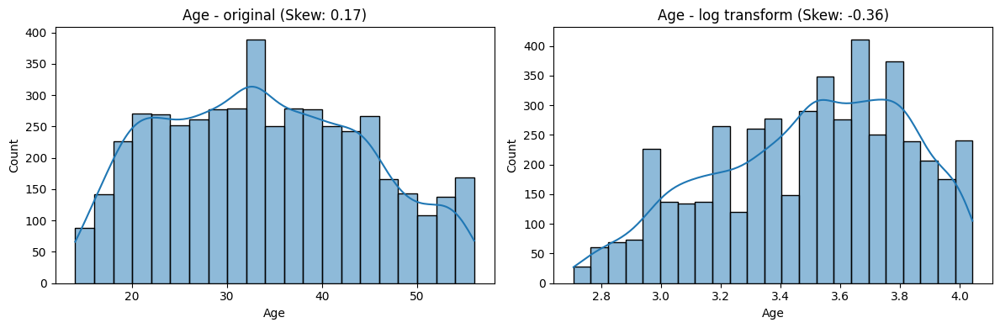

Age skew=0.17


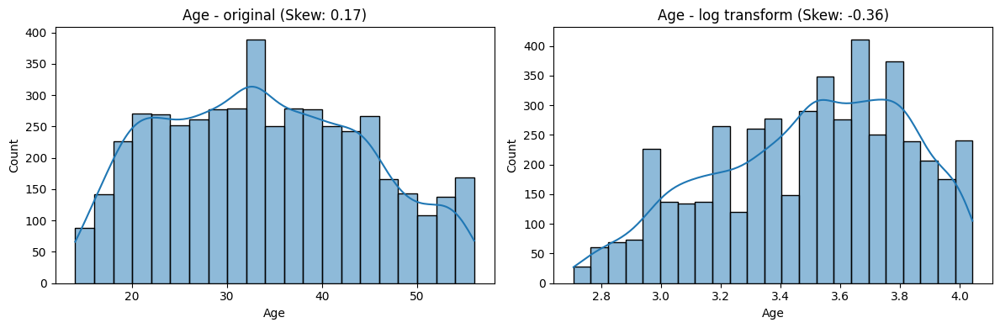

Annual_Income skew=13.63


Age skew=0.17


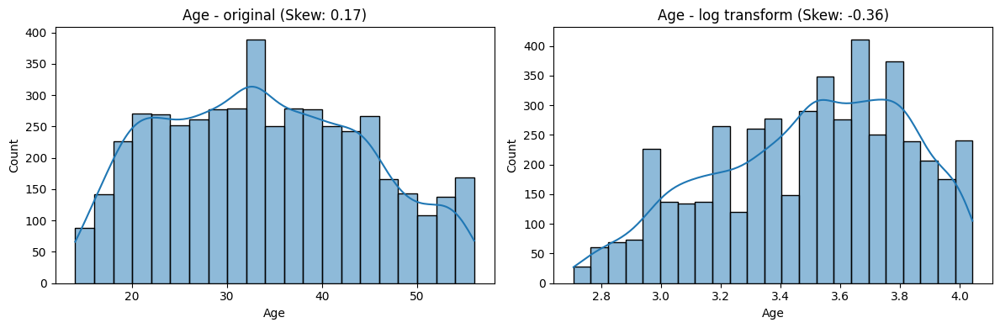

Annual_Income skew=13.63


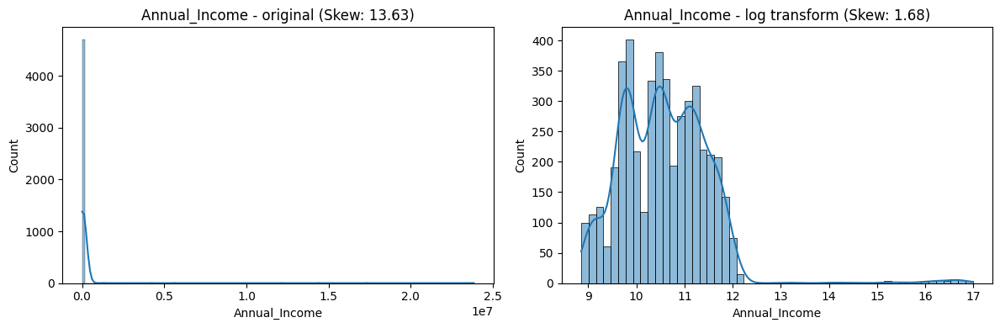

Age skew=0.17


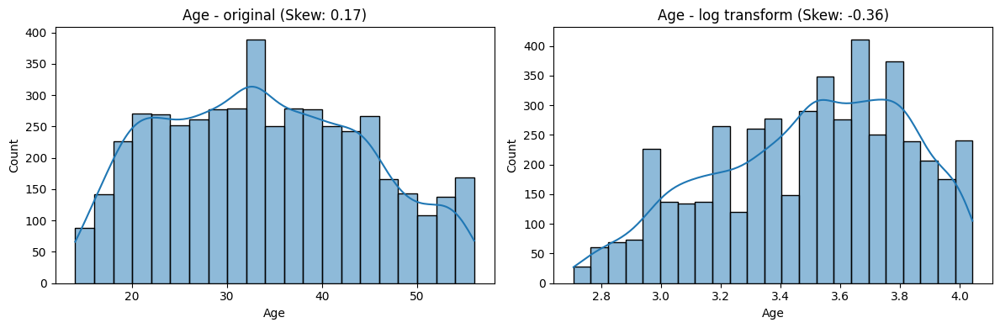

Annual_Income skew=13.63


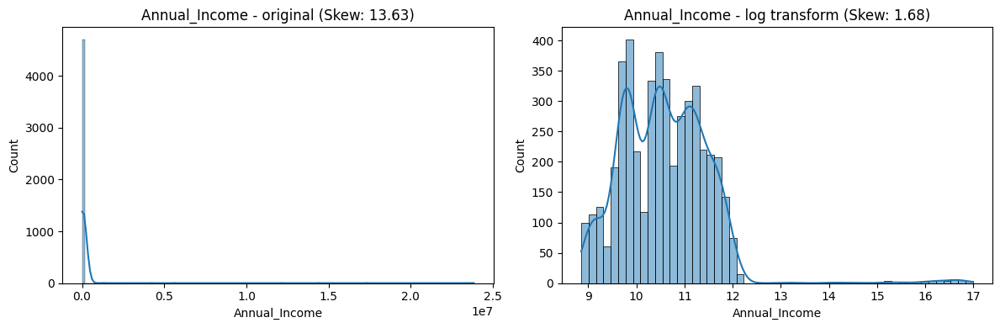

Monthly_Inhand_Salary skew=1.16


Age skew=0.17


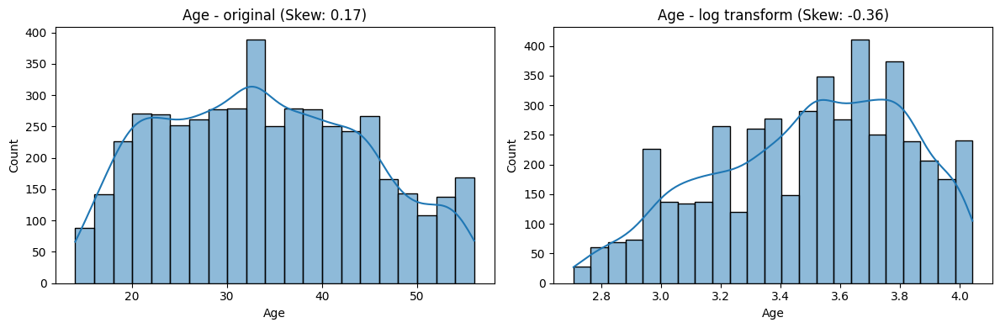

Annual_Income skew=13.63


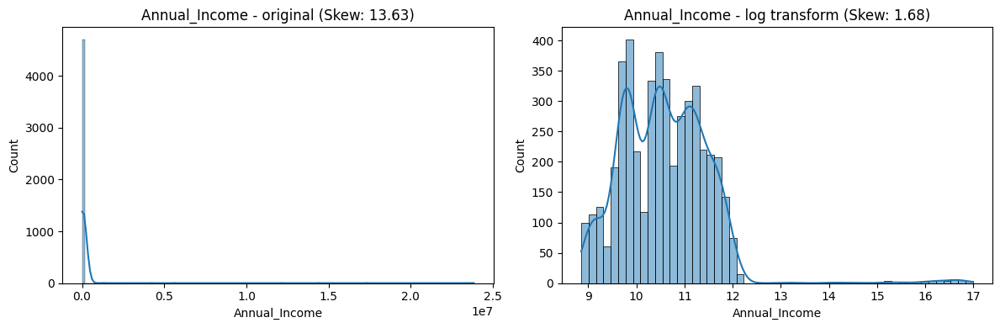

Monthly_Inhand_Salary skew=1.16


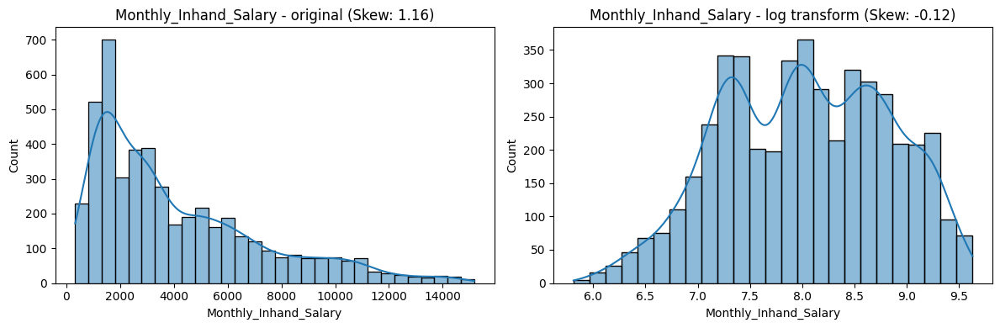

Age skew=0.17


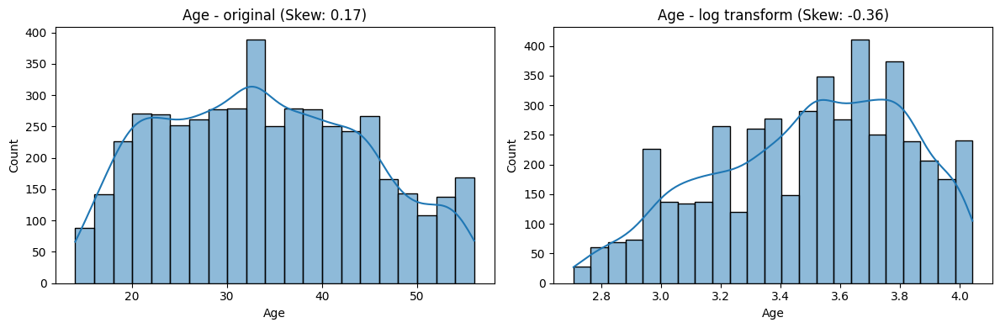

Annual_Income skew=13.63


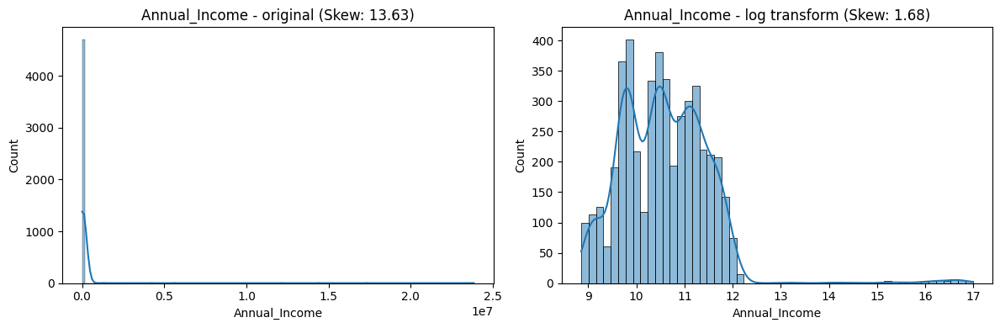

Monthly_Inhand_Salary skew=1.16


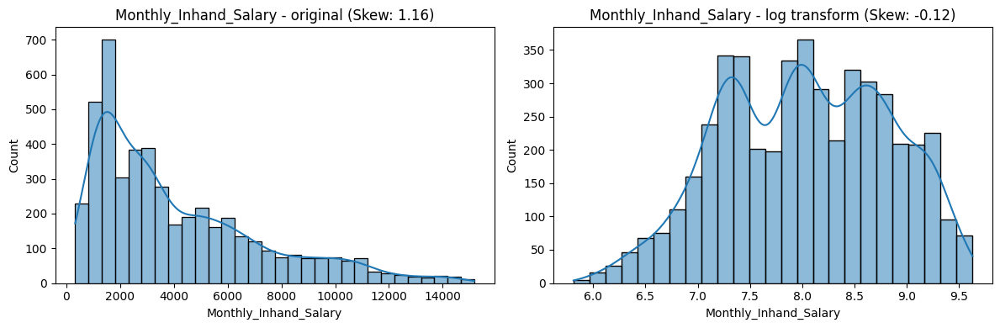

Num_Bank_Accounts skew=-0.16


Age skew=0.17


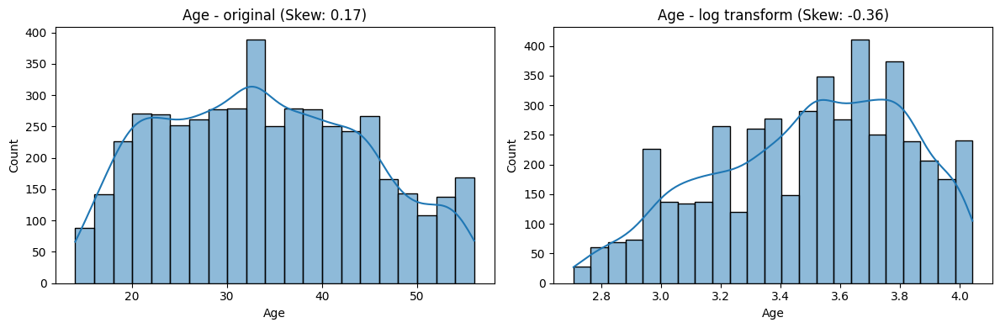

Annual_Income skew=13.63


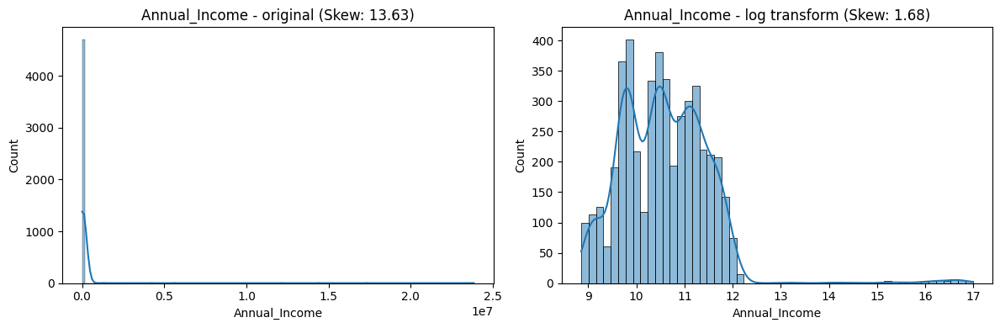

Monthly_Inhand_Salary skew=1.16


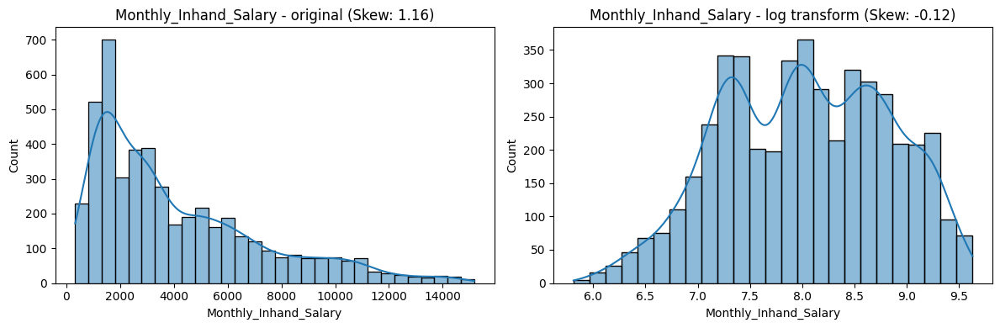

Num_Bank_Accounts skew=-0.16


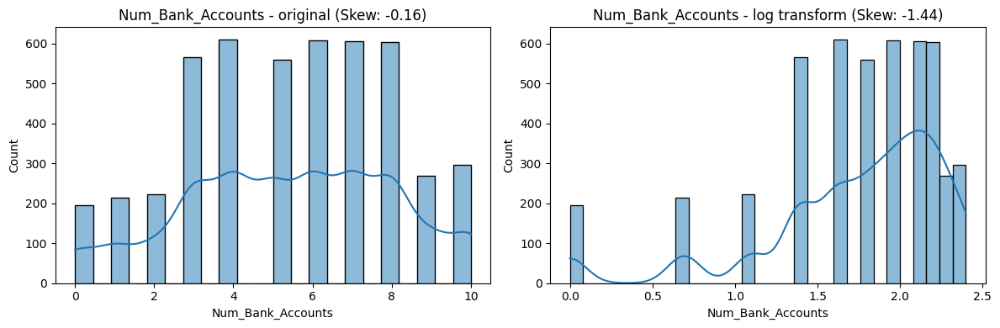

Age skew=0.17


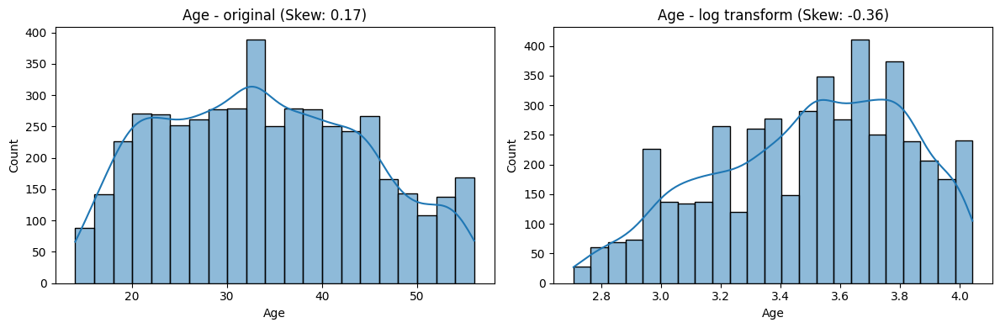

Annual_Income skew=13.63


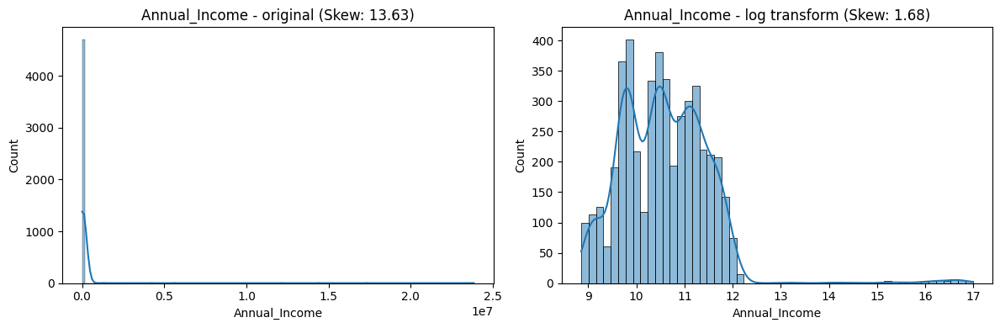

Monthly_Inhand_Salary skew=1.16


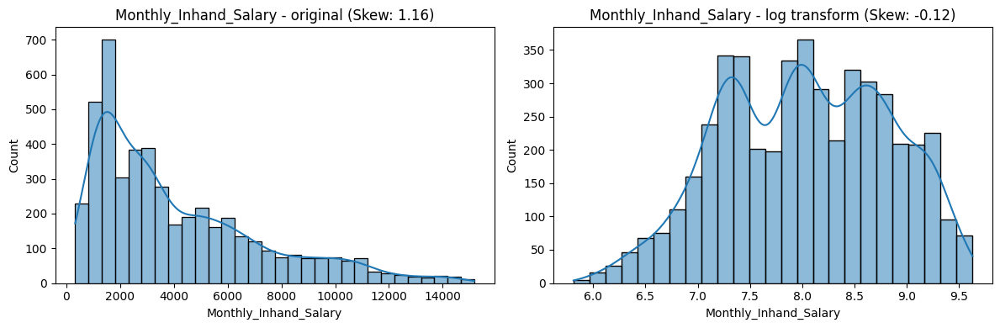

Num_Bank_Accounts skew=-0.16


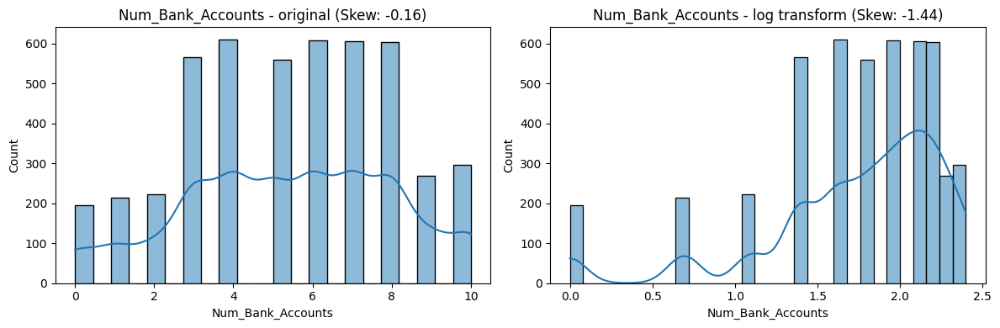

Num_Credit_Card skew=0.25


Age skew=0.17


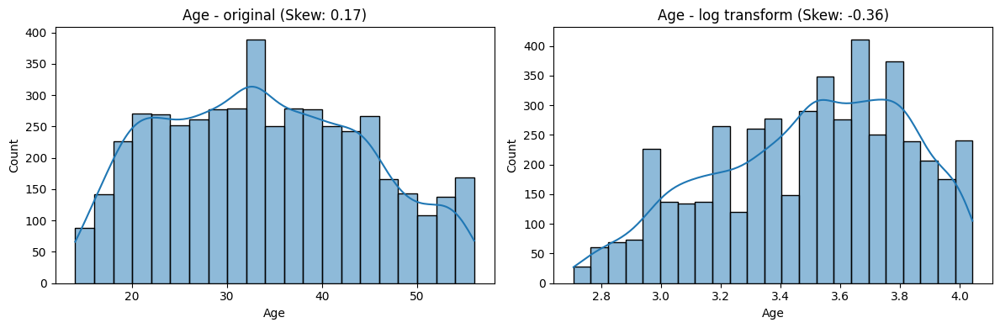

Annual_Income skew=13.63


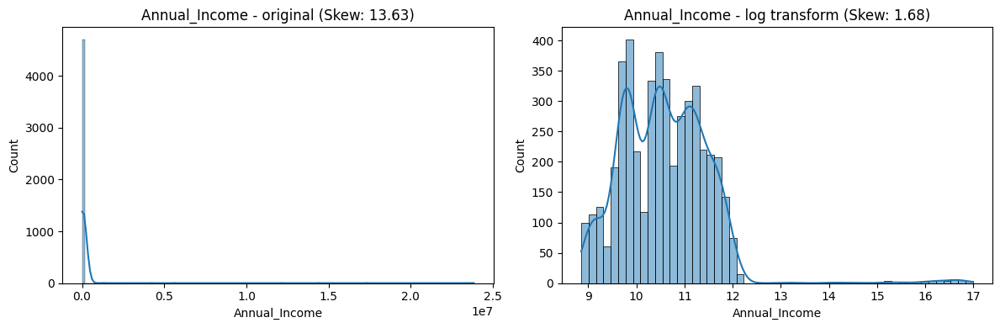

Monthly_Inhand_Salary skew=1.16


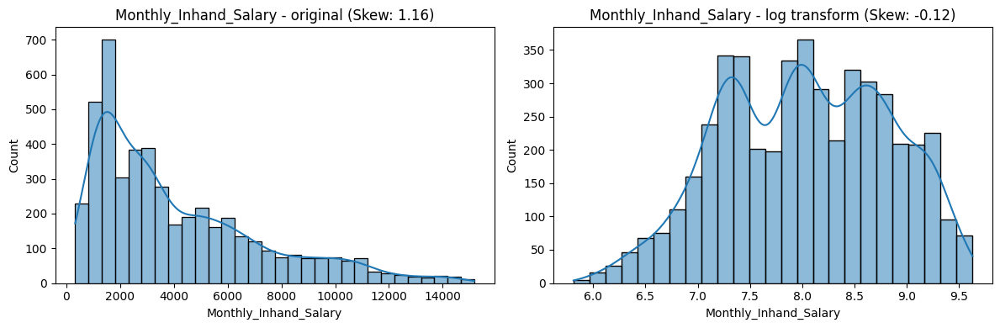

Num_Bank_Accounts skew=-0.16


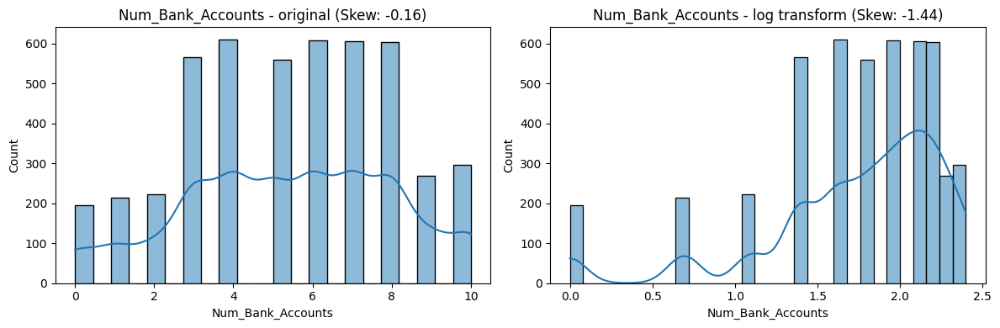

Num_Credit_Card skew=0.25


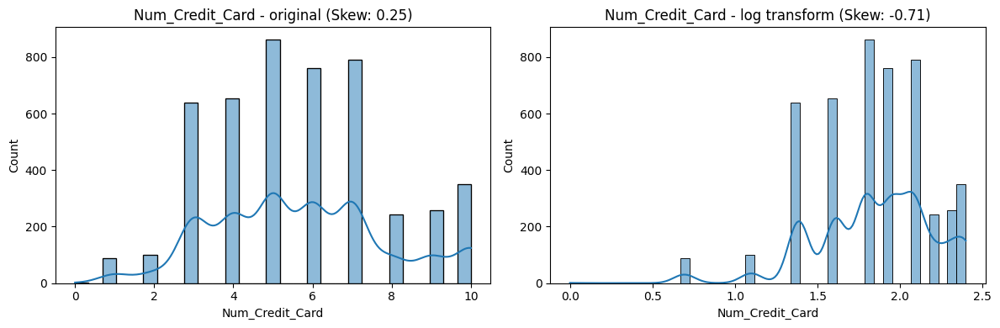

Age skew=0.17


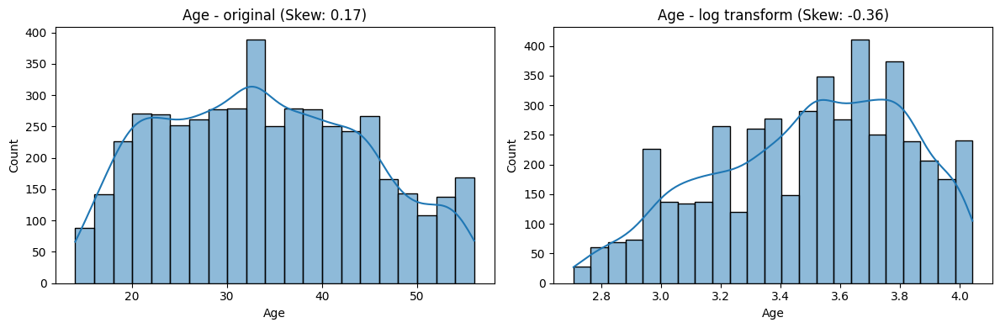

Annual_Income skew=13.63


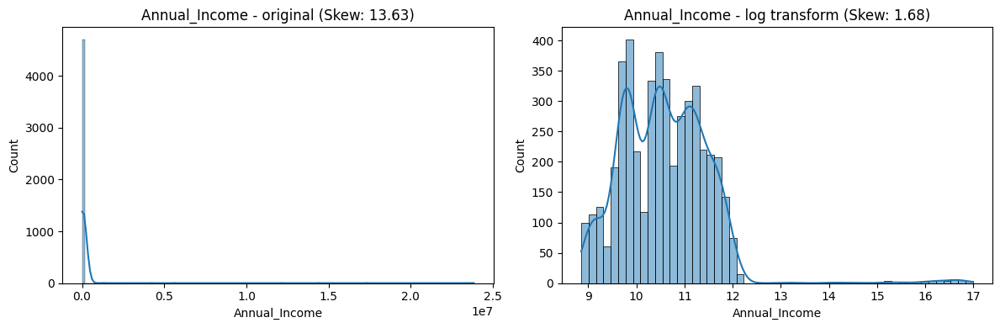

Monthly_Inhand_Salary skew=1.16


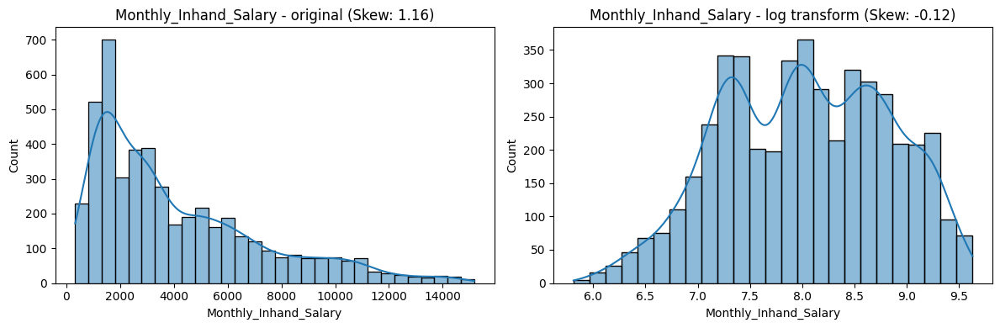

Num_Bank_Accounts skew=-0.16


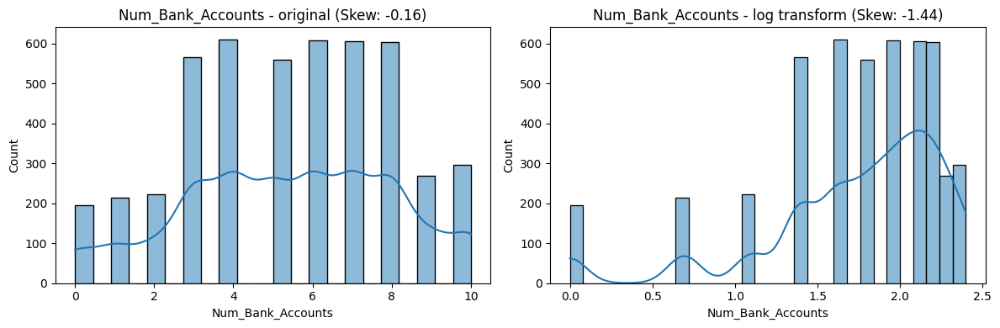

Num_Credit_Card skew=0.25


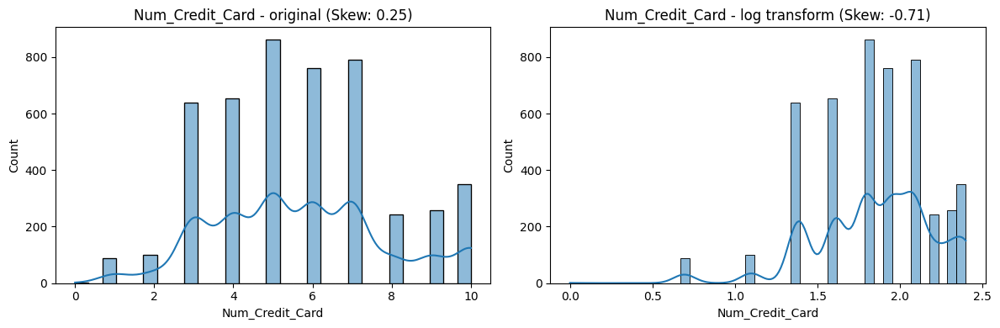

Interest_Rate skew=0.51


Age skew=0.17


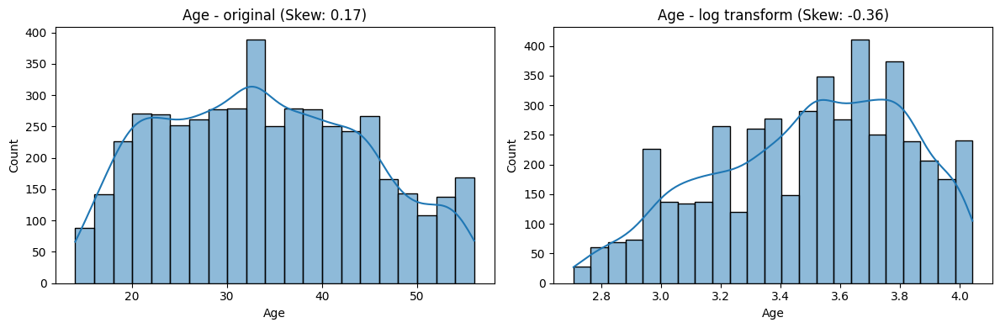

Annual_Income skew=13.63


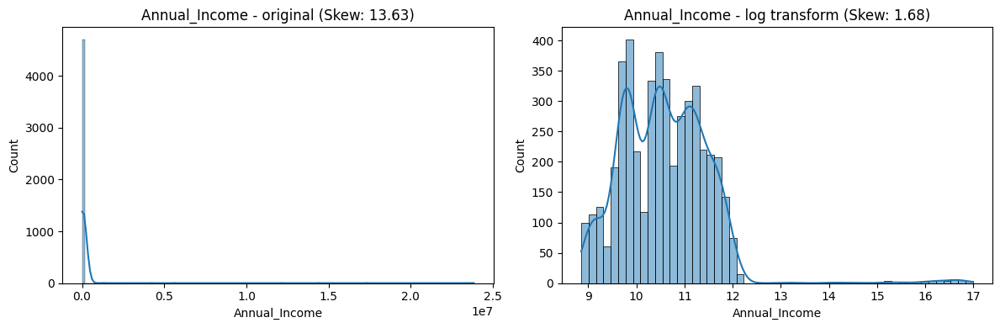

Monthly_Inhand_Salary skew=1.16


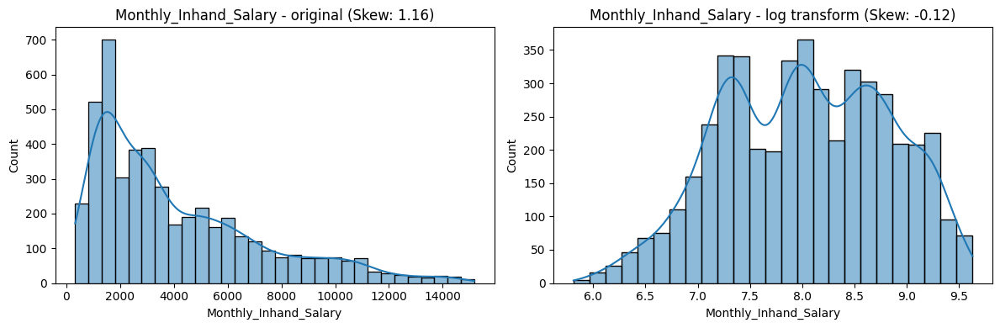

Num_Bank_Accounts skew=-0.16


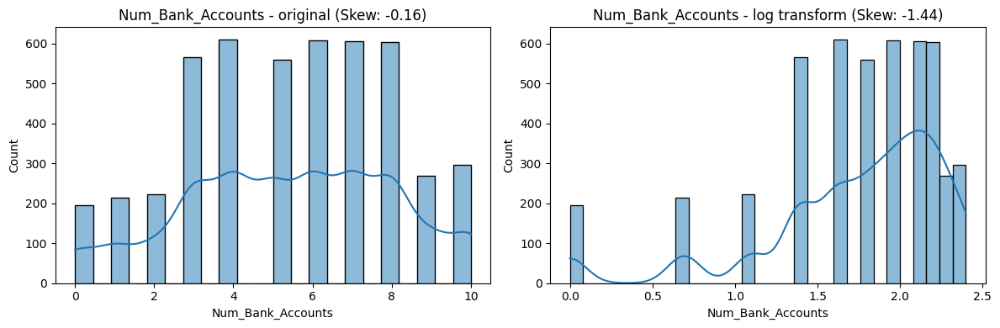

Num_Credit_Card skew=0.25


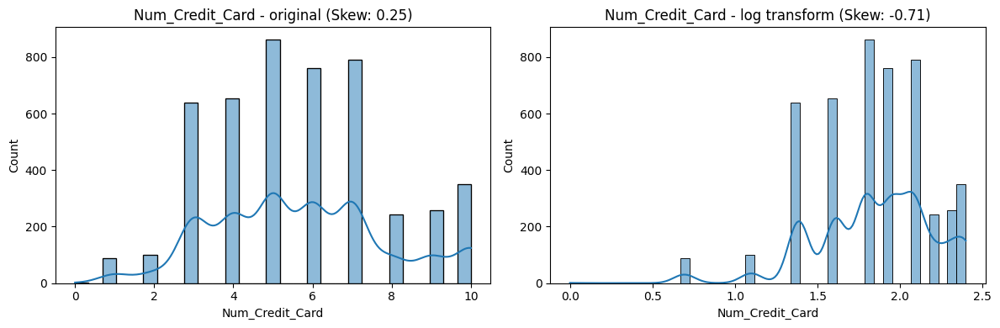

Interest_Rate skew=0.51


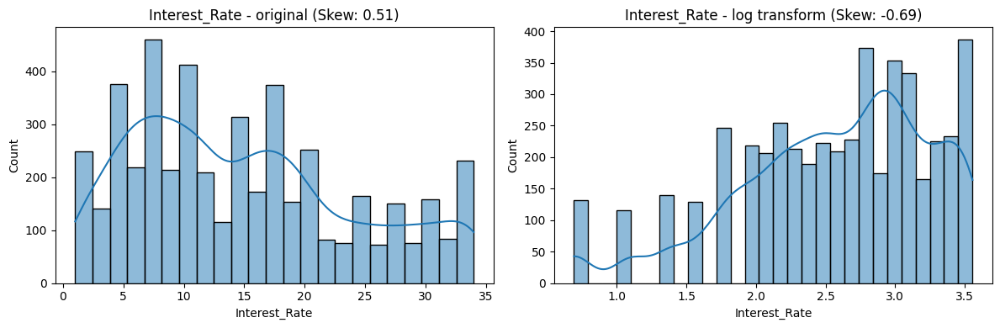

Age skew=0.17


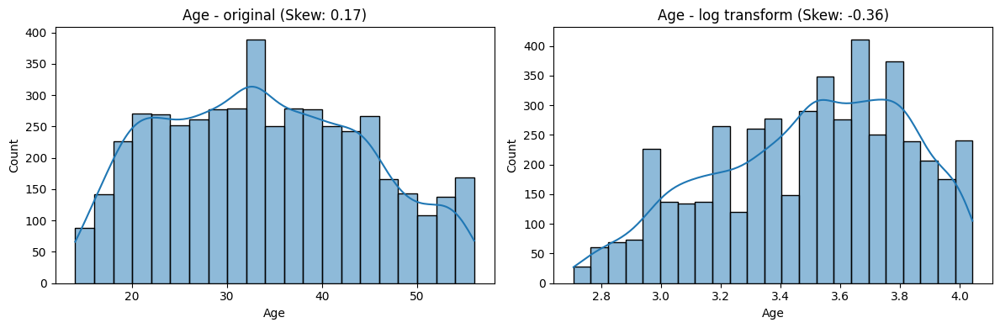

Annual_Income skew=13.63


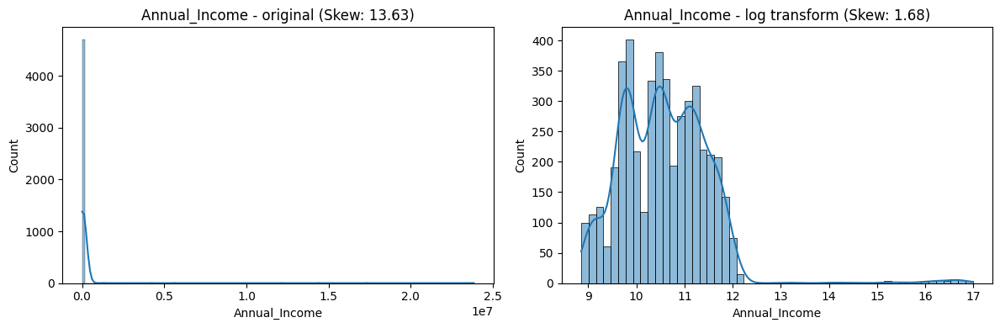

Monthly_Inhand_Salary skew=1.16


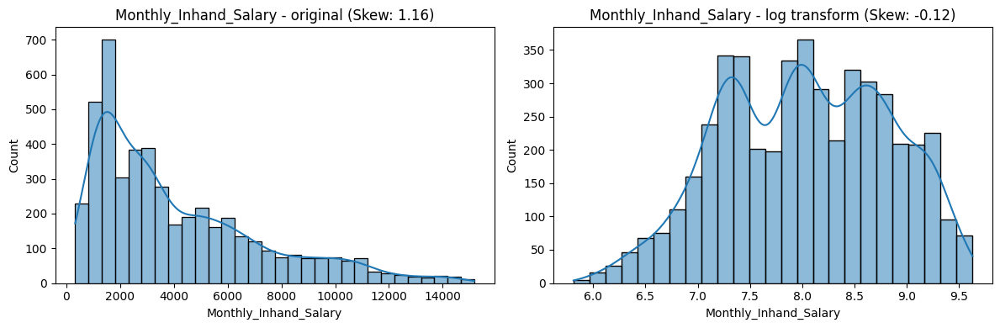

Num_Bank_Accounts skew=-0.16


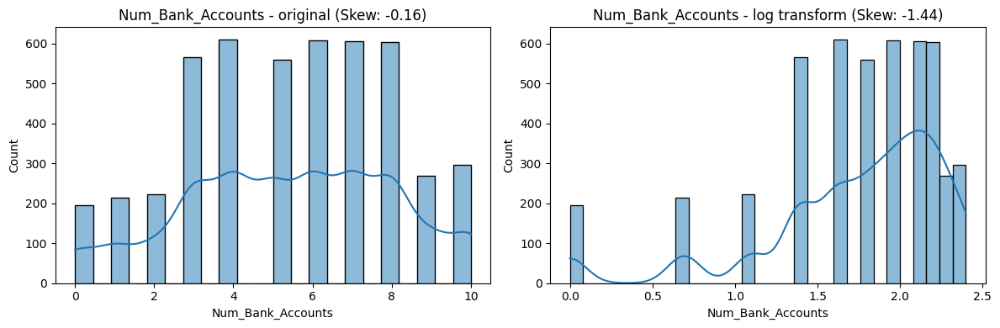

Num_Credit_Card skew=0.25


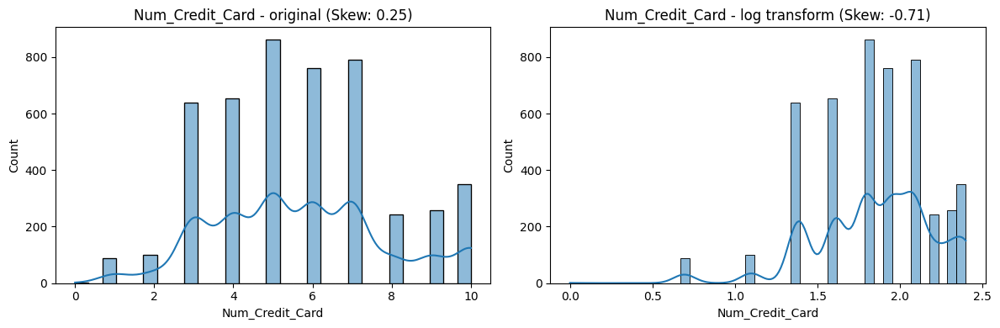

Interest_Rate skew=0.51


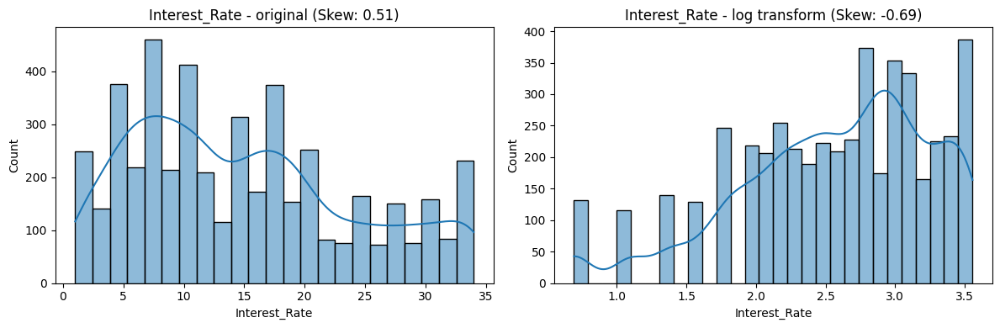

Num_of_Loan skew=0.47


Age skew=0.17


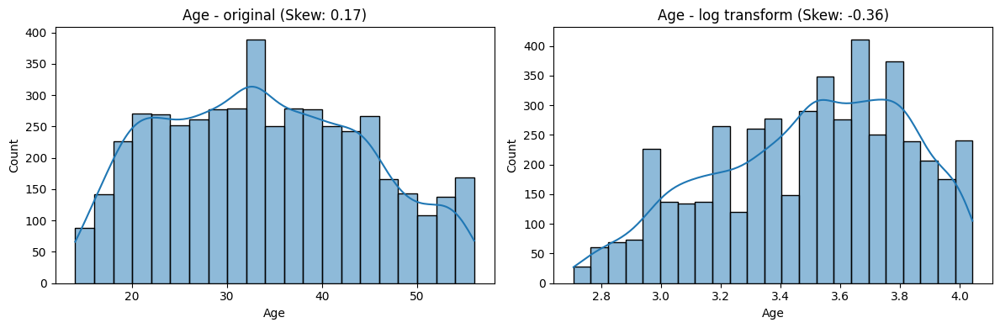

Annual_Income skew=13.63


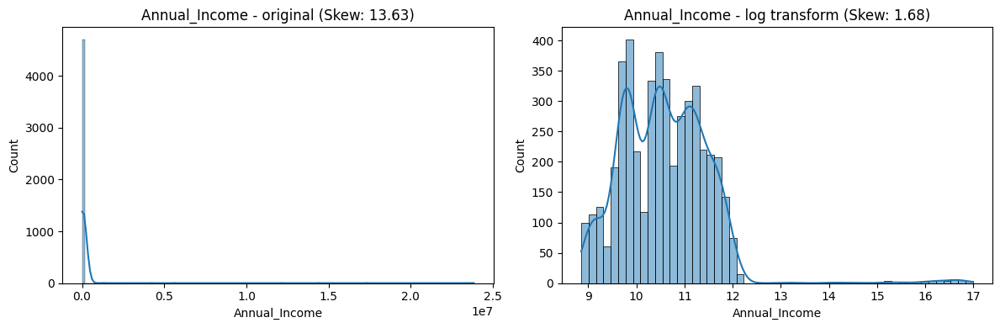

Monthly_Inhand_Salary skew=1.16


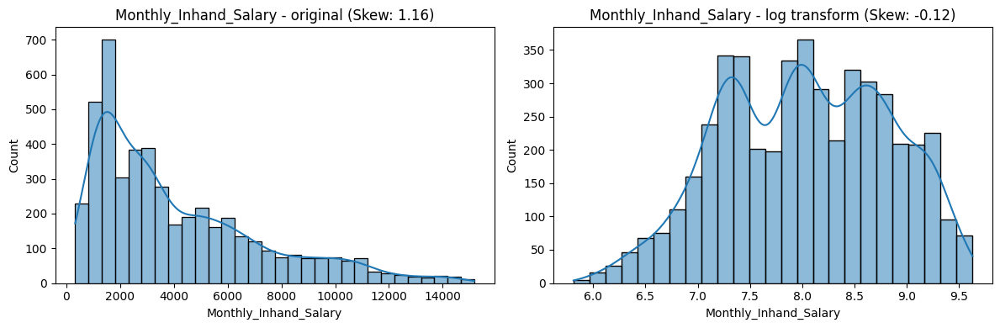

Num_Bank_Accounts skew=-0.16


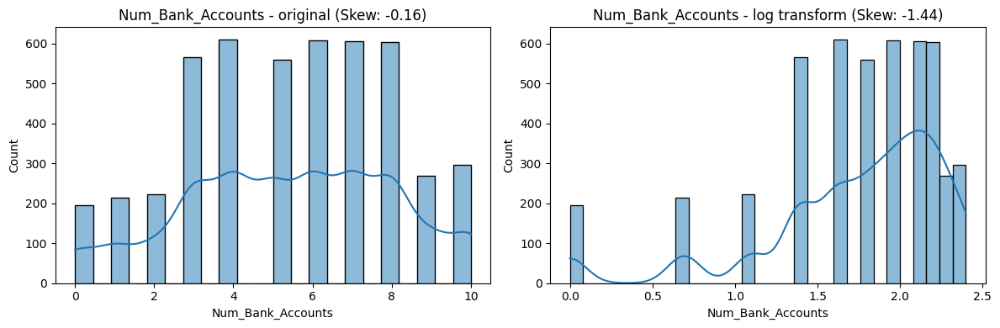

Num_Credit_Card skew=0.25


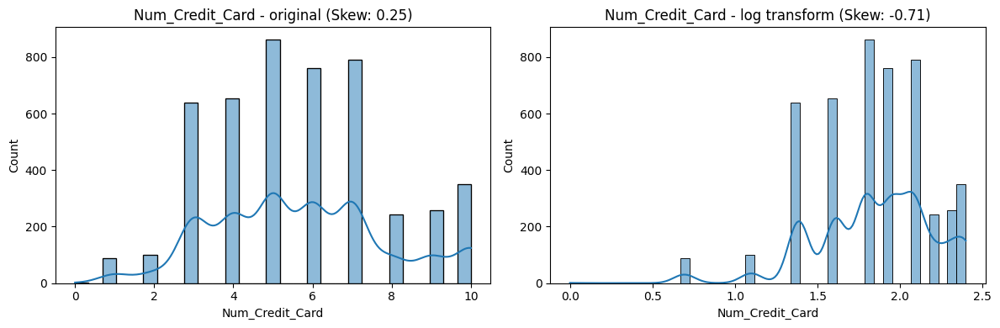

Interest_Rate skew=0.51


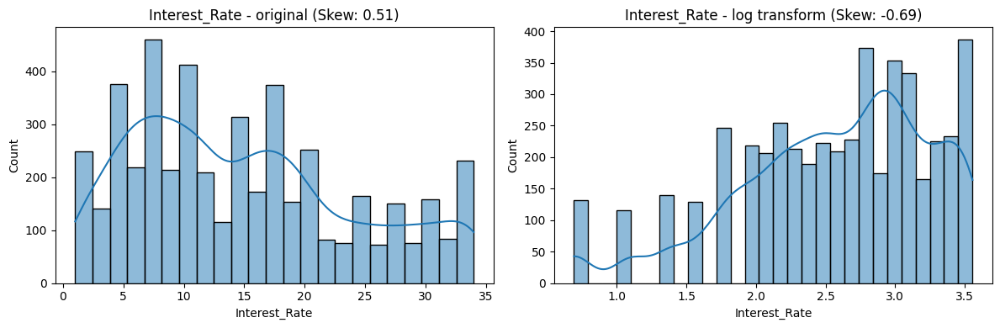

Num_of_Loan skew=0.47


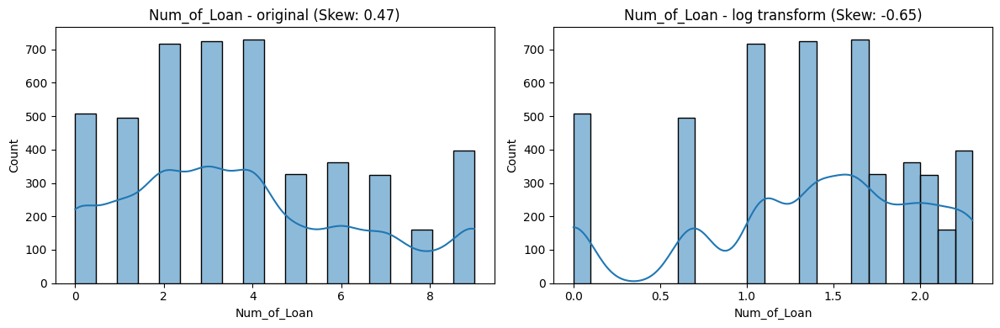

Age skew=0.17


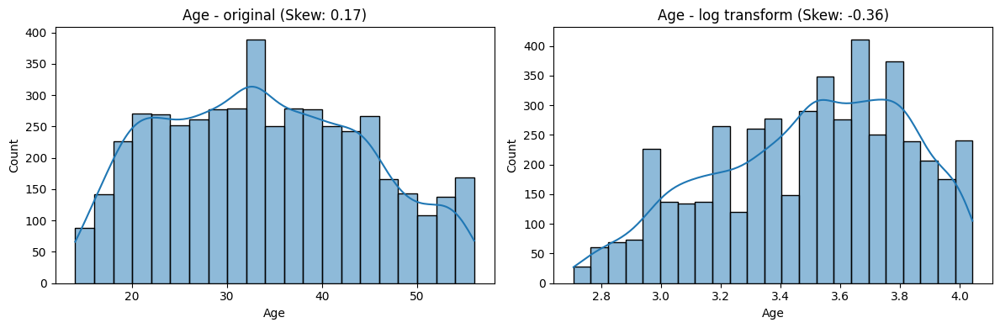

Annual_Income skew=13.63


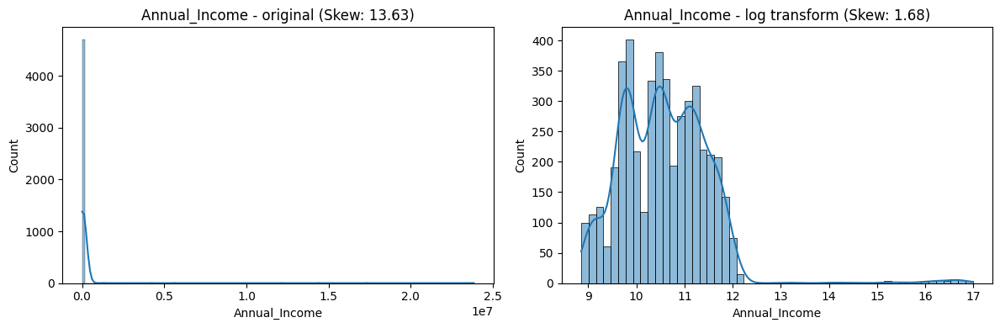

Monthly_Inhand_Salary skew=1.16


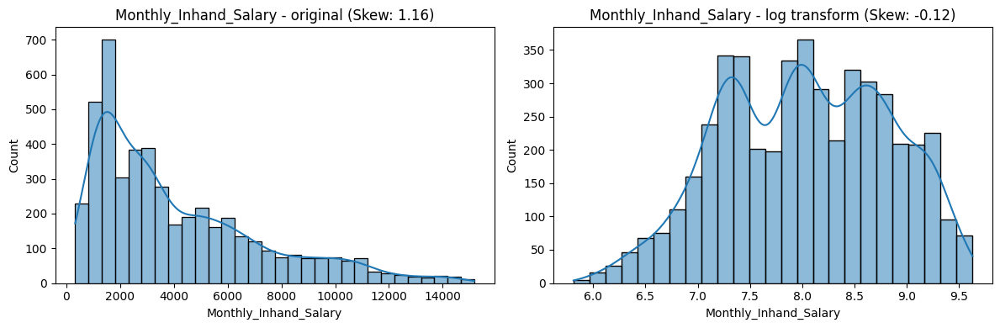

Num_Bank_Accounts skew=-0.16


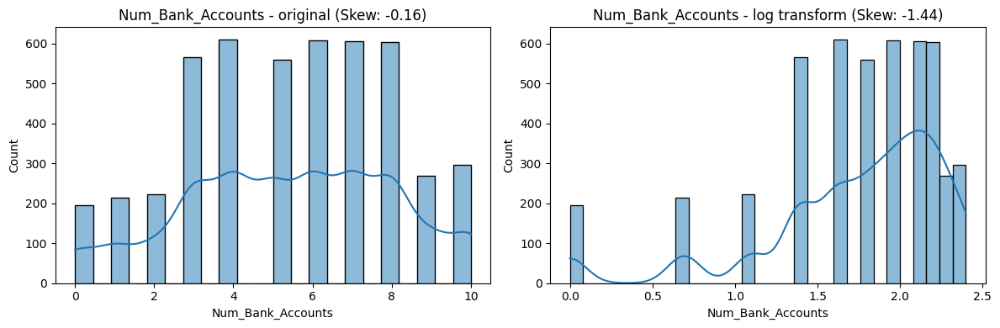

Num_Credit_Card skew=0.25


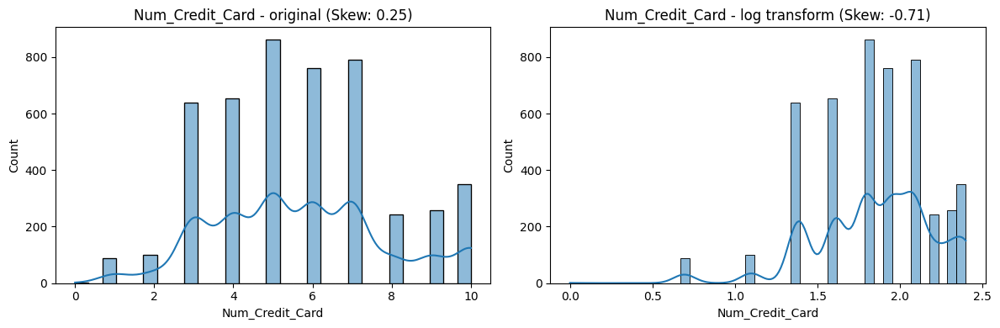

Interest_Rate skew=0.51


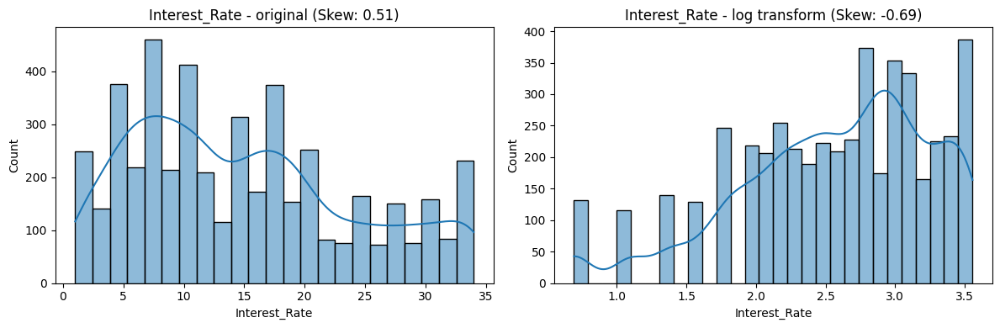

Num_of_Loan skew=0.47


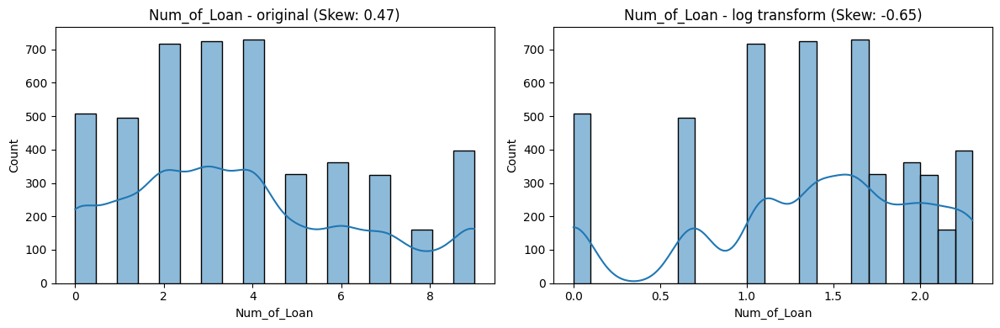

Delay_from_due_date skew=1.01


Age skew=0.17


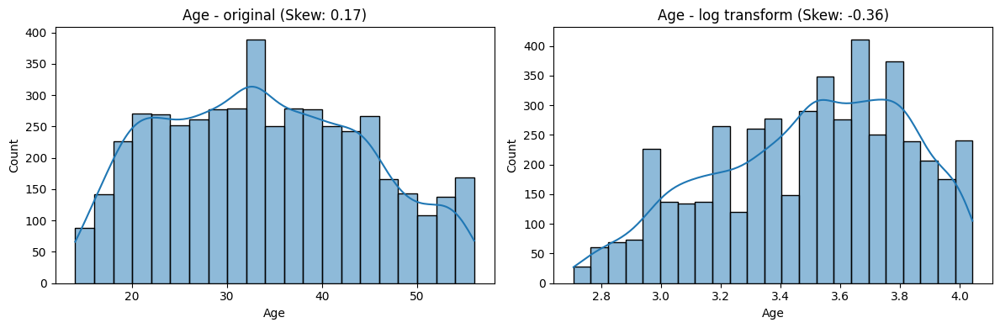

Annual_Income skew=13.63


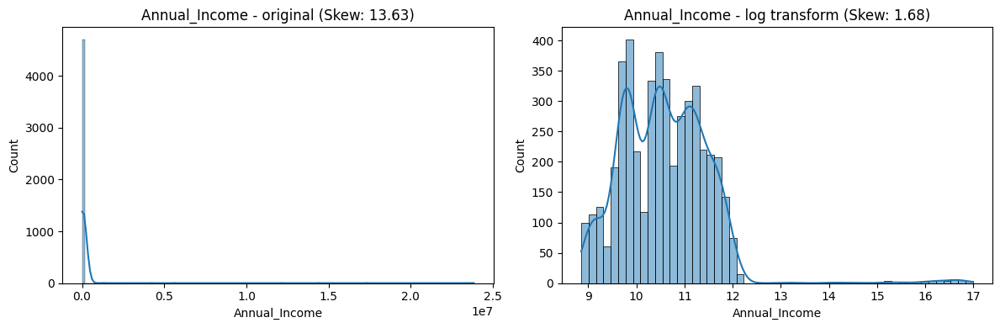

Monthly_Inhand_Salary skew=1.16


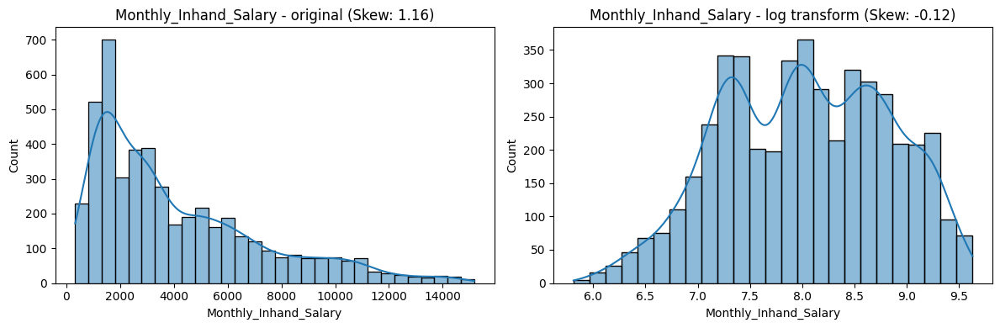

Num_Bank_Accounts skew=-0.16


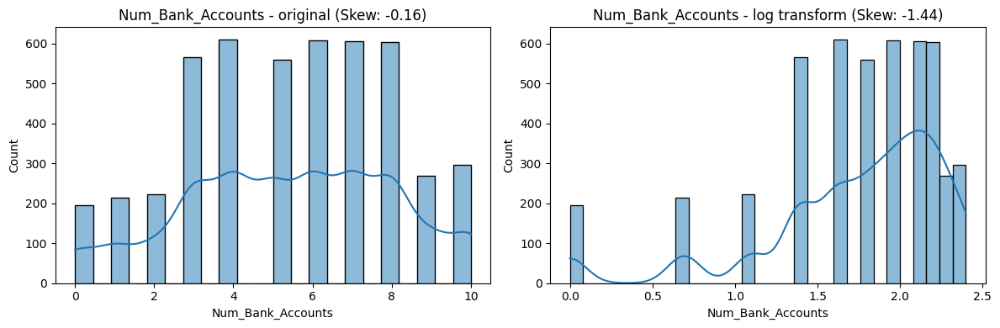

Num_Credit_Card skew=0.25


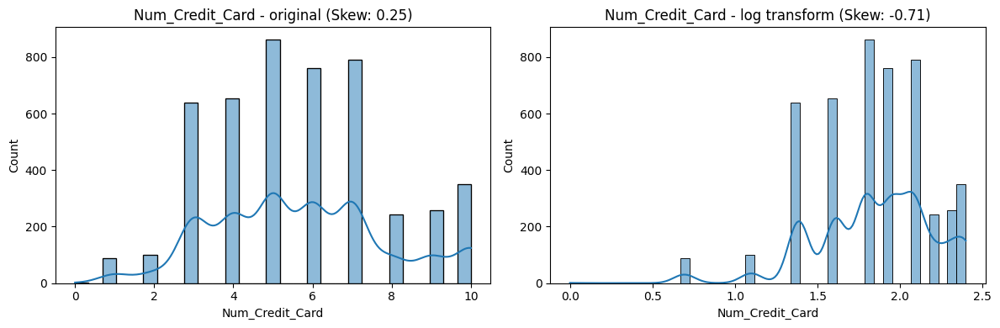

Interest_Rate skew=0.51


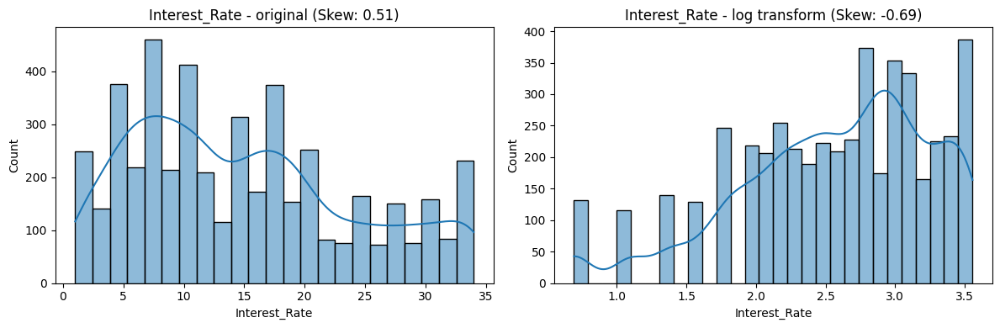

Num_of_Loan skew=0.47


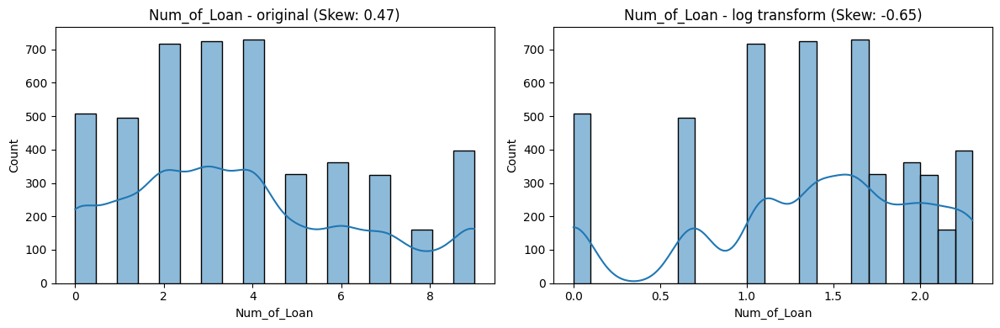

Delay_from_due_date skew=1.01


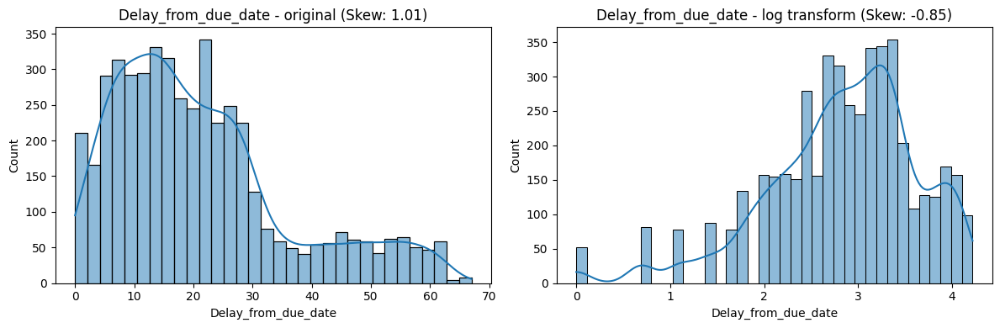

Age skew=0.17


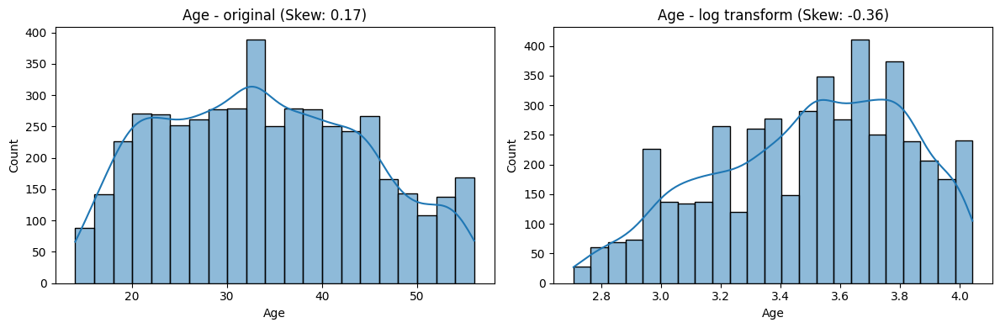

Annual_Income skew=13.63


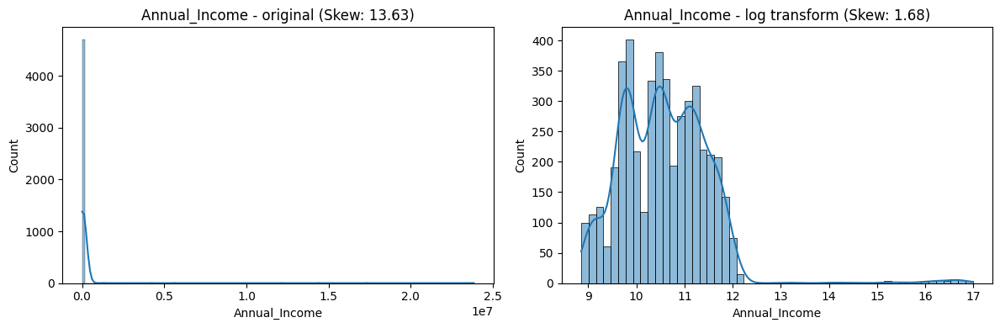

Monthly_Inhand_Salary skew=1.16


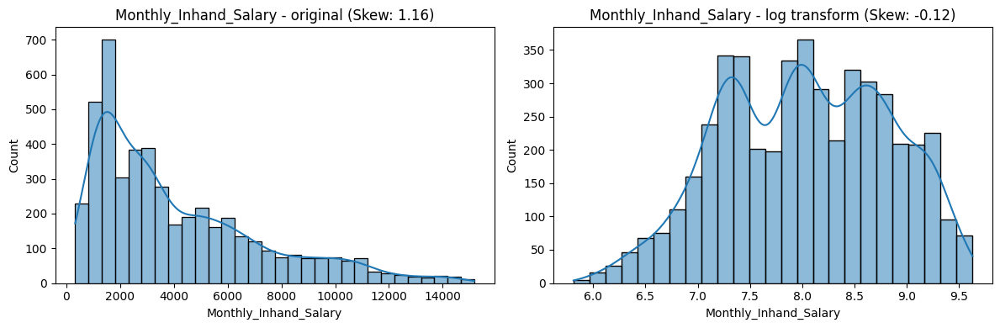

Num_Bank_Accounts skew=-0.16


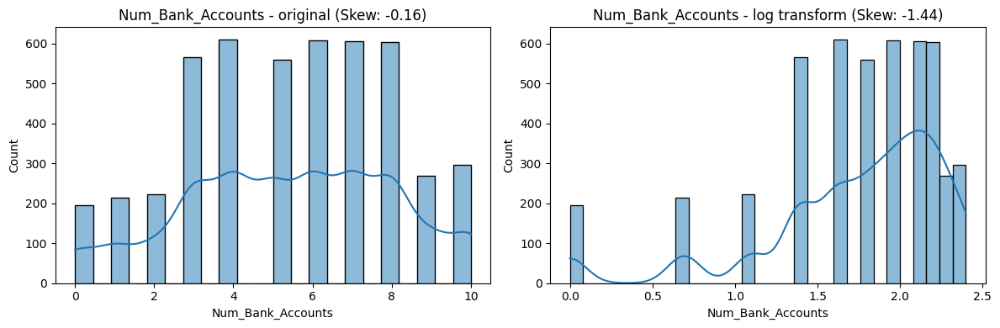

Num_Credit_Card skew=0.25


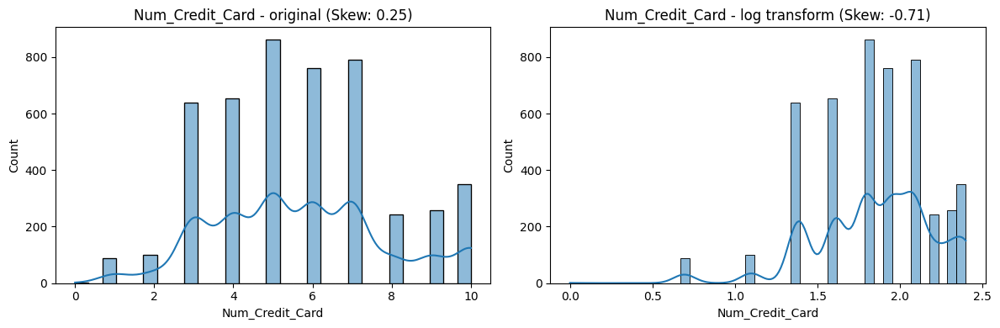

Interest_Rate skew=0.51


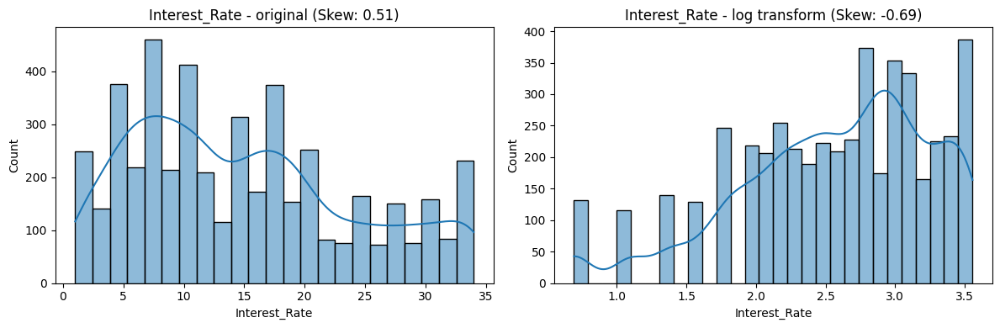

Num_of_Loan skew=0.47


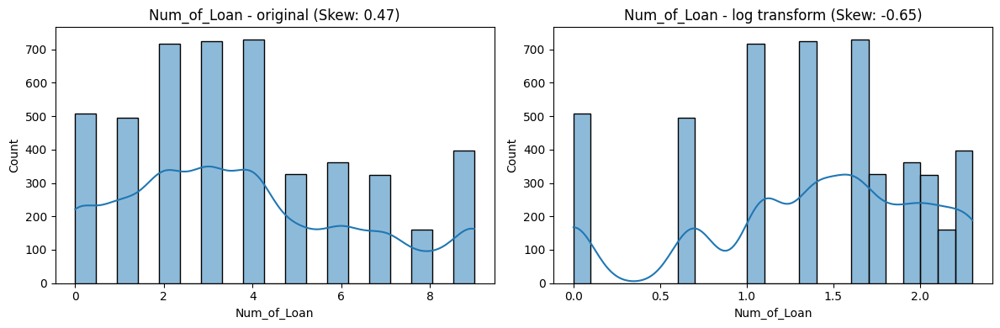

Delay_from_due_date skew=1.01


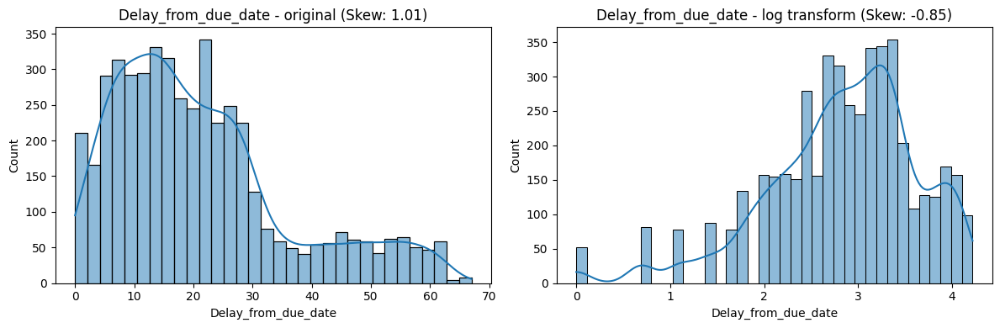

Num_of_Delayed_Payment skew=0.74


Age skew=0.17


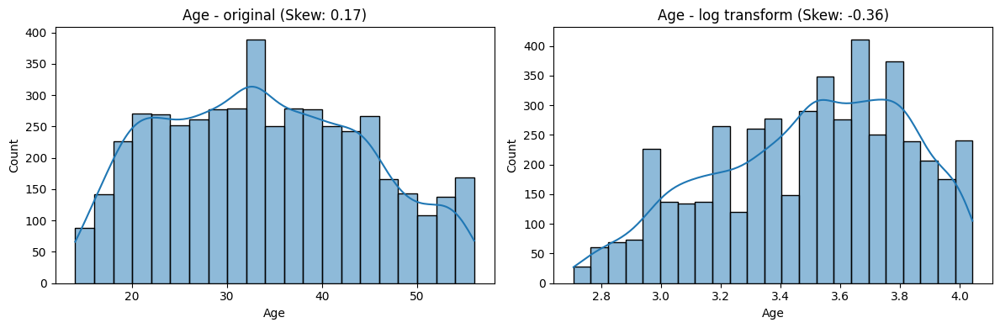

Annual_Income skew=13.63


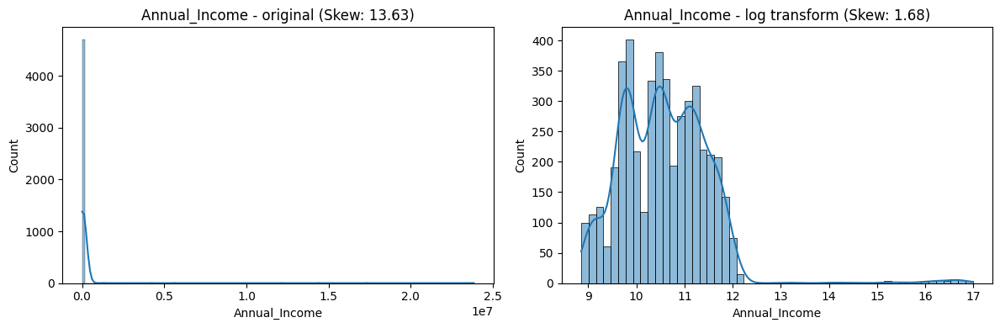

Monthly_Inhand_Salary skew=1.16


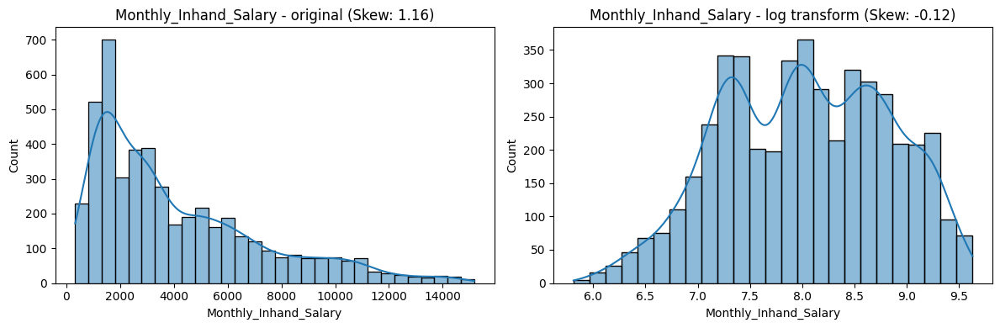

Num_Bank_Accounts skew=-0.16


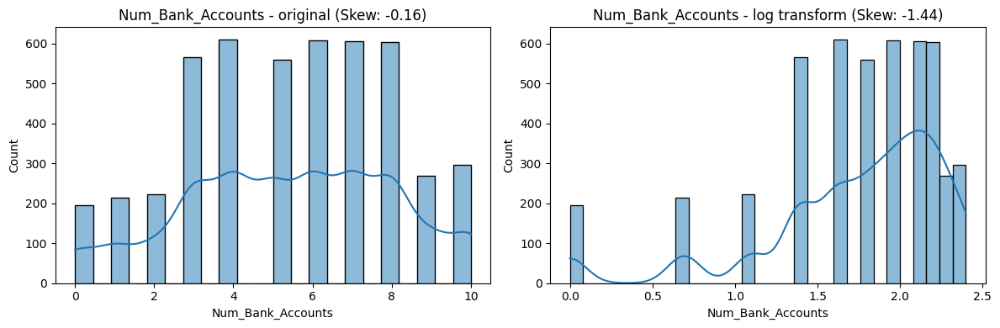

Num_Credit_Card skew=0.25


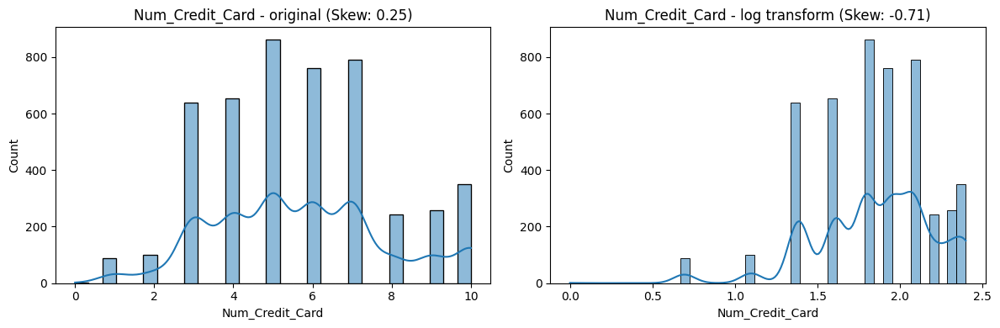

Interest_Rate skew=0.51


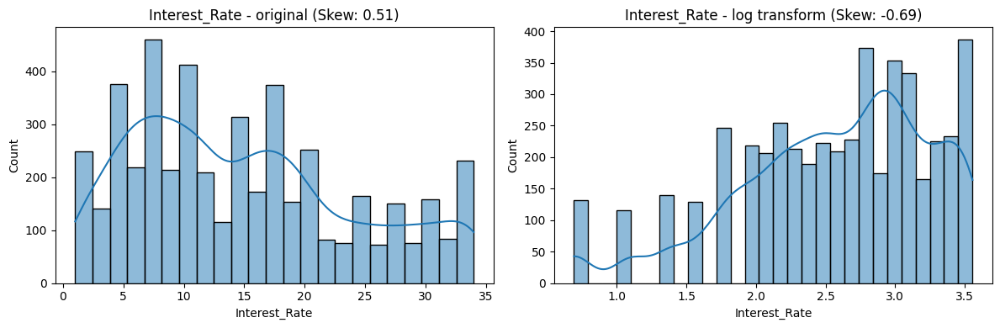

Num_of_Loan skew=0.47


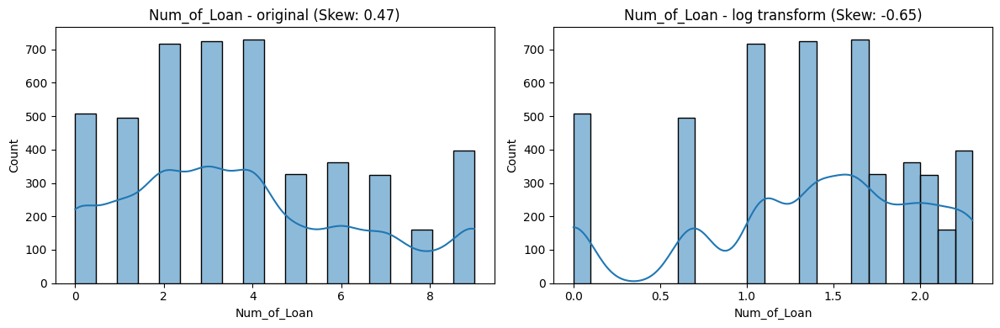

Delay_from_due_date skew=1.01


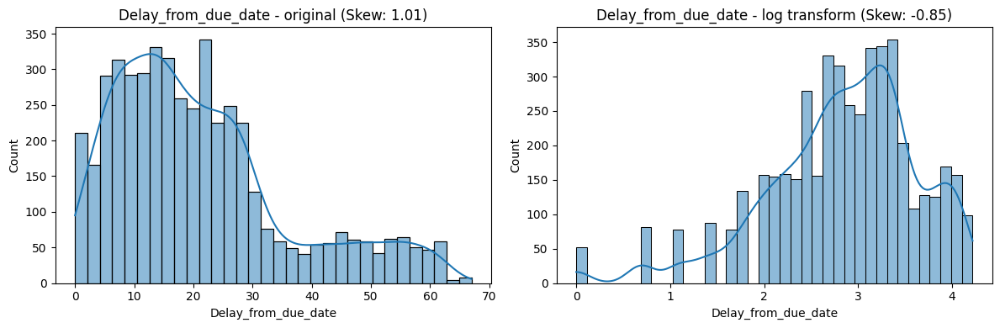

Num_of_Delayed_Payment skew=0.74


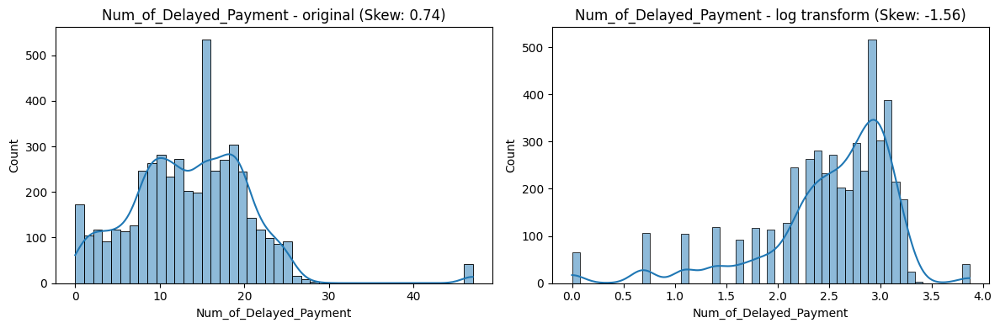

Age skew=0.17


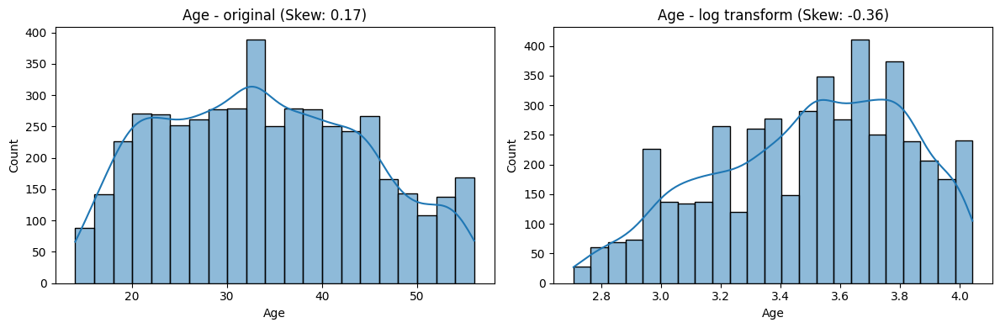

Annual_Income skew=13.63


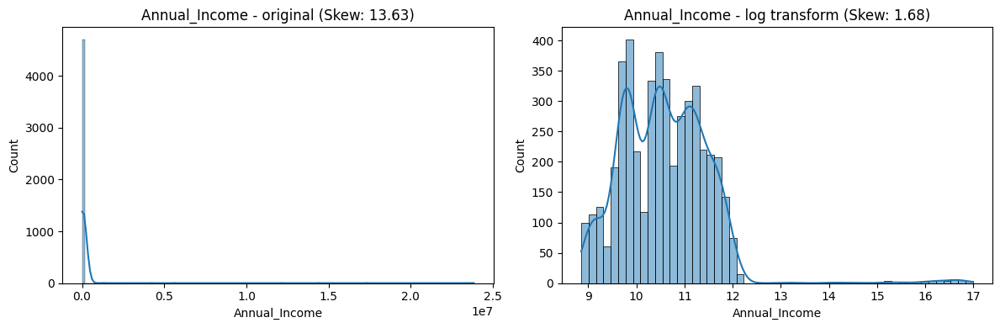

Monthly_Inhand_Salary skew=1.16


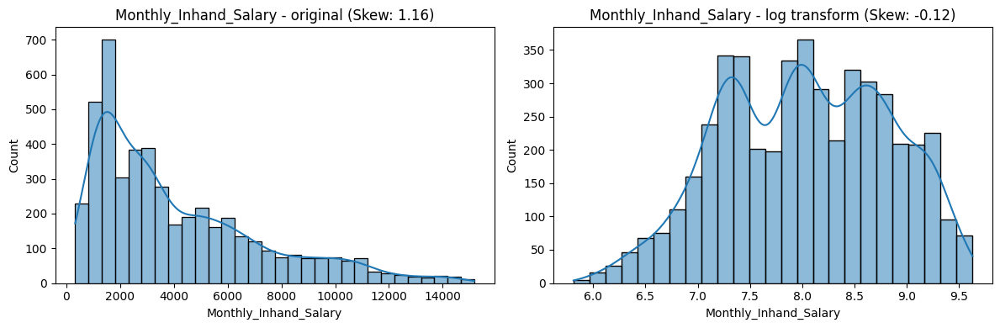

Num_Bank_Accounts skew=-0.16


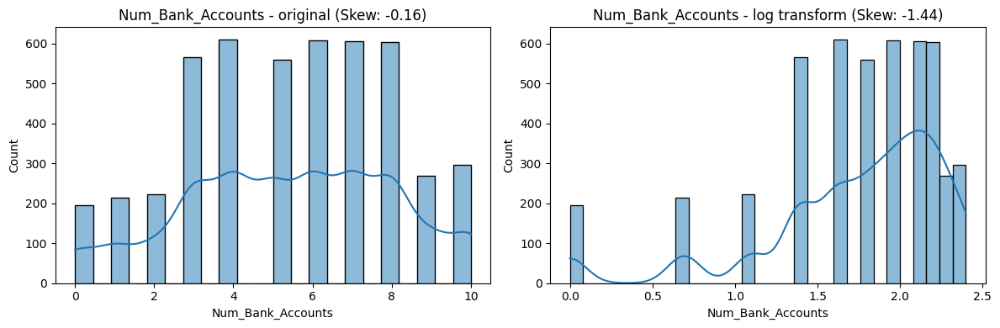

Num_Credit_Card skew=0.25


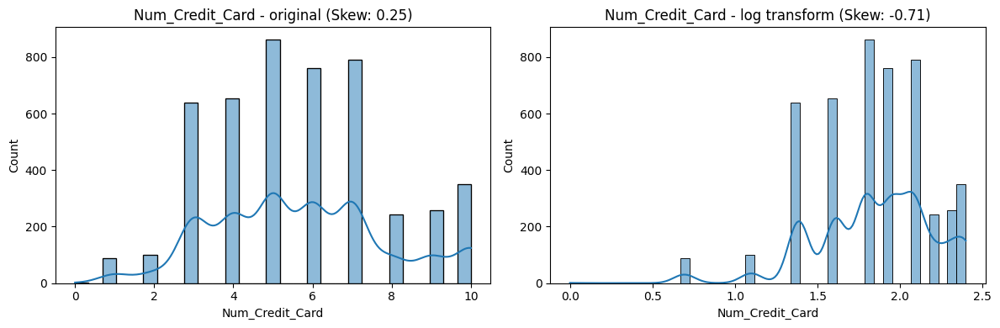

Interest_Rate skew=0.51


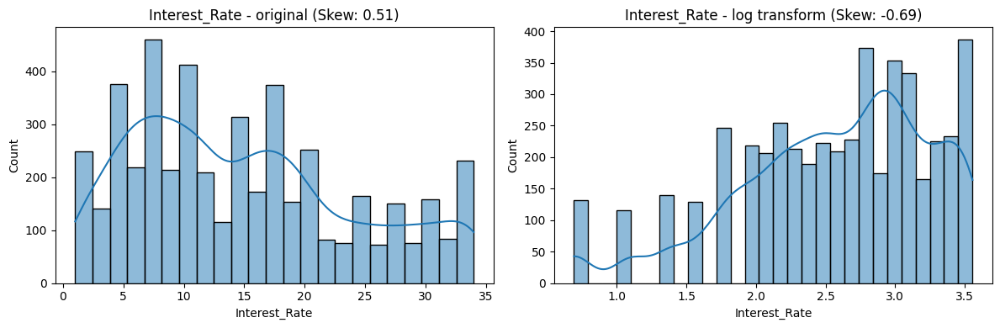

Num_of_Loan skew=0.47


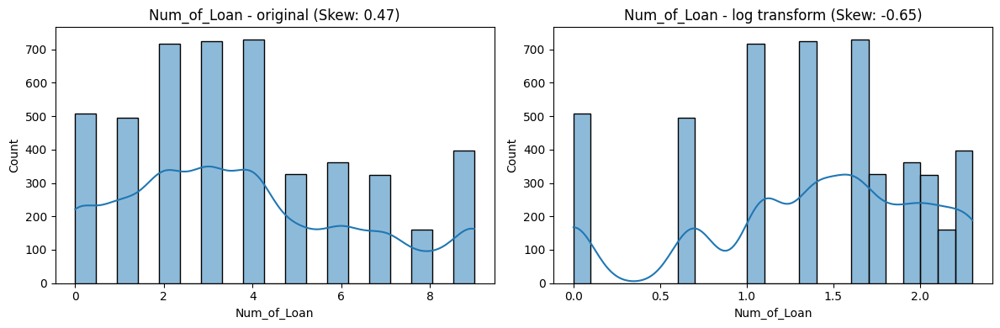

Delay_from_due_date skew=1.01


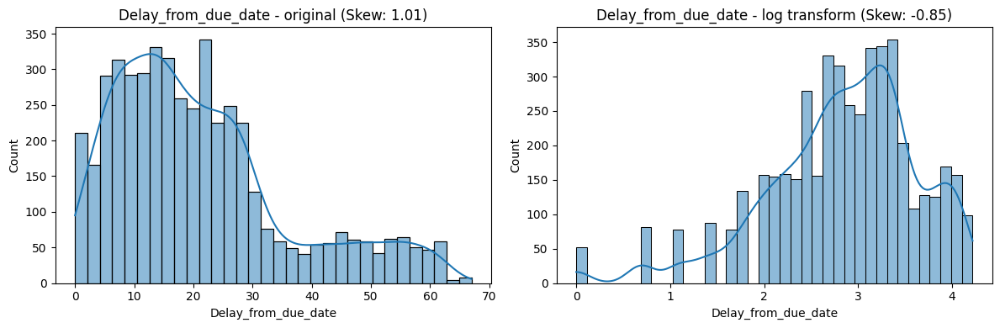

Num_of_Delayed_Payment skew=0.74


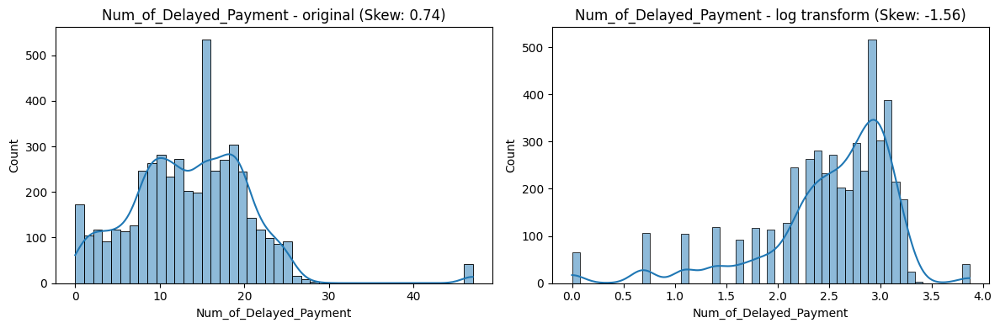

Changed_Credit_Limit skew=0.74


Age skew=0.17


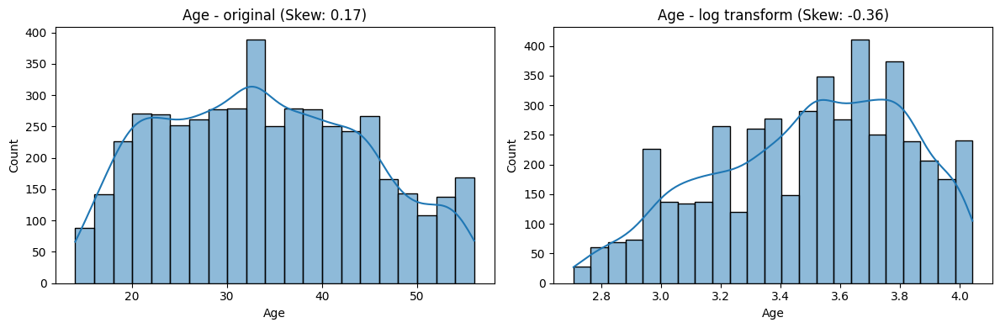

Annual_Income skew=13.63


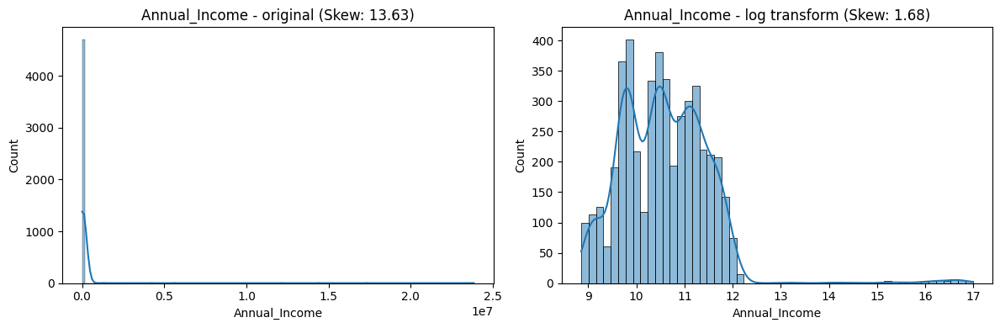

Monthly_Inhand_Salary skew=1.16


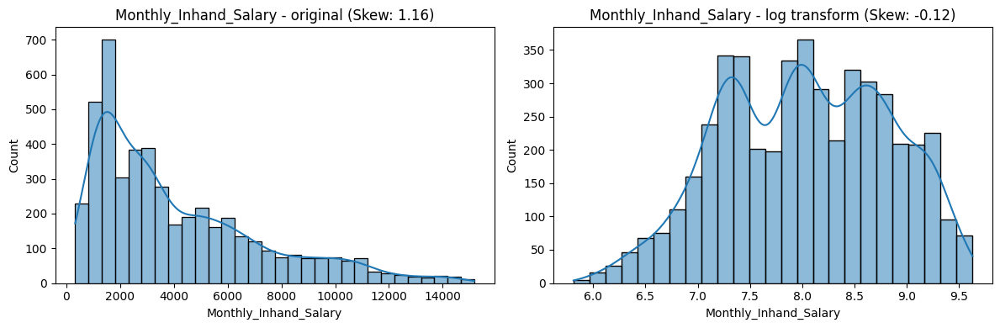

Num_Bank_Accounts skew=-0.16


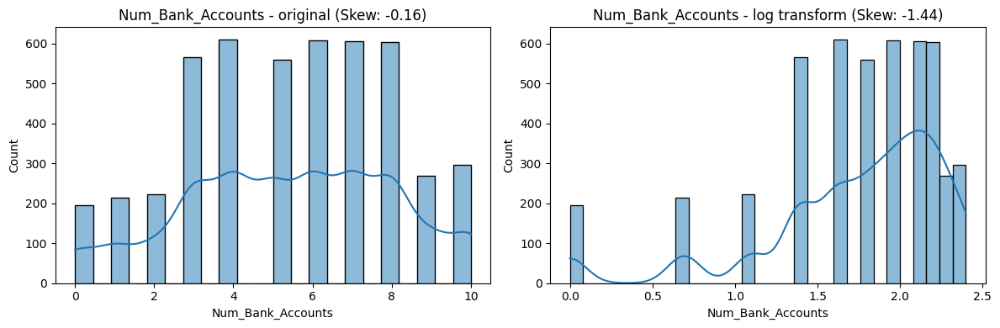

Num_Credit_Card skew=0.25


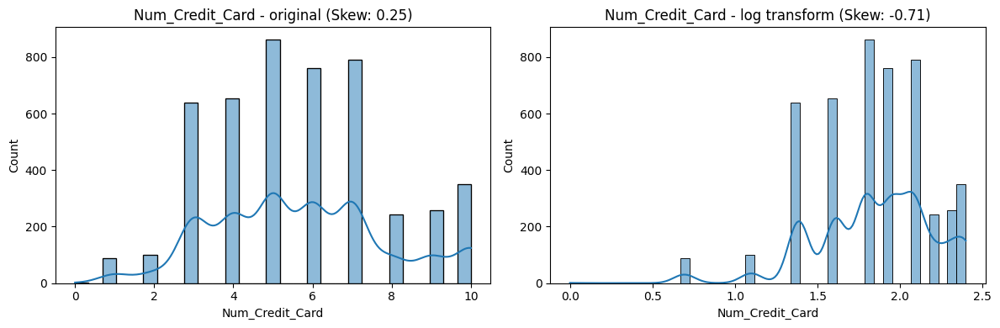

Interest_Rate skew=0.51


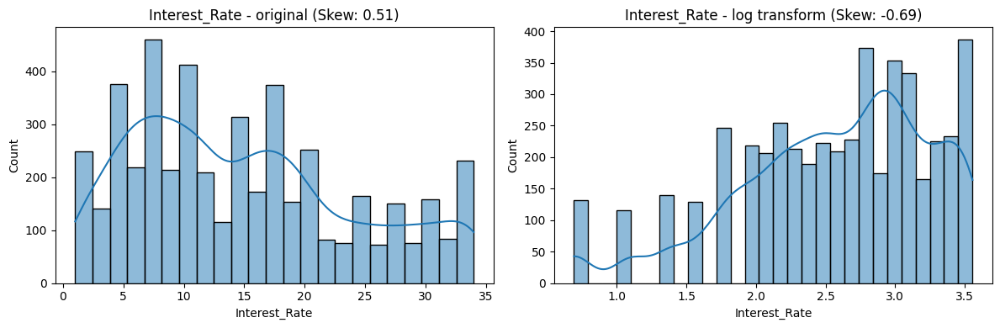

Num_of_Loan skew=0.47


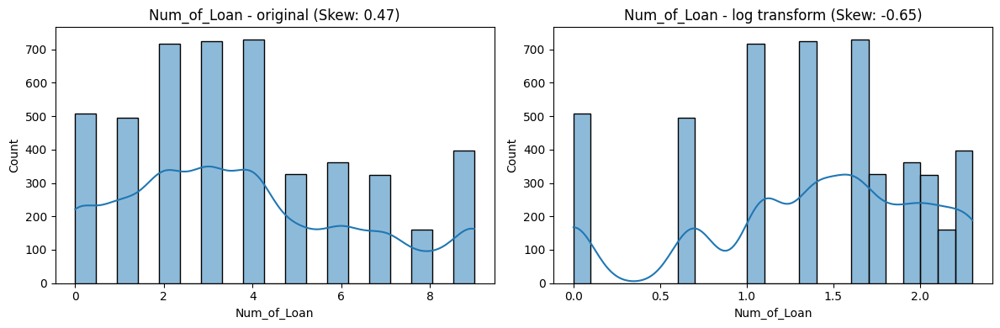

Delay_from_due_date skew=1.01


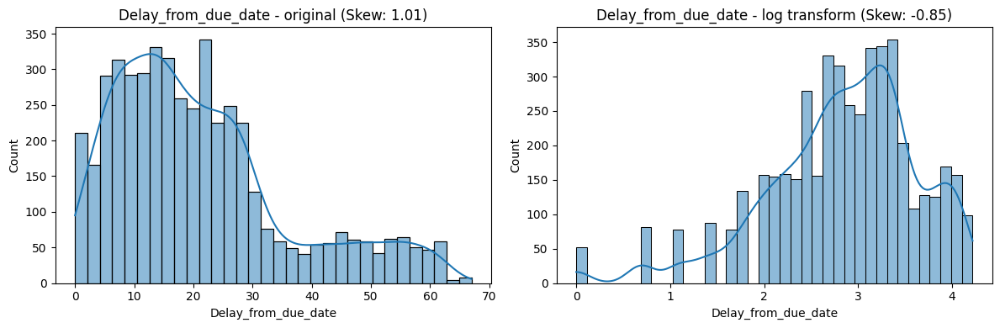

Num_of_Delayed_Payment skew=0.74


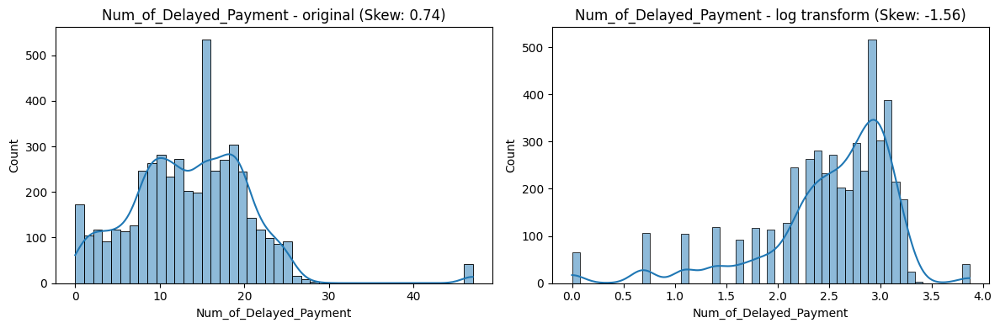

Changed_Credit_Limit skew=0.74


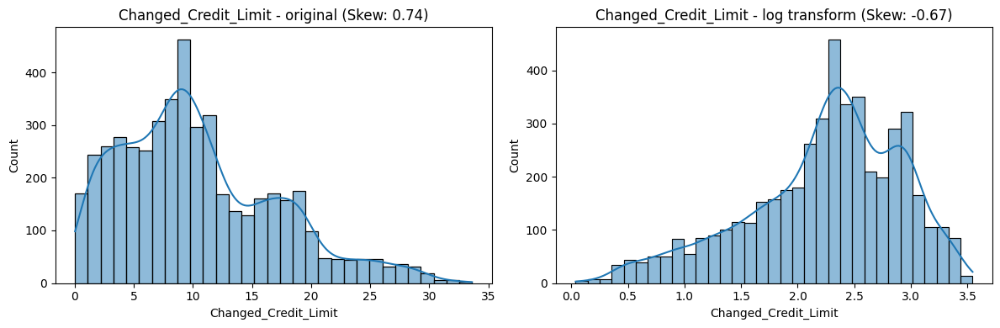

Age skew=0.17


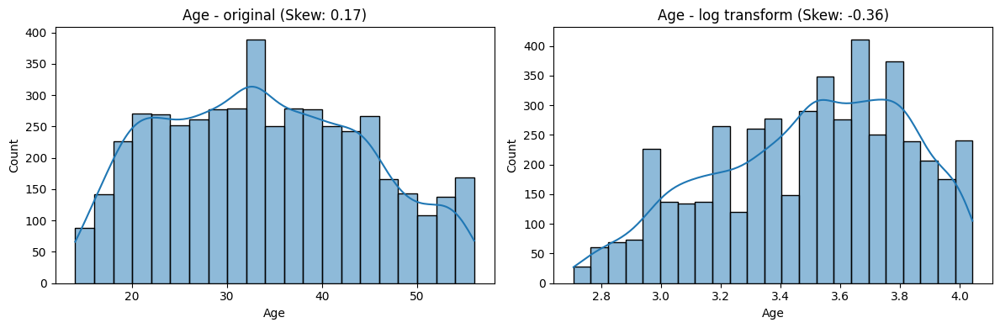

Annual_Income skew=13.63


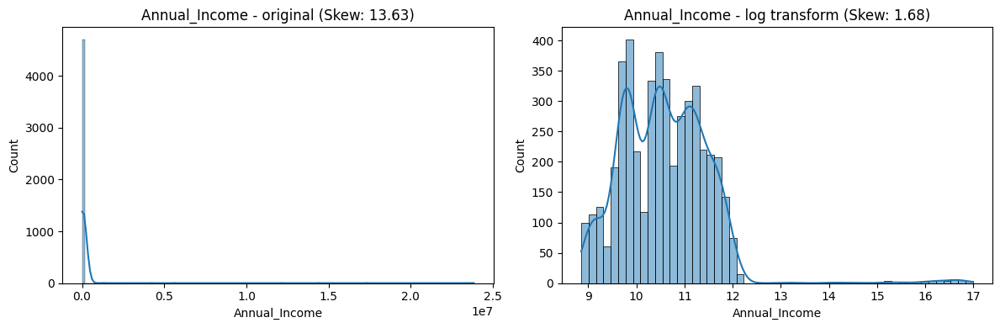

Monthly_Inhand_Salary skew=1.16


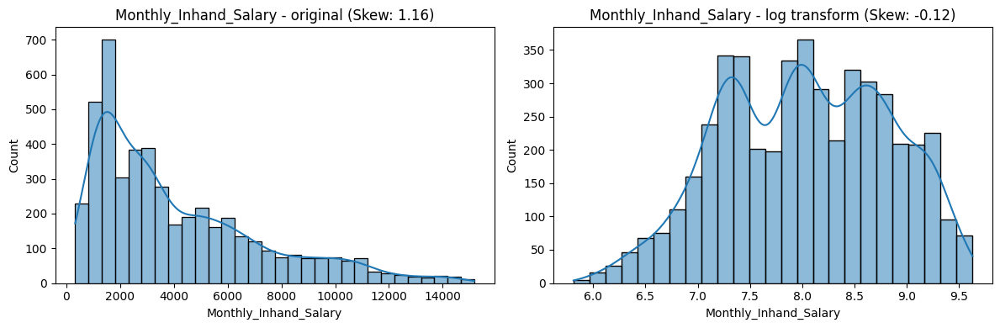

Num_Bank_Accounts skew=-0.16


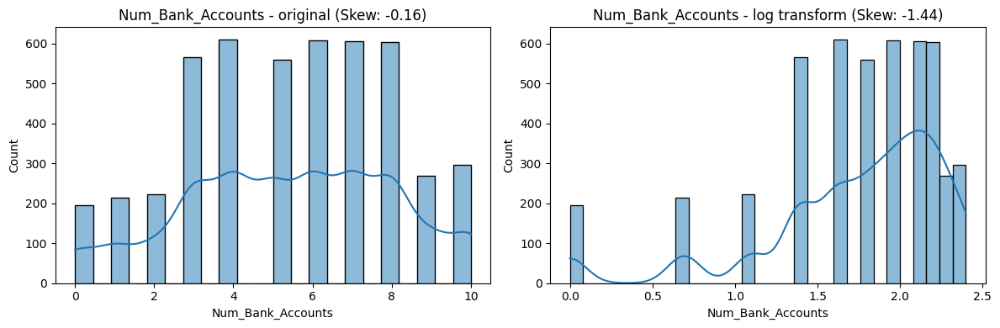

Num_Credit_Card skew=0.25


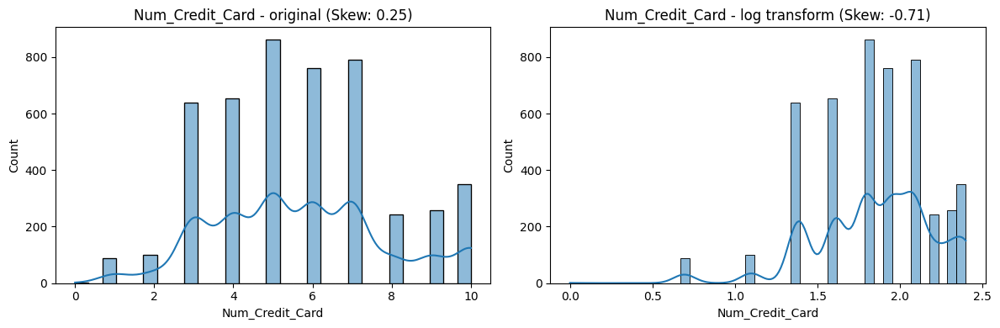

Interest_Rate skew=0.51


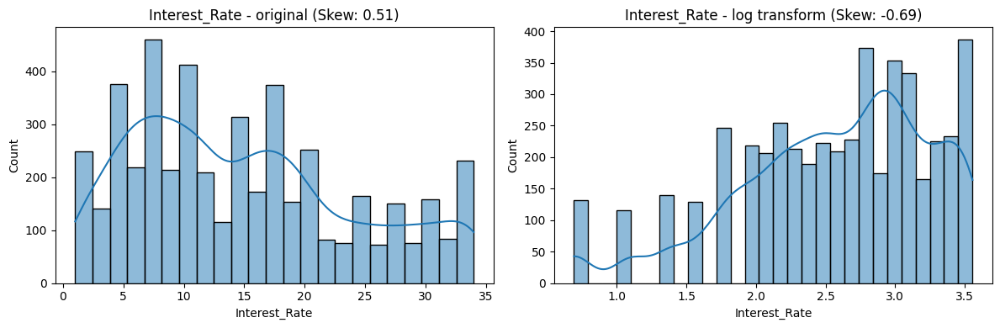

Num_of_Loan skew=0.47


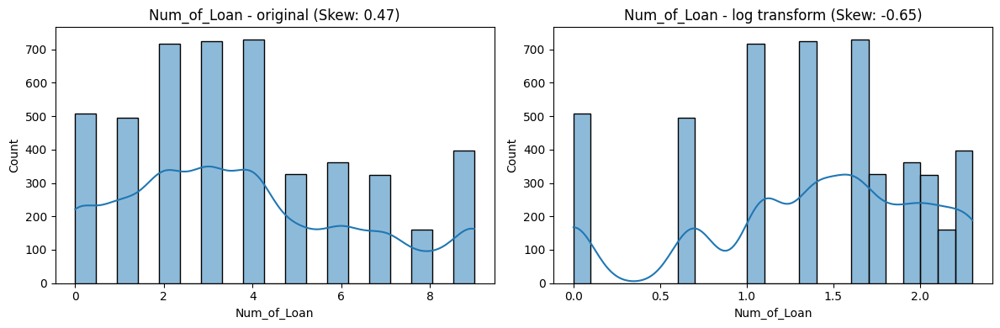

Delay_from_due_date skew=1.01


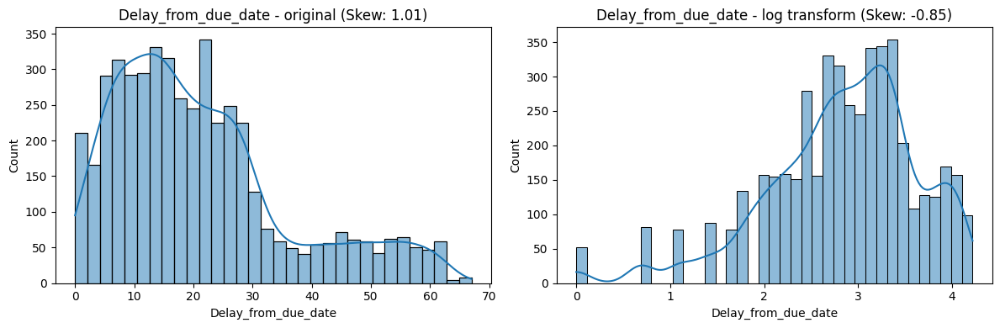

Num_of_Delayed_Payment skew=0.74


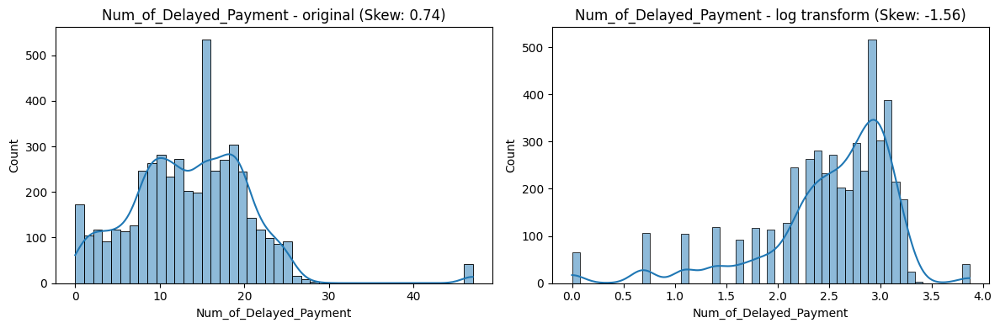

Changed_Credit_Limit skew=0.74


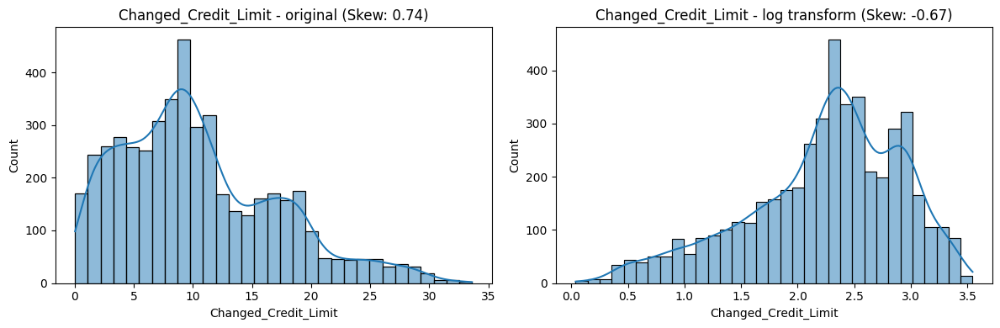

Num_Credit_Inquiries skew=-2.77


Age skew=0.17


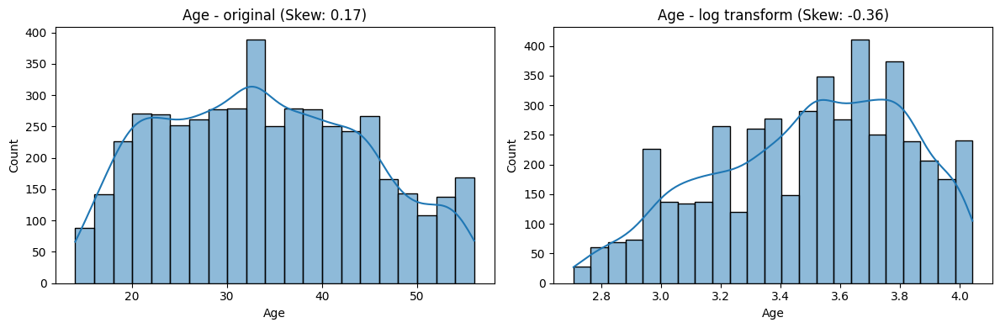

Annual_Income skew=13.63


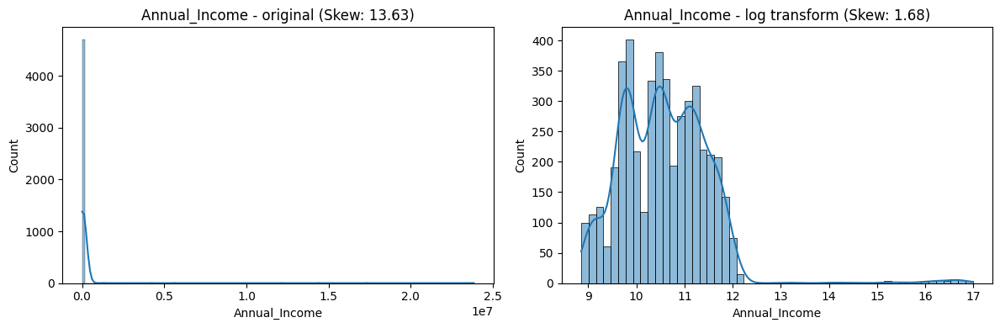

Monthly_Inhand_Salary skew=1.16


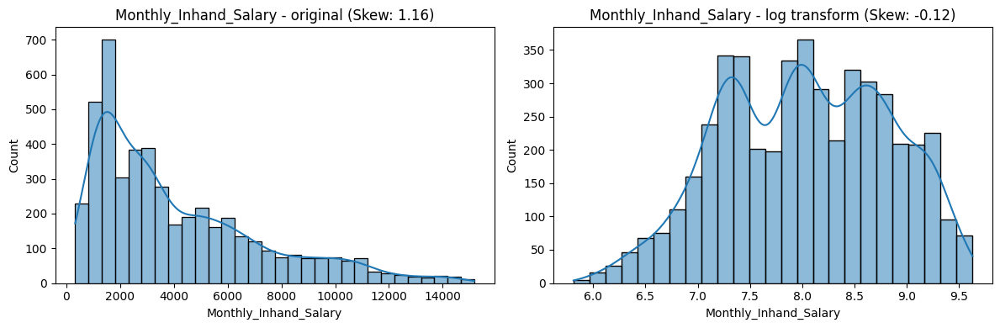

Num_Bank_Accounts skew=-0.16


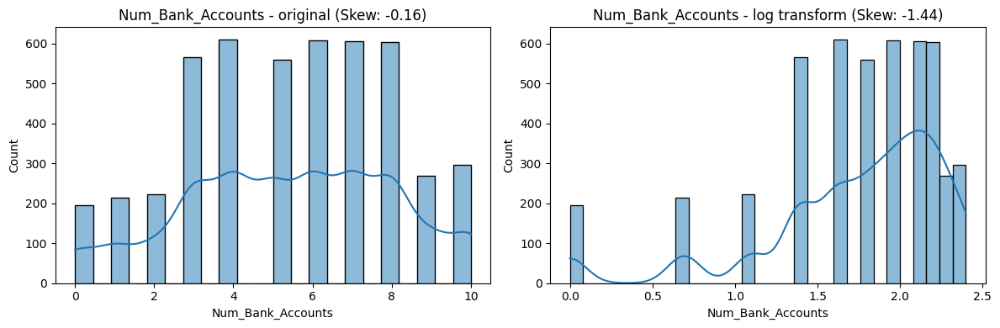

Num_Credit_Card skew=0.25


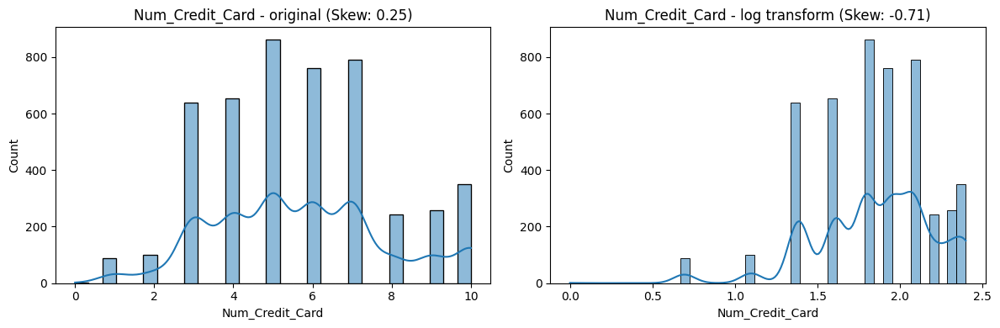

Interest_Rate skew=0.51


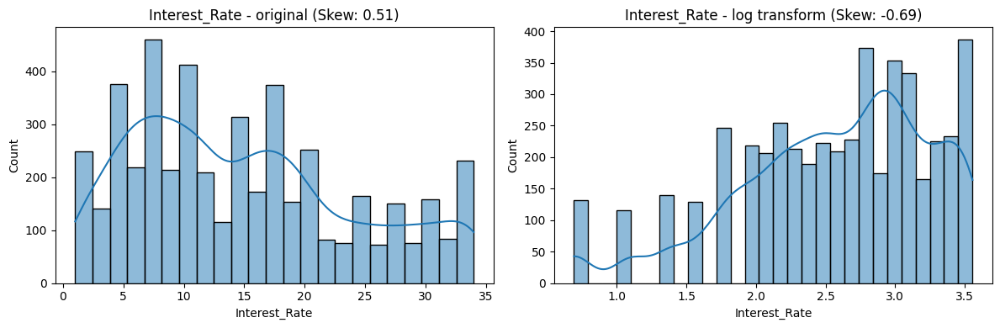

Num_of_Loan skew=0.47


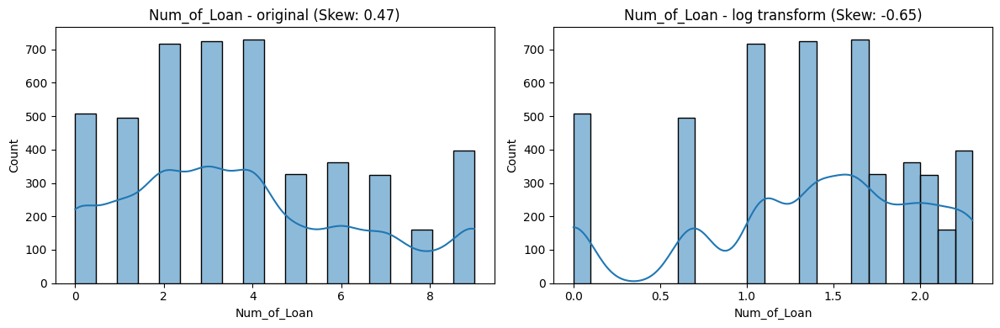

Delay_from_due_date skew=1.01


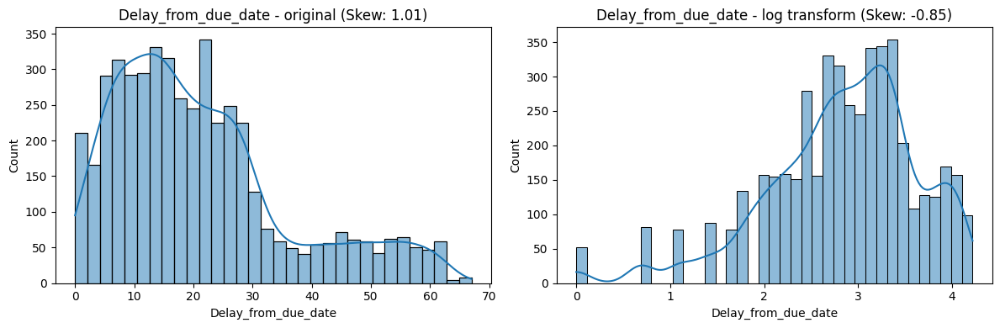

Num_of_Delayed_Payment skew=0.74


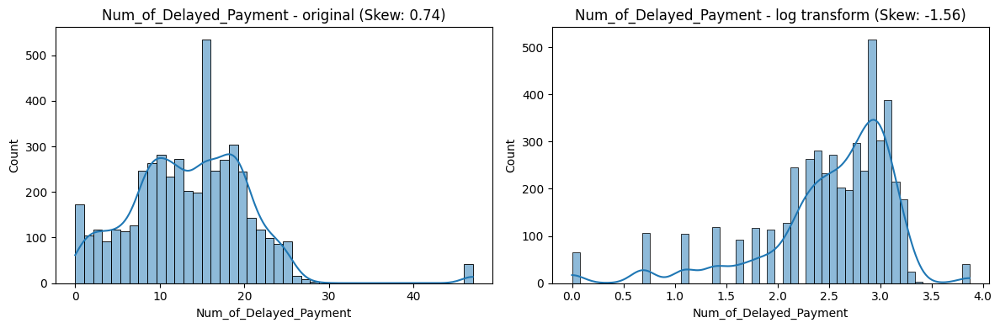

Changed_Credit_Limit skew=0.74


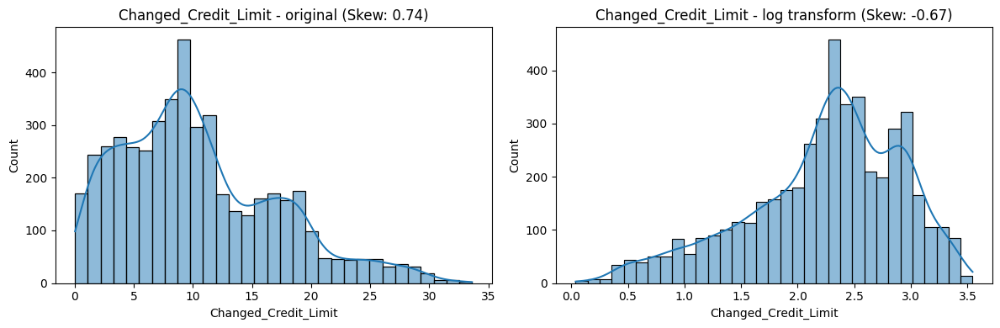

Num_Credit_Inquiries skew=-2.77


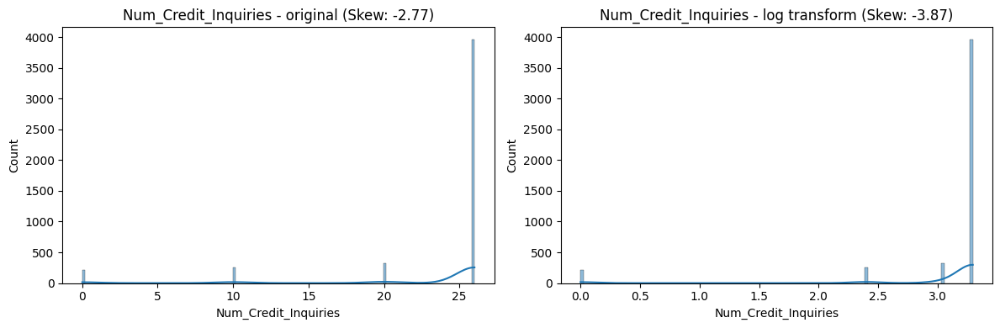

Age skew=0.17


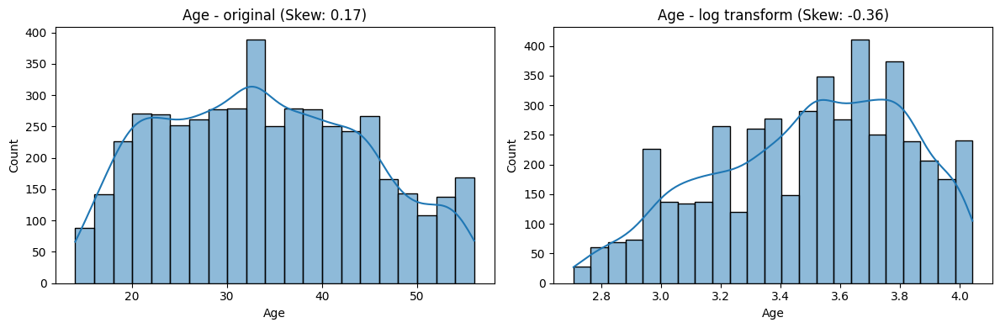

Annual_Income skew=13.63


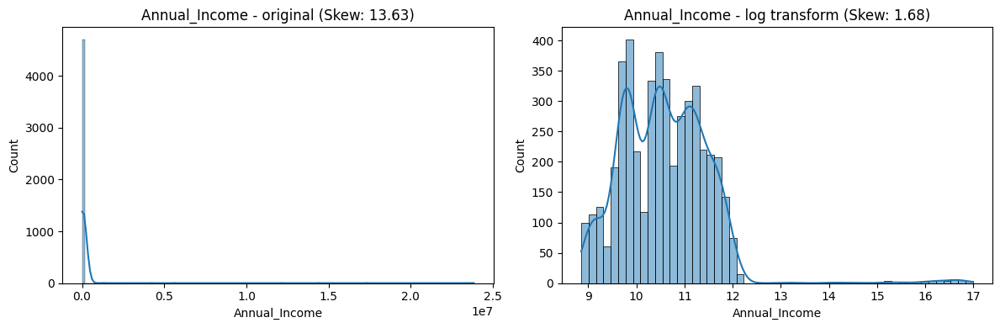

Monthly_Inhand_Salary skew=1.16


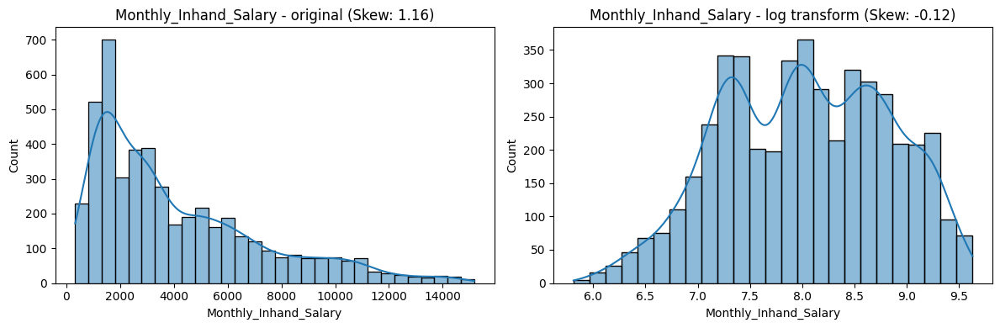

Num_Bank_Accounts skew=-0.16


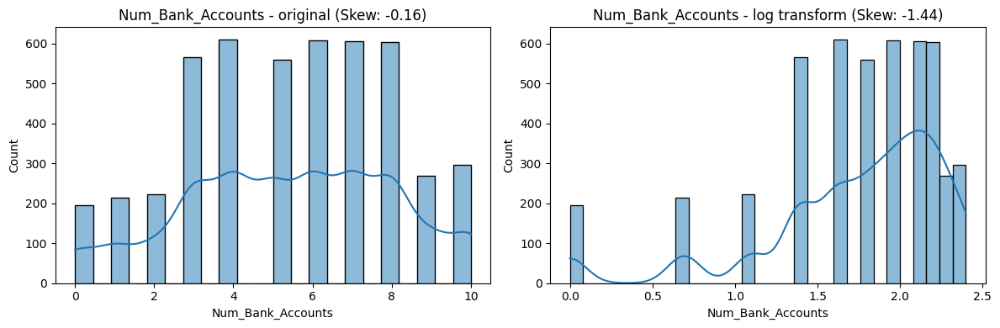

Num_Credit_Card skew=0.25


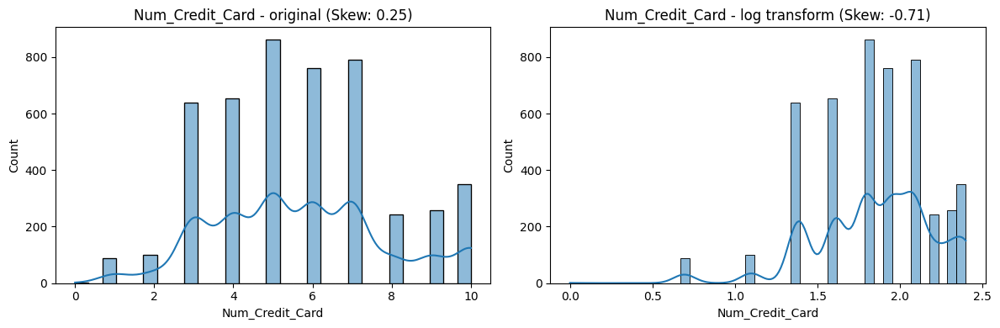

Interest_Rate skew=0.51


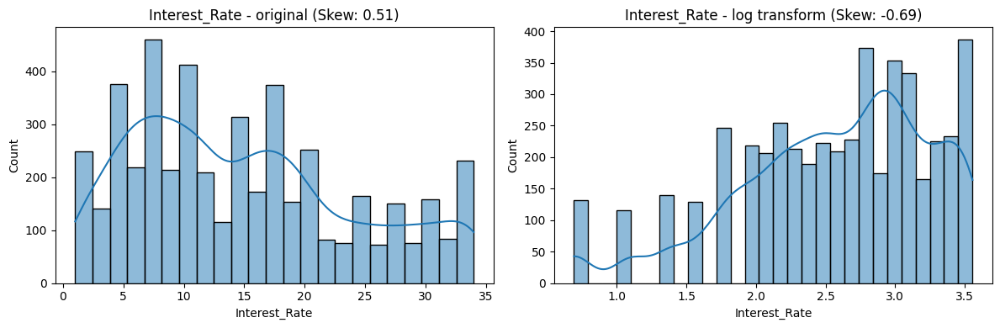

Num_of_Loan skew=0.47


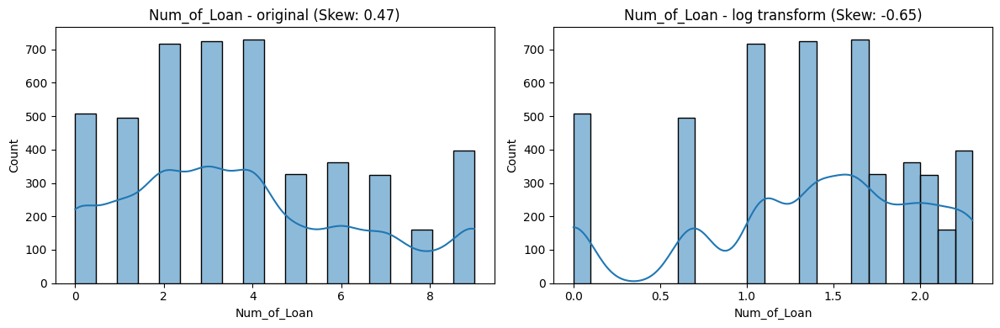

Delay_from_due_date skew=1.01


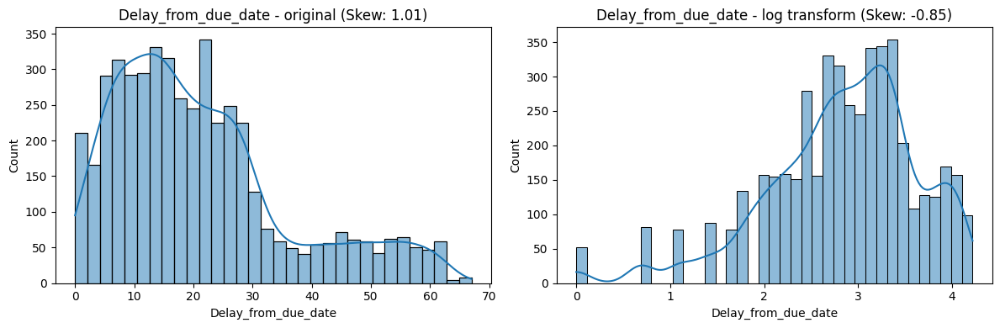

Num_of_Delayed_Payment skew=0.74


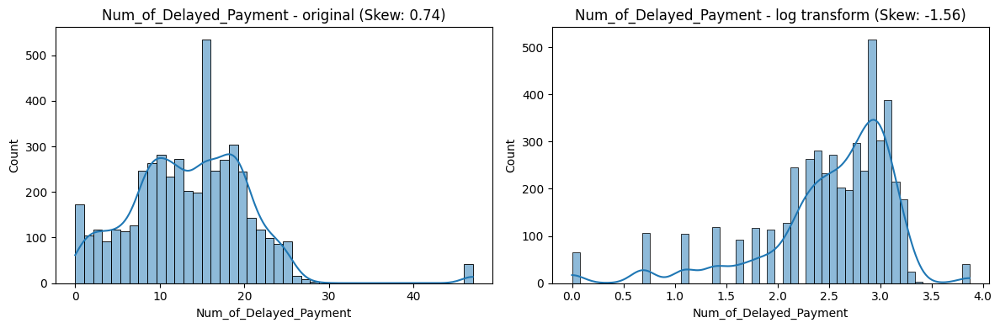

Changed_Credit_Limit skew=0.74


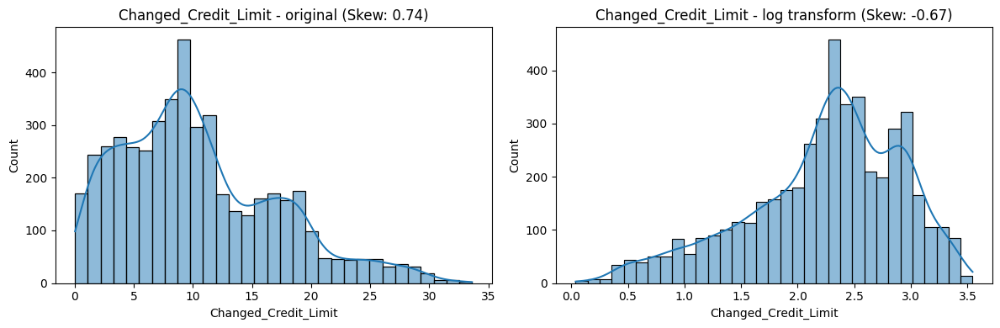

Num_Credit_Inquiries skew=-2.77


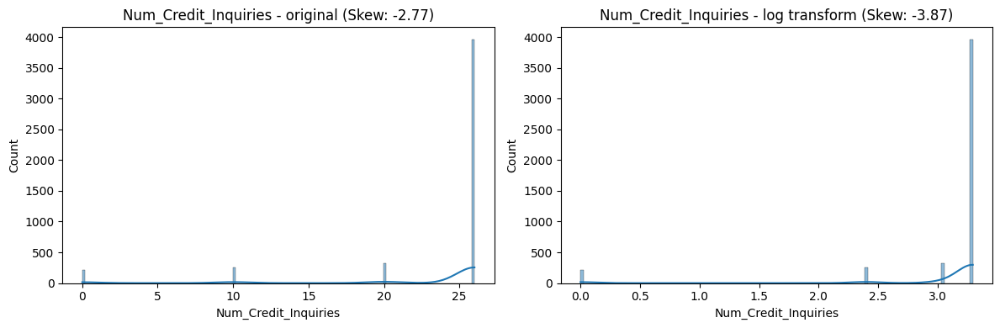

Credit_Mix skew=-0.05


Age skew=0.17


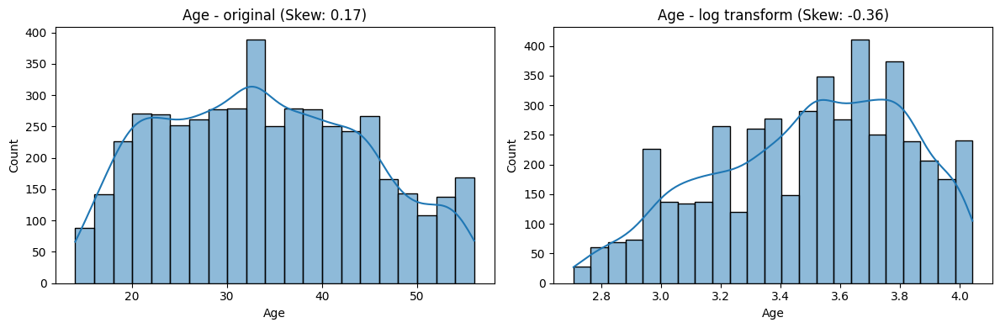

Annual_Income skew=13.63


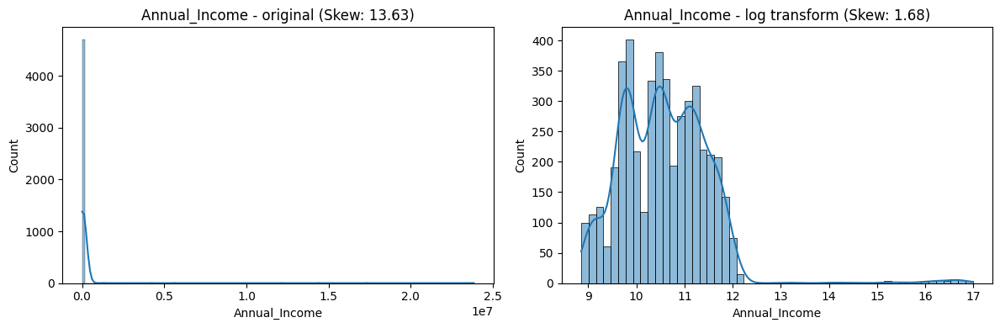

Monthly_Inhand_Salary skew=1.16


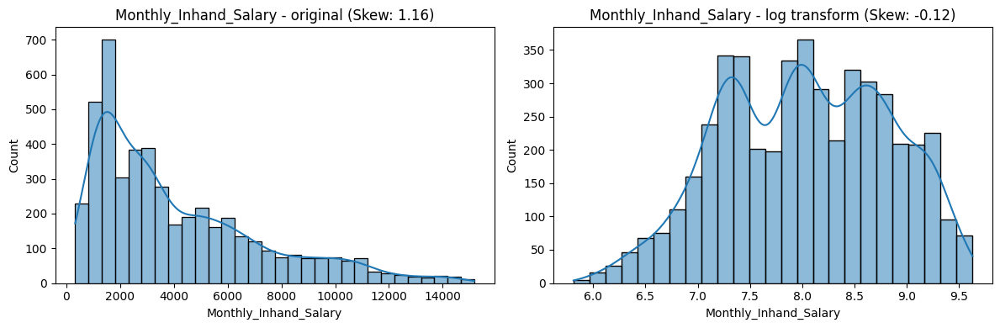

Num_Bank_Accounts skew=-0.16


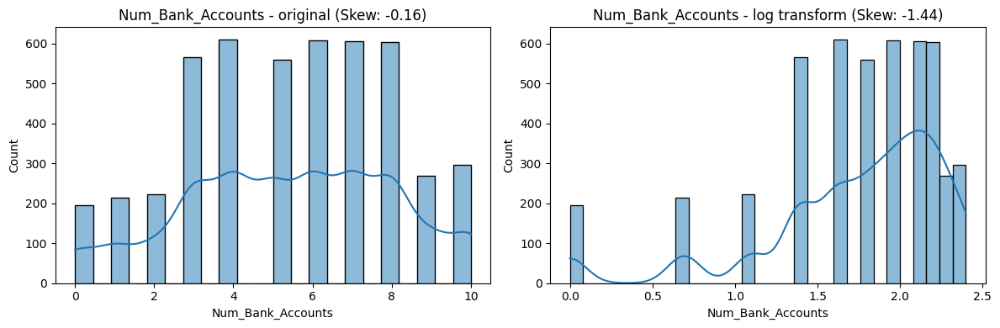

Num_Credit_Card skew=0.25


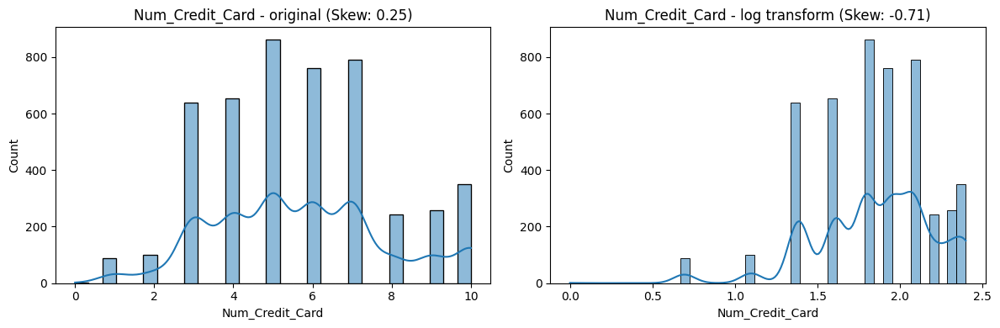

Interest_Rate skew=0.51


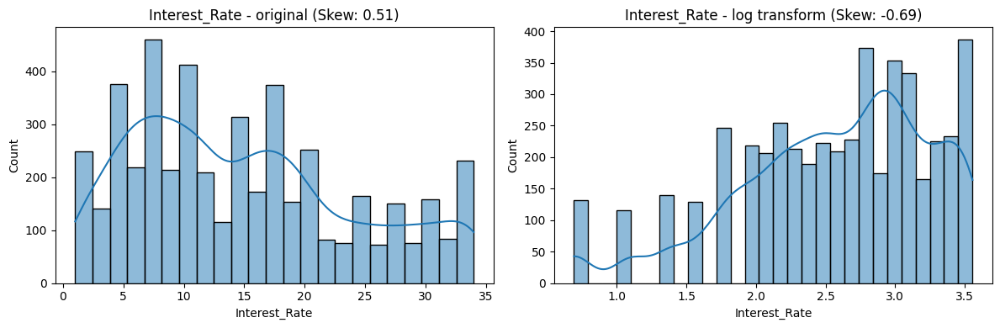

Num_of_Loan skew=0.47


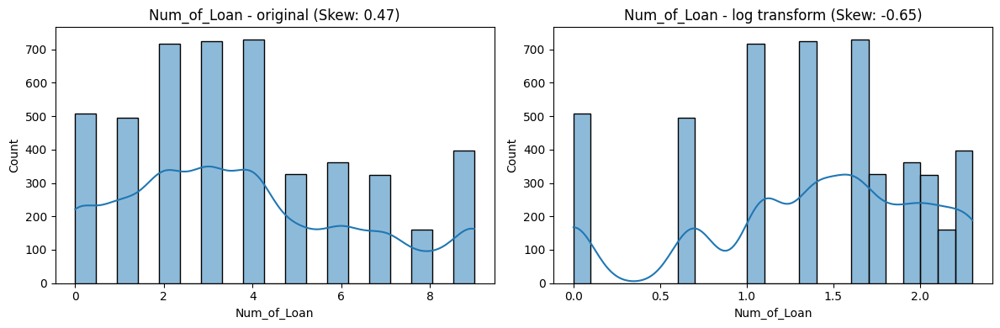

Delay_from_due_date skew=1.01


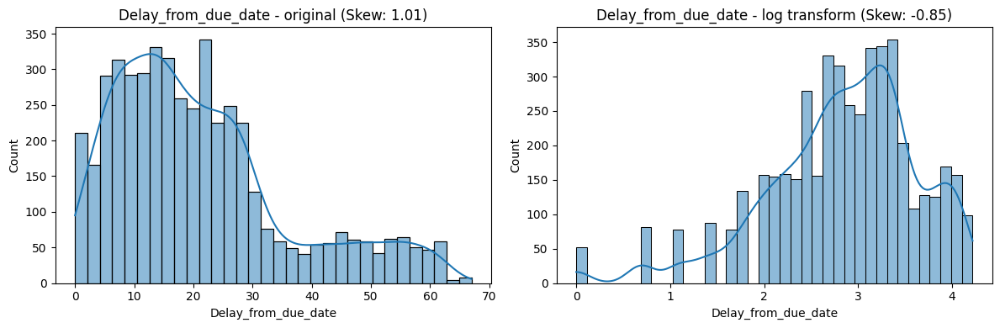

Num_of_Delayed_Payment skew=0.74


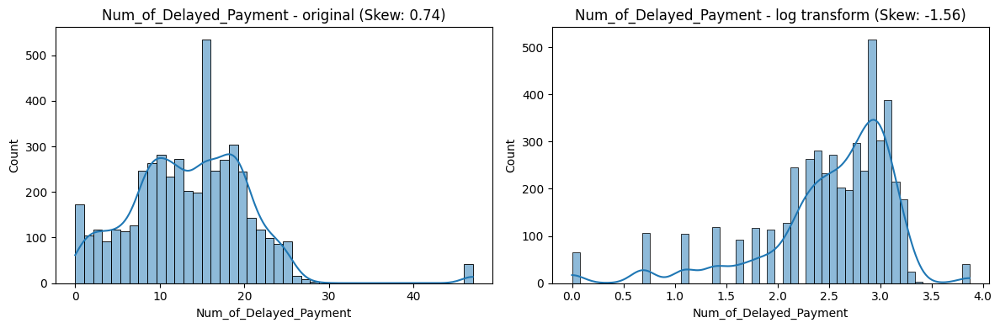

Changed_Credit_Limit skew=0.74


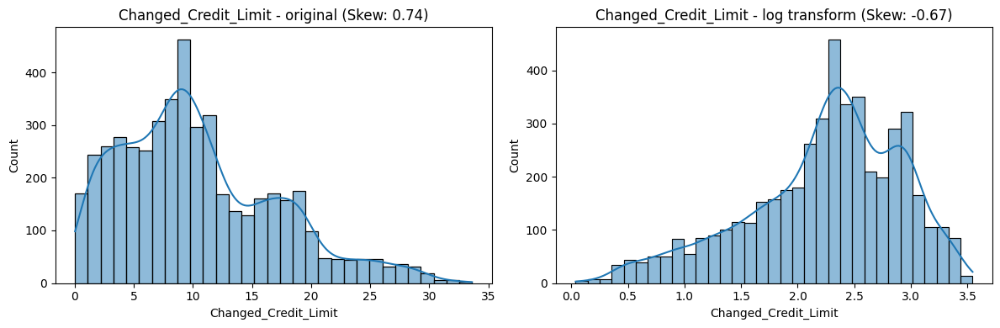

Num_Credit_Inquiries skew=-2.77


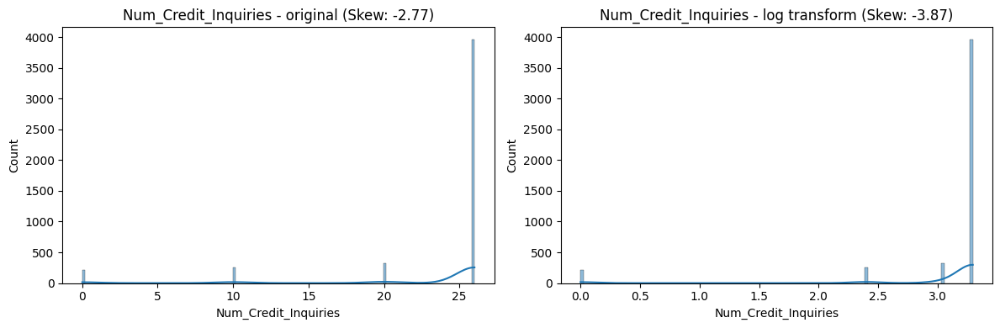

Credit_Mix skew=-0.05


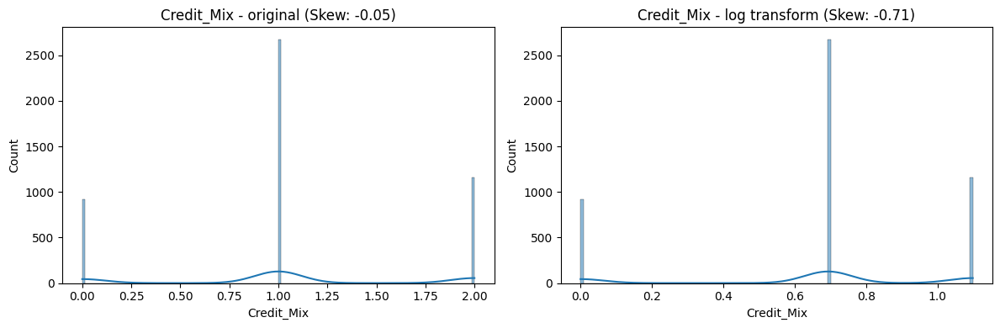

Age skew=0.17


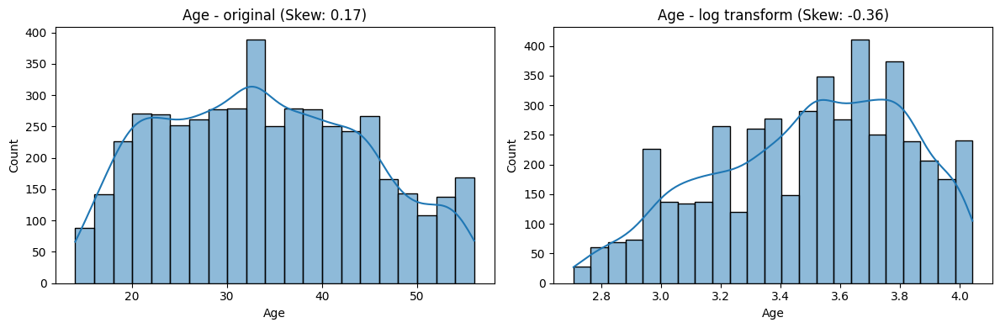

Annual_Income skew=13.63


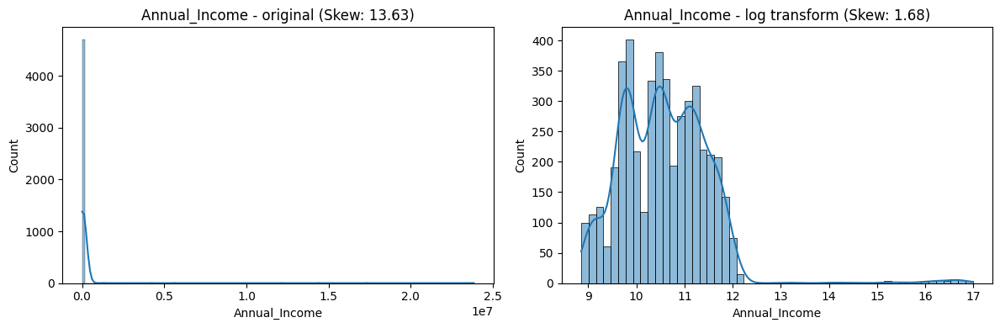

Monthly_Inhand_Salary skew=1.16


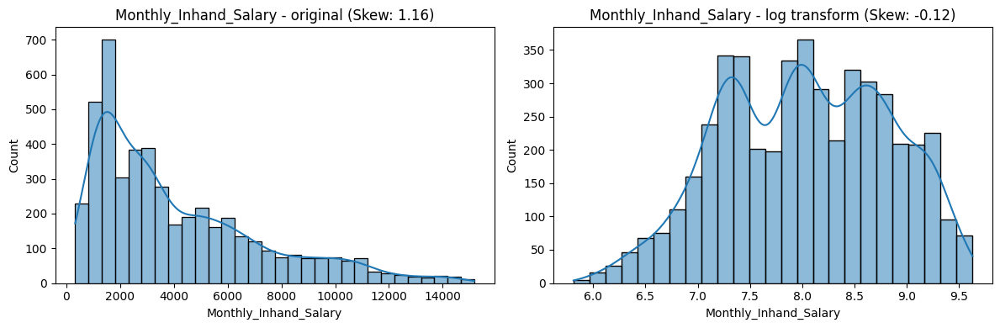

Num_Bank_Accounts skew=-0.16


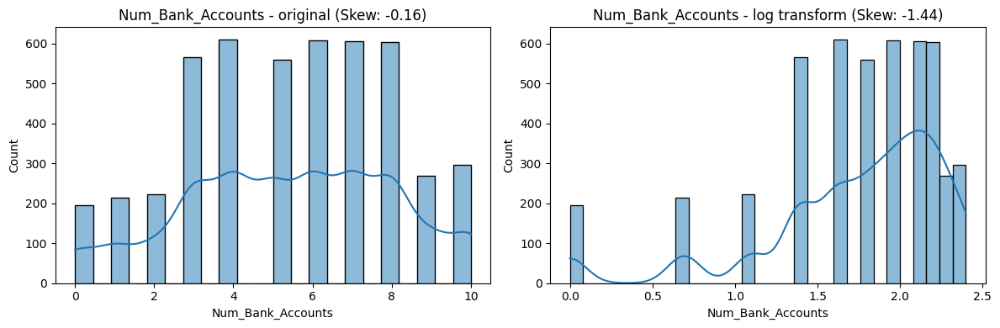

Num_Credit_Card skew=0.25


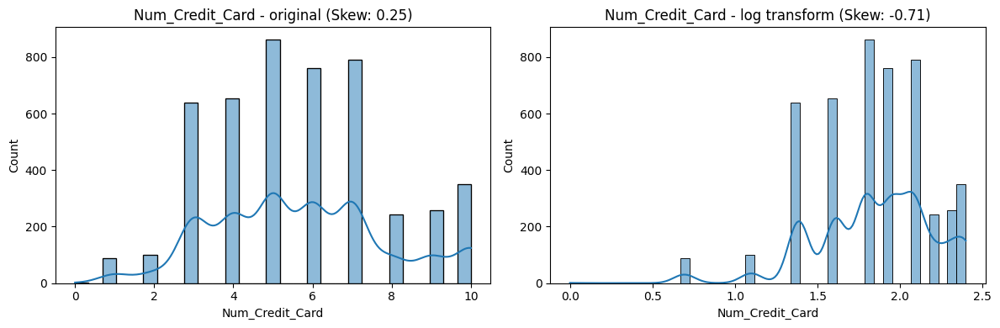

Interest_Rate skew=0.51


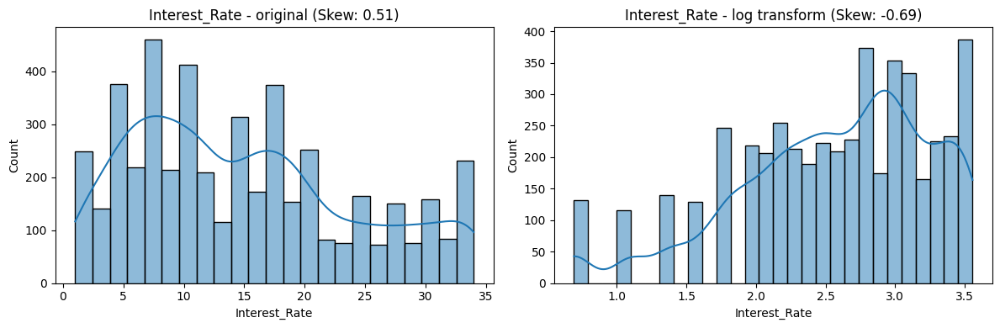

Num_of_Loan skew=0.47


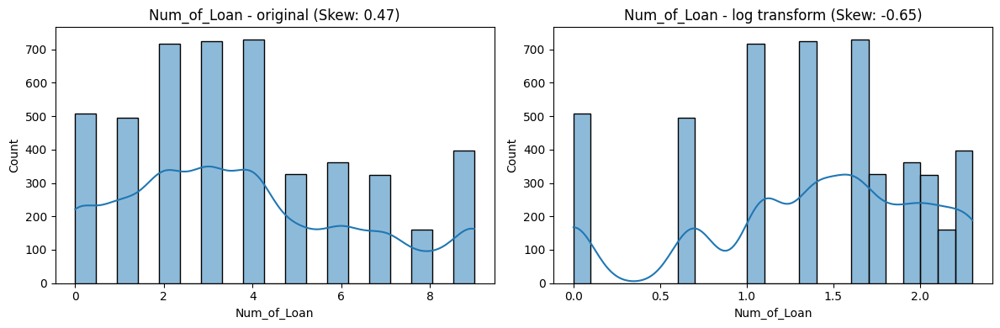

Delay_from_due_date skew=1.01


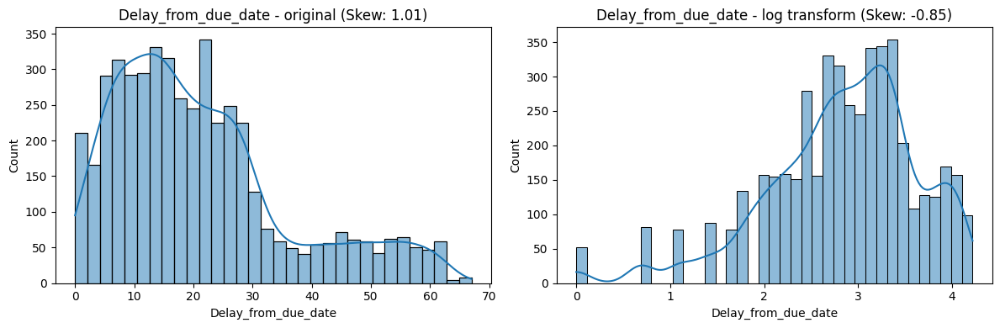

Num_of_Delayed_Payment skew=0.74


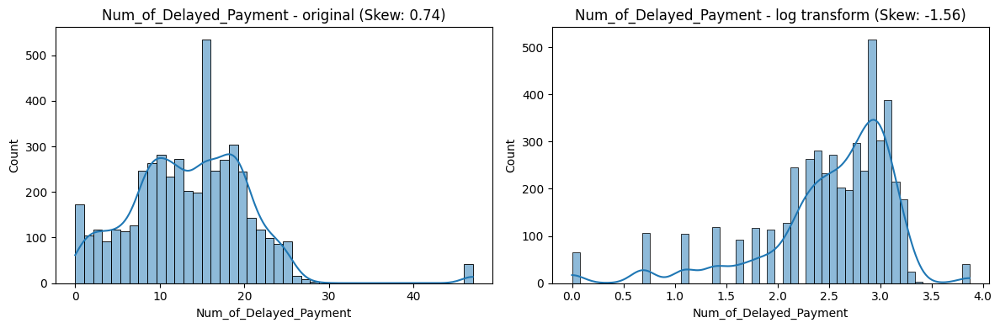

Changed_Credit_Limit skew=0.74


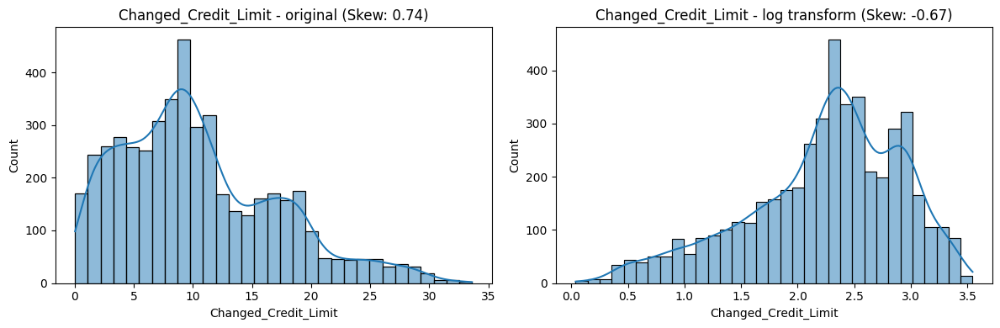

Num_Credit_Inquiries skew=-2.77


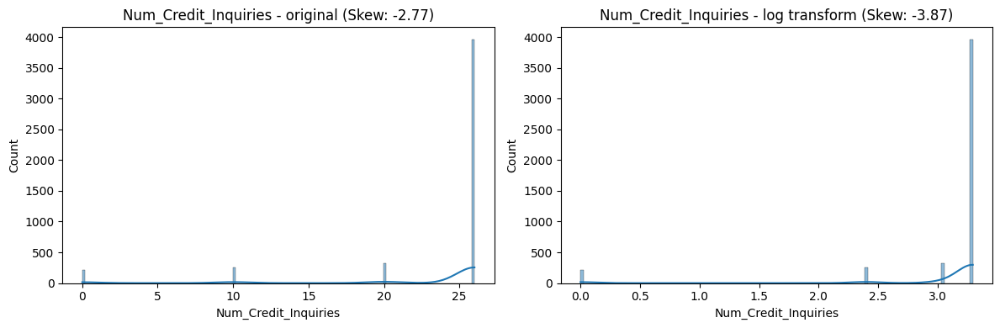

Credit_Mix skew=-0.05


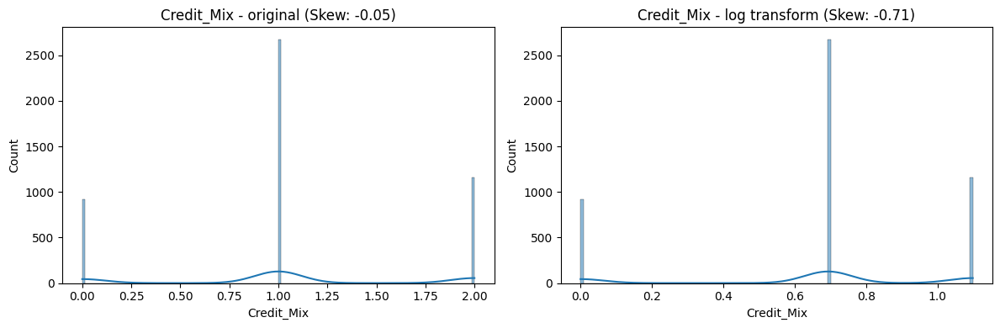

Outstanding_Debt skew=1.20


Age skew=0.17


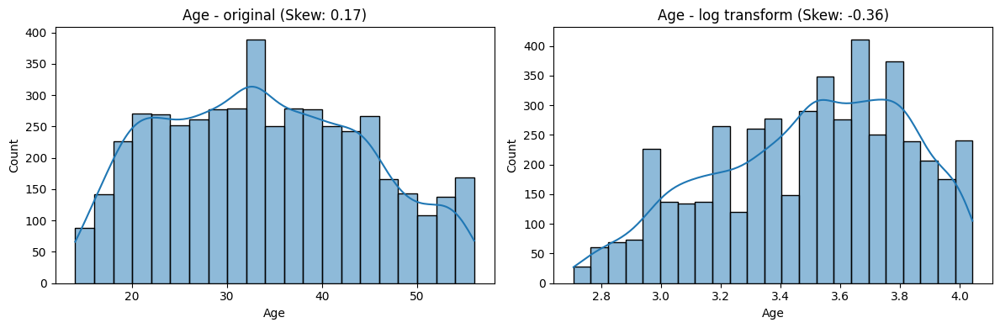

Annual_Income skew=13.63


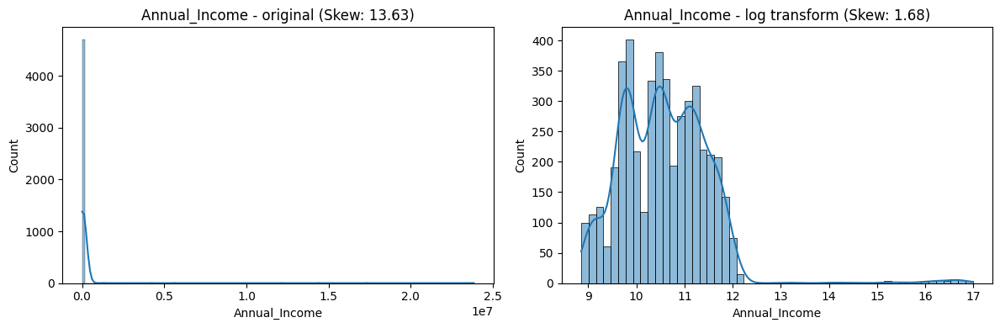

Monthly_Inhand_Salary skew=1.16


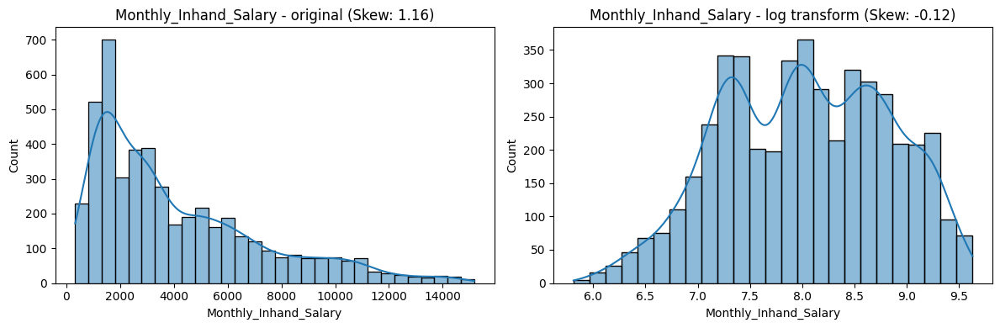

Num_Bank_Accounts skew=-0.16


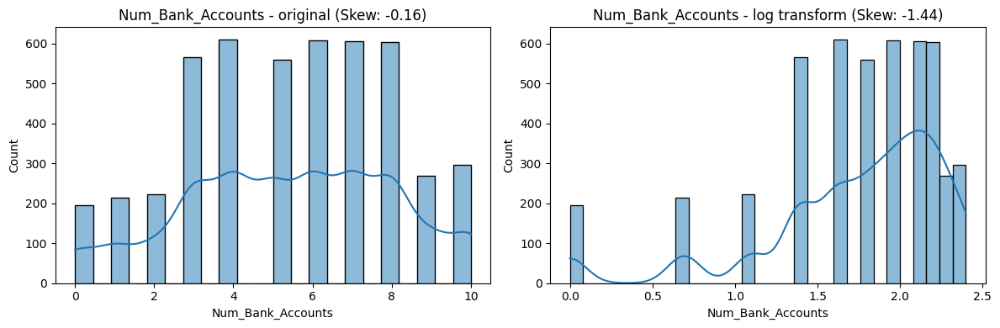

Num_Credit_Card skew=0.25


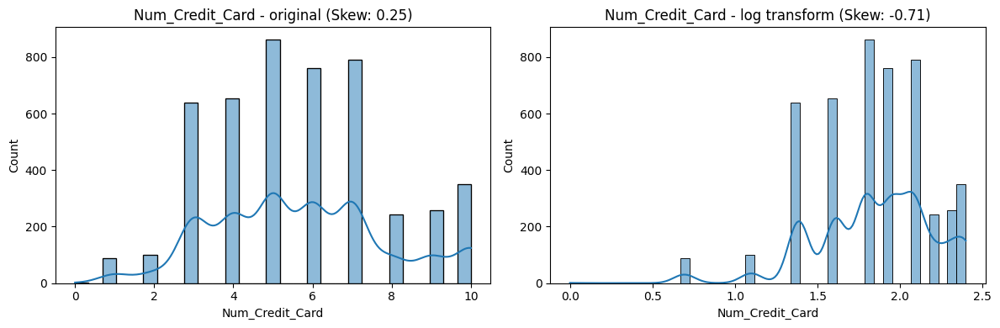

Interest_Rate skew=0.51


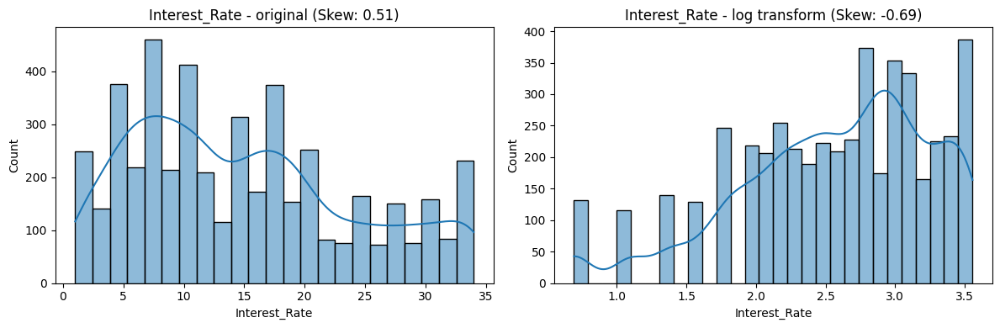

Num_of_Loan skew=0.47


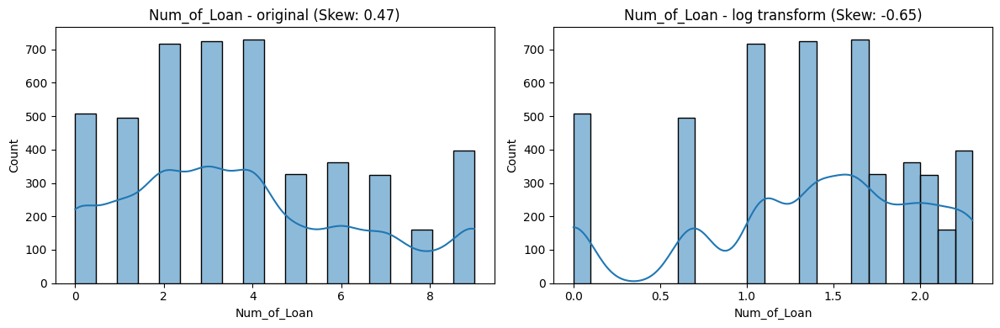

Delay_from_due_date skew=1.01


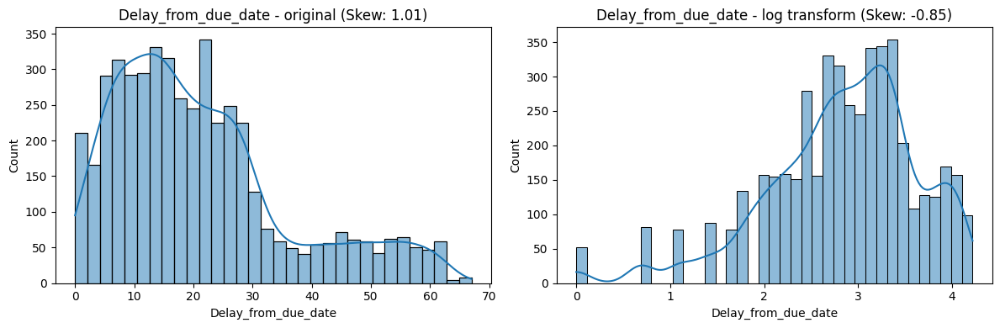

Num_of_Delayed_Payment skew=0.74


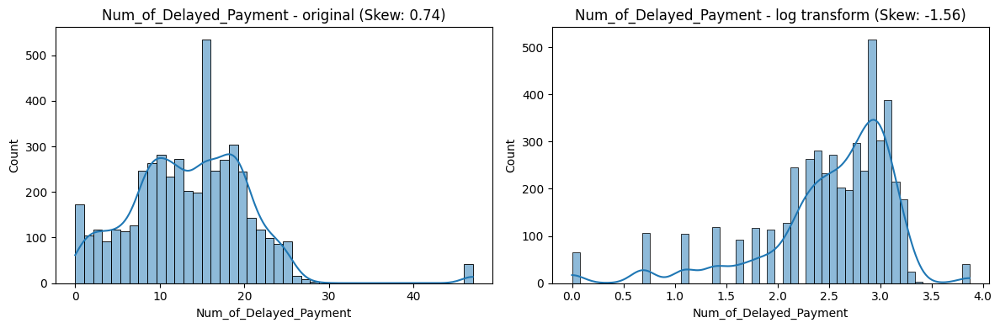

Changed_Credit_Limit skew=0.74


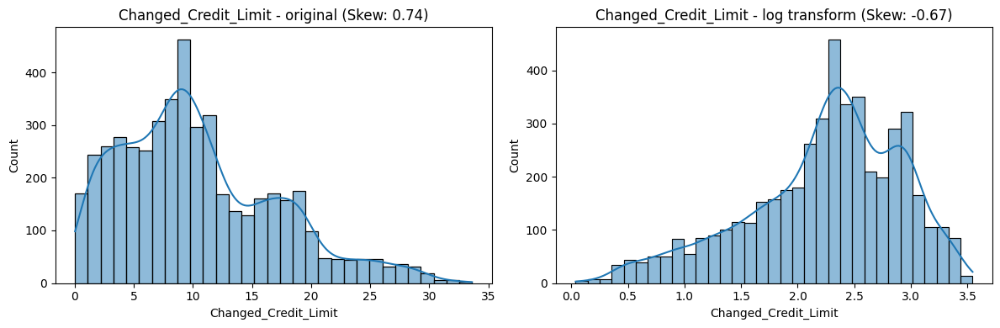

Num_Credit_Inquiries skew=-2.77


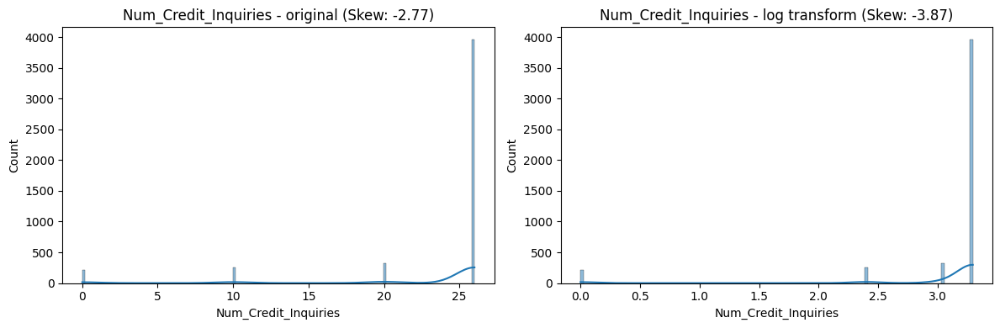

Credit_Mix skew=-0.05


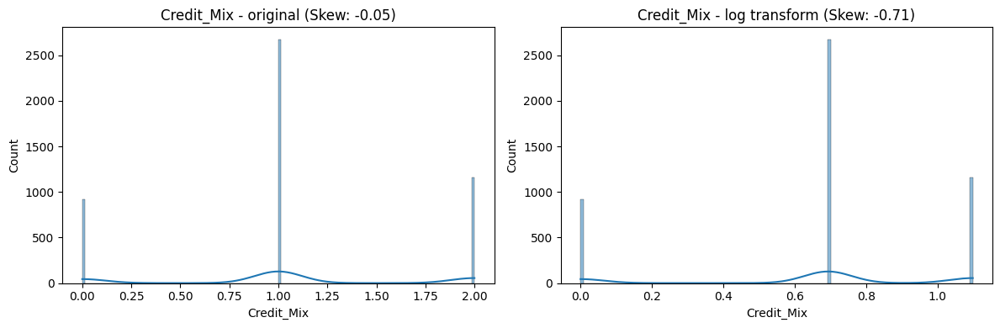

Outstanding_Debt skew=1.20


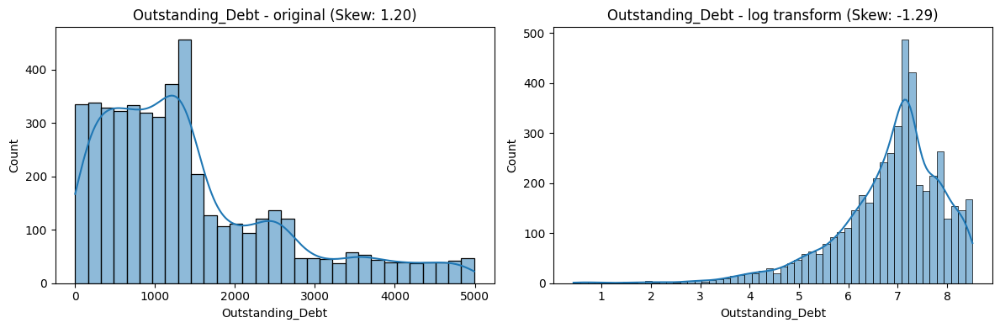

Age skew=0.17


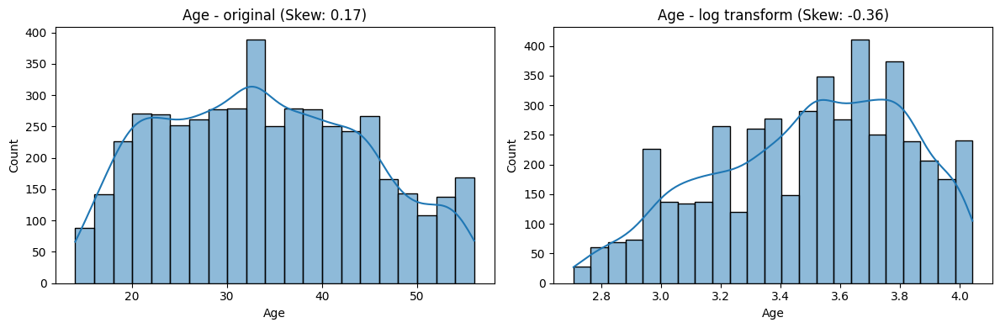

Annual_Income skew=13.63


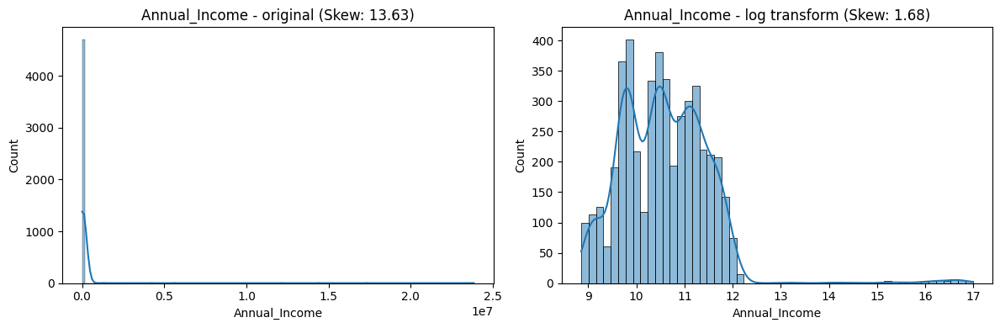

Monthly_Inhand_Salary skew=1.16


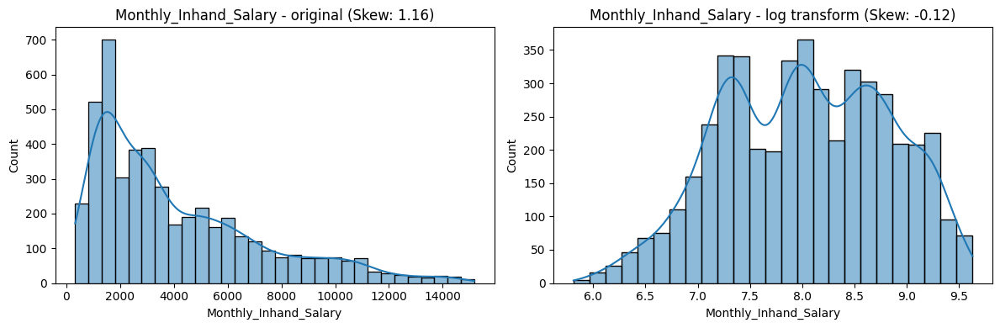

Num_Bank_Accounts skew=-0.16


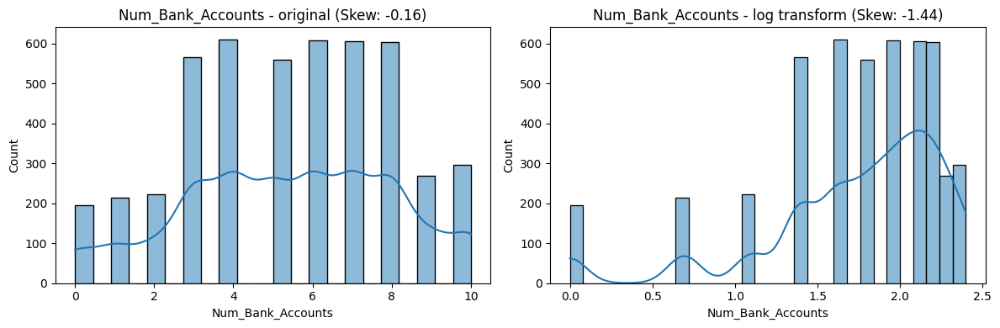

Num_Credit_Card skew=0.25


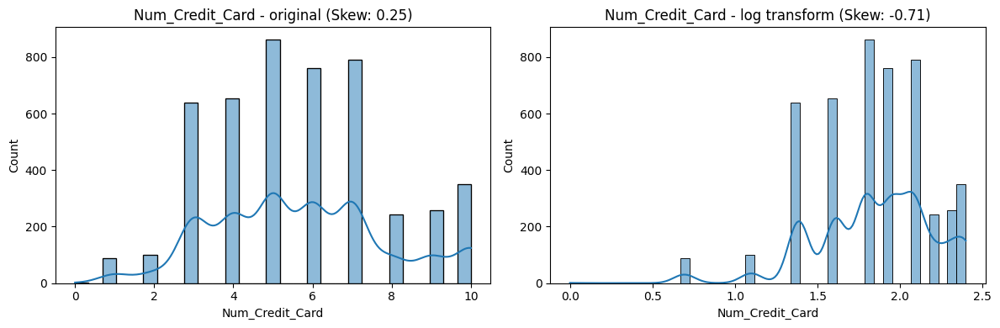

Interest_Rate skew=0.51


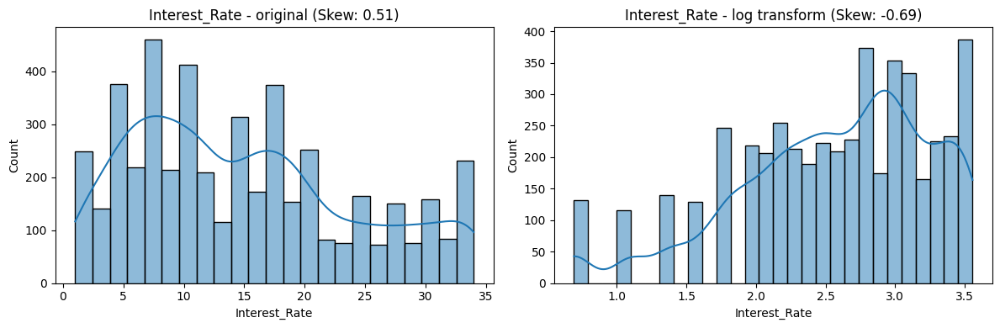

Num_of_Loan skew=0.47


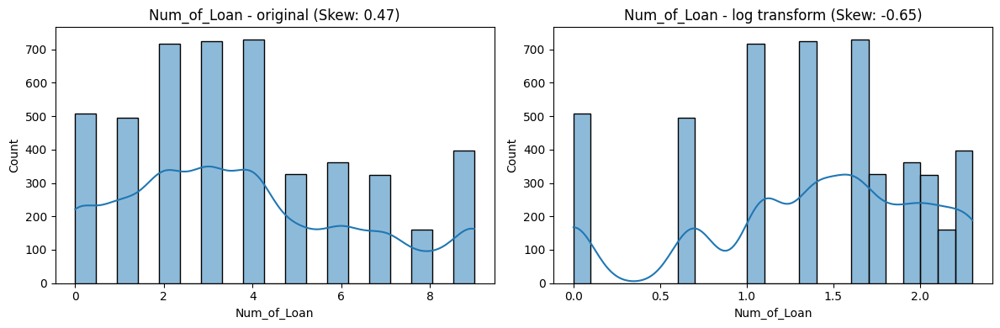

Delay_from_due_date skew=1.01


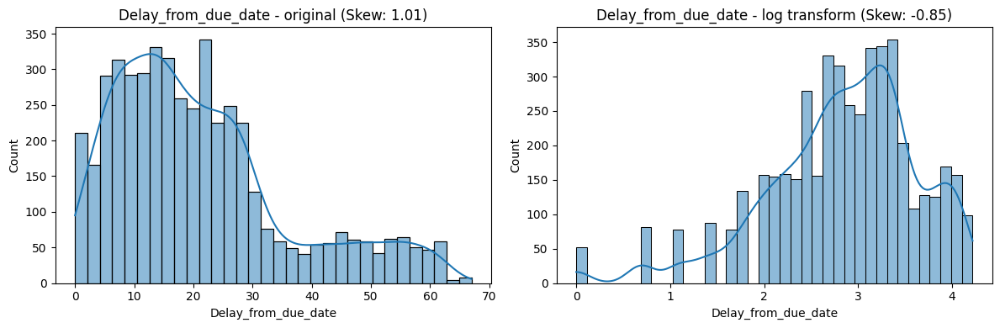

Num_of_Delayed_Payment skew=0.74


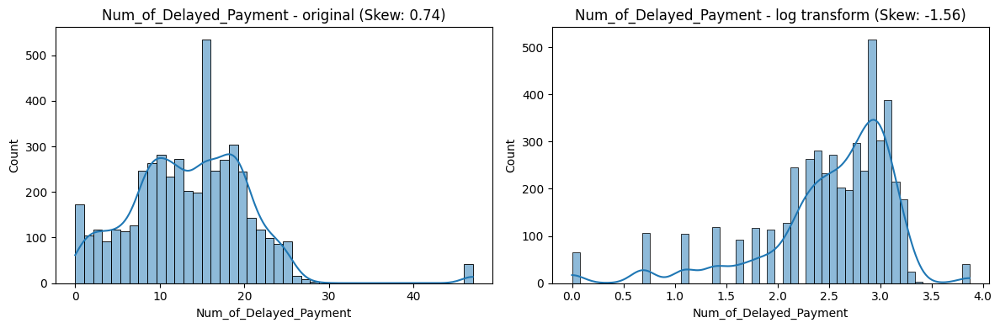

Changed_Credit_Limit skew=0.74


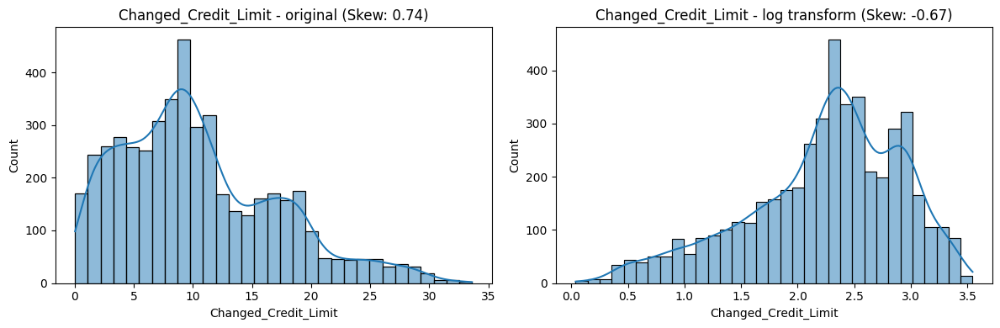

Num_Credit_Inquiries skew=-2.77


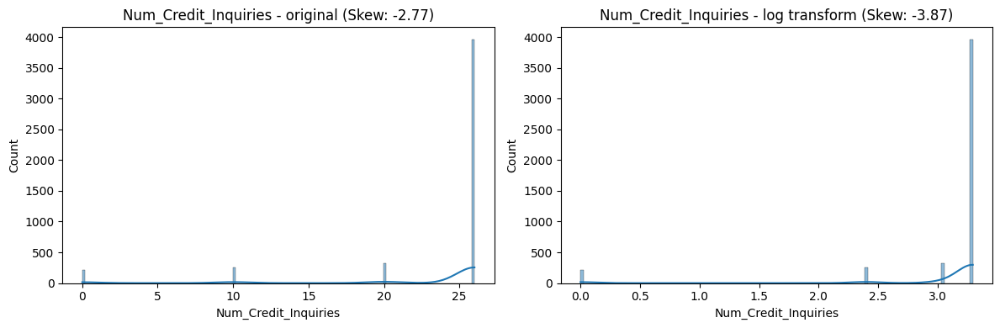

Credit_Mix skew=-0.05


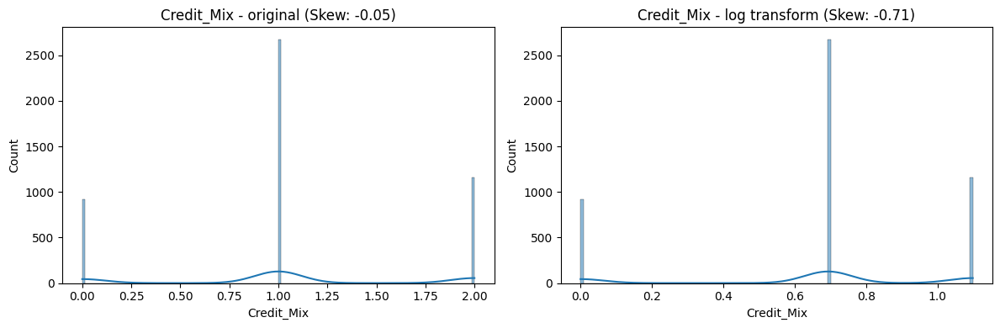

Outstanding_Debt skew=1.20


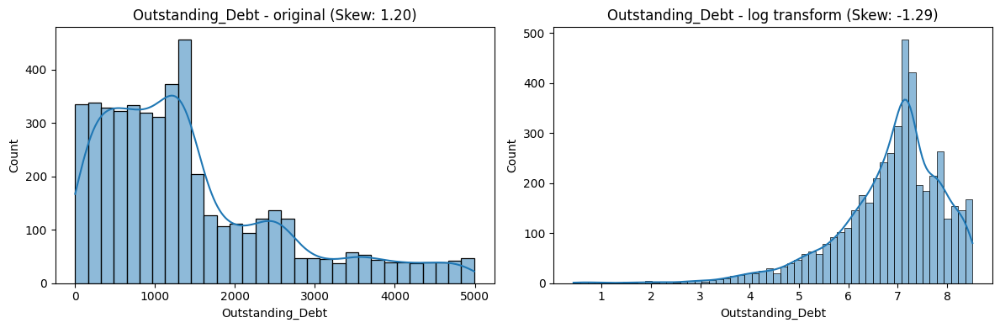

Credit_Utilization_Ratio skew=0.03


In [ ]:
#Identify continuous variables that are skewed
def analyze_skew_and_log_transform(df, columns, skew_threshold=0.5):
    for col in columns:
        series = pd.to_numeric(df[col], errors='coerce')
        series = series.apply(lambda x: max(x, 0))
        series = series.fillna(series.median())

        skewness = series.skew()

        print(f"{col} skew={skewness:.2f}")
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        sns.histplot(series, kde=True, ax=axes[0])
        axes[0].set_title(f"{col} - original (Skew: {skewness:.2f})")

        log_series = np.log1p(series)
        sns.histplot(log_series, kde=True, ax=axes[1])
        axes[1].set_title(f"{col} - log transform (Skew: {log_series.skew():.2f})")

        plt.tight_layout()
        plt.show()
            
target_columns = [
    'Age', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Monthly_Balance',
       'Num_Fin_Pdts', 'Loans_per_Credit_Item', 'Debt_to_Salary',
       'EMI_to_Salary', 'Repayment_Ability', 'Loan_Extent'
]

analyze_skew_and_log_transform(train_df, target_columns)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from dataclasses import dataclass, field

# ---------- 小工具：安全 ordinal encoder ----------
class SafeOrdinalEncoder:
    def __init__(self, unknown_token="__UNK__", unknown_value=-1):
        self.unknown_token = unknown_token
        self.unknown_value = unknown_value
        self.mapping_ = None  # dict: value -> int

    def fit(self, series: pd.Series):
        cats = pd.Series(series).astype(str).fillna(self.unknown_token).unique().tolist()
        if self.unknown_token not in cats:
            cats.append(self.unknown_token)
        # 依字典序或你想要的順序排
        cats = sorted(cats)
        self.mapping_ = {v: i for i, v in enumerate(cats)}
        # 把 unknown_token 強制賦值 unknown_value（固定 -1）
        self.mapping_[self.unknown_token] = self.unknown_value
        return self

    def transform(self, series: pd.Series) -> pd.Series:
        if self.mapping_ is None:
            raise RuntimeError("SafeOrdinalEncoder is not fitted.")
        s = series.astype(str).fillna(self.unknown_token)
        return s.map(lambda x: self.mapping_.get(x, self.unknown_value)).astype("int32")

    def fit_transform(self, series: pd.Series) -> pd.Series:
        return self.fit(series).transform(series)

    @property
    def classes_(self):
        if self.mapping_ is None:
            return None
        # 顯示去掉 unknown 的原類別
        return [k for k, v in self.mapping_.items() if v != -1]


# ---------- 主處理器 ----------
@dataclass
class DataProcessor:
    feature_order: list
    skewed_cols: list = field(default_factory=lambda: [
        'Annual_Income', 'Monthly_Inhand_Salary', 'Delay_from_due_date',
        'Outstanding_Debt', 'Total_EMI_per_month', 'Amount_invested_monthly',
        'Monthly_Balance', 'Loans_per_Credit_Item', 'Debt_to_Salary',
        'EMI_to_Salary', 'Repayment_Ability', 'Loan_Extent', 'Debt_to_Income'
    ])

    # artifacts
    num_impute_values: dict = field(default_factory=dict)
    scaler: StandardScaler = None
    occ_encoder: SafeOrdinalEncoder = None
    # Payment_Behaviour 有明確類別集合（0-5）；其餘 → -1
    pb_mapping: dict = field(default_factory=lambda: {str(i): i for i in range(6)})
    pb_unknown_value: int = -1

    def _add_debt_to_income(self, df: pd.DataFrame):
        inc = pd.to_numeric(df['Annual_Income'], errors='coerce')
        debt = pd.to_numeric(df['Outstanding_Debt'], errors='coerce')
        dti = np.divide(debt, inc, out=np.full_like(debt, np.nan, dtype=float), where=(inc > 0))
        df['Debt_to_Income'] = dti

    def _fill_missing_train(self, df: pd.DataFrame, cat_cols: list, num_cols: list):
        # 類別：Unknown；數值：train 中位數
        for c in cat_cols:
            df[c] = df[c].astype("object").fillna("__UNK__")
        for c in num_cols:
            med = pd.to_numeric(df[c], errors='coerce').median()
            self.num_impute_values[c] = med
            df[c] = pd.to_numeric(df[c], errors='coerce').fillna(med)

    def _fill_missing_infer(self, df: pd.DataFrame, cat_cols: list, num_cols: list):
        for c in cat_cols:
            df[c] = df[c].astype("object").fillna("__UNK__")
        for c in num_cols:
            med = self.num_impute_values[c]
            df[c] = pd.to_numeric(df[c], errors='coerce').fillna(med)

    def _encode_payment_behaviour(self, s: pd.Series) -> pd.Series:
        # 先轉字串，未知→ -1
        return s.astype(str).map(lambda x: self.pb_mapping.get(x, self.pb_unknown_value)).astype("int32")

    def fit(self, X_train: pd.DataFrame):
        X_train = X_train.copy()

        # 1) 衍生特徵
        if 'Debt_to_Income' not in self.feature_order:
            self.feature_order = self.feature_order + ['Debt_to_Income']
        self._add_debt_to_income(X_train)

        # 2) 欄位分群
        cat_cols = [c for c in ['Occupation', 'Payment_Behaviour'] if c in self.feature_order]
        num_cols = [c for c in self.feature_order if c not in cat_cols]

        # 3) 缺值（train）
        self._fill_missing_train(X_train, cat_cols, num_cols)

        # 4) 類別編碼（train）
        # Payment_Behaviour：固定映射（0..5），未知→-1
        if 'Payment_Behaviour' in cat_cols:
            X_train['Payment_Behaviour'] = self._encode_payment_behaviour(X_train['Payment_Behaviour'])

        # Occupation：用 SafeOrdinalEncoder（未知→-1）
        if 'Occupation' in cat_cols:
            self.occ_encoder = SafeOrdinalEncoder(unknown_token="__UNK__", unknown_value=-1).fit(X_train['Occupation'])
            X_train['Occupation'] = self.occ_encoder.transform(X_train['Occupation'])

        # 5) 偏態 log1p（只對數值）
        for c in self.skewed_cols:
            if c in num_cols:
                X_train[c] = np.log1p(np.clip(pd.to_numeric(X_train[c], errors='coerce'), 0, None))

        # 6) 標準化（只用 train fit）
        self.scaler = StandardScaler().fit(X_train[self.feature_order])

        return self

    def transform(self, X: pd.DataFrame) -> pd.DataFrame:
        X = X.copy()

        # 衍生特徵
        if 'Debt_to_Income' not in X.columns:
            self._add_debt_to_income(X)

        # 欄位分群
        cat_cols = [c for c in ['Occupation', 'Payment_Behaviour'] if c in self.feature_order]
        num_cols = [c for c in self.feature_order if c not in cat_cols]

        # 缺值（infer）
        self._fill_missing_infer(X, cat_cols, num_cols)

        # 類別編碼（infer）
        if 'Payment_Behaviour' in cat_cols:
            X['Payment_Behaviour'] = self._encode_payment_behaviour(X['Payment_Behaviour'])

        if 'Occupation' in cat_cols:
            # 未見值都會被 SafeOrdinalEncoder → -1
            X['Occupation'] = self.occ_encoder.transform(X['Occupation'])

        # 偏態 log1p（只對數值）
        for c in self.skewed_cols:
            if c in num_cols:
                X[c] = np.log1p(np.clip(pd.to_numeric(X[c], errors='coerce'), 0, None))

        # 標準化
        Xp = pd.DataFrame(self.scaler.transform(X[self.feature_order]),
                          columns=self.feature_order, index=X.index)
        return Xp


In [ ]:
processor = DataProcessor(feature_order=feature_cols).fit(X_train[feature_cols])
X_train_p = processor.transform(X_train[feature_cols])
X_test_p  = processor.transform(X_test[feature_cols])
X_oot_p   = processor.transform(X_oot[feature_cols])

In [ ]:
# Define the XGBoost classifier 
xgb_clf = xgb.XGBClassifier(eval_metric='logloss', random_state=88)

# Define the hyperparameter space to search
param_dist = { 'n_estimators': [25, 50], 'max_depth': [2, 3], # lower max_depth to simplify the model 
              'learning_rate': [0.01, 0.1], 
              'subsample': [0.6, 0.8], 
              'colsample_bytree': [0.6, 0.8], 
              'gamma': [0, 0.1], 'min_child_weight': [1, 3, 5], 
              'reg_alpha': [0, 0.1, 1], 'reg_lambda': [1, 1.5, 2] }

# Create a scorer based on AUC score
auc_scorer = make_scorer(roc_auc_score)

# Set up the random search with cross-validation
random_search = RandomizedSearchCV(
    estimator=xgb_clf,
    param_distributions=param_dist,
    scoring=auc_scorer,
    n_iter=100,  # Number of iterations for random search
    cv=3,       # Number of folds in cross-validation
    verbose=1,
    random_state=42,
    n_jobs=-1   # Use all available cores
)

# Perform the random search
random_search.fit(X_train_p, y_train)

# Output the best parameters and best score
print("Best parameters found: ", random_search.best_params_)
print("Best AUC score: ", random_search.best_score_)

# Evaluate the model on the train set
best_model = random_search.best_estimator_
y_pred_proba = best_model.predict_proba(X_train_p)[:, 1]
train_auc_score = roc_auc_score(y_train, y_pred_proba)
print("Train AUC score: ", train_auc_score)

# Evaluate the model on the test set
best_model = random_search.best_estimator_
y_pred_proba = best_model.predict_proba(X_test_p)[:, 1]
test_auc_score = roc_auc_score(y_test, y_pred_proba)
print("Test AUC score: ", test_auc_score)

# Evaluate the model on the oot set
best_model = random_search.best_estimator_
y_pred_proba = best_model.predict_proba(X_oot_p)[:, 1]
oot_auc_score = roc_auc_score(y_oot, y_pred_proba)
print("OOT AUC score: ", oot_auc_score)

print("TRAIN GINI score: ", round(2*train_auc_score-1,3))
print("Test GINI score: ", round(2*test_auc_score-1,3))
print("OOT GINI score: ", round(2*oot_auc_score-1,3))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters found:  {'subsample': 0.6, 'reg_lambda': 1.5, 'reg_alpha': 1, 'n_estimators': 50, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.8}
Best AUC score:  0.5161357470556792
Train AUC score:  0.8138906542354709
Test AUC score:  0.7865694789081886
OOT AUC score:  0.73646026769966
TRAIN GINI score:  0.628
Test GINI score:  0.573
OOT GINI score:  0.473


In [ ]:
model_artefact = {}

model_artefact['model'] = best_model
model_artefact['model_version'] = "credit_model_"+config["model_train_date_str"].replace('-','_')
model_artefact['preprocessing_transformers'] = {}
model_artefact['preprocessing_transformers']['data_processor'] = processor
model_artefact['data_dates'] = config
model_artefact['data_stats'] = {}
model_artefact['data_stats']['X_train'] = X_train.shape[0]
model_artefact['data_stats']['X_test'] = X_test.shape[0]
model_artefact['data_stats']['X_oot'] = X_oot.shape[0]
model_artefact['data_stats']['y_train'] = round(y_train.mean(),2)
model_artefact['data_stats']['y_test'] = round(y_test.mean(),2)
model_artefact['data_stats']['y_oot'] = round(y_oot.mean(),2)
model_artefact['results'] = {}
model_artefact['results']['auc_train'] = train_auc_score
model_artefact['results']['auc_test'] = test_auc_score
model_artefact['results']['auc_oot'] = oot_auc_score
model_artefact['results']['gini_train'] = round(2*train_auc_score-1,3)
model_artefact['results']['gini_test'] = round(2*test_auc_score-1,3)
model_artefact['results']['gini_oot'] = round(2*oot_auc_score-1,3)
model_artefact['hp_params'] = random_search.best_params_


pprint.pprint(model_artefact)

{'data_dates': {'model_train_date': datetime.datetime(2024, 9, 1, 0, 0),
                'model_train_date_str': '2024-09-01',
                'oot_end_date': datetime.datetime(2024, 8, 31, 0, 0),
                'oot_period_months': 2,
                'oot_start_date': datetime.datetime(2024, 7, 1, 0, 0),
                'train_test_end_date': datetime.datetime(2024, 6, 30, 0, 0),
                'train_test_period_months': 12,
                'train_test_ratio': 0.8,
                'train_test_start_date': datetime.datetime(2023, 7, 1, 0, 0)},
 'data_stats': {'X_oot': 1004,
                'X_test': 1187,
                'X_train': 4748,
                'y_oot': np.float64(0.18),
                'y_test': np.float64(0.16),
                'y_train': np.float64(0.16)},
 'hp_params': {'colsample_bytree': 0.8,
               'gamma': 0,
               'learning_rate': 0.1,
               'max_depth': 3,
               'min_child_weight': 1,
               'n_estimators': 50,
          

In [ ]:
# create model_bank dir
model_bank_directory = "model_bank/"

if not os.path.exists(model_bank_directory):
    os.makedirs(model_bank_directory)

In [ ]:
# Full path to the file
file_path = os.path.join(model_bank_directory, model_artefact['model_version'] + '.pkl')

# Write the model to a pickle file
with open(file_path, 'wb') as file:
    pickle.dump(model_artefact, file)

print(f"Model saved to {file_path}")


Model saved to model_bank/credit_model_2024_09_01.pkl


In [ ]:
# Load the model from the pickle file
with open(file_path, 'rb') as file:
    loaded_model_artefact = pickle.load(file)

y_pred_proba = loaded_model_artefact['model'].predict_proba(X_oot_p)[:, 1]
oot_auc_score = roc_auc_score(y_oot, y_pred_proba)
print("OOT AUC score: ", oot_auc_score)

print("Model loaded successfully!")

OOT AUC score:  0.73646026769966
Model loaded successfully!


In [ ]:
baseline_date_obj = config["train_test_end_date"].replace(day=1)
baseline_date_str = baseline_date_obj.strftime('%Y_%m_%d')
baseline_date_str

'2024_06_01'

In [98]:
attr_path = f"datamart/silver/attr/silver_attr_mthly_{baseline_date_str}.parquet"
attributes_sdf = spark.read.parquet(attr_path)

attributes_cols = ["Customer_ID", "snapshot_date", "Age", "Occupation"]
baseline_attr_sdf = attributes_sdf.select(*[c for c in attributes_cols if c in attributes_sdf.columns])

print(f"[Baseline] Attributes row_count: {baseline_attr_sdf.count()}")
baseline_attr_sdf.show(5)

# ---------------- Financials ----------------
fin_path = f"datamart/silver/fin/silver_fin_mthly_{baseline_date_str}.parquet"
financials_sdf = spark.read.parquet(fin_path)

financials_cols = [
    "Customer_ID", "Annual_Income", "Monthly_Inhand_Salary",
    "Num_Bank_Accounts", "Num_Credit_Card", "Interest_Rate", "Num_of_Loan",
    "Delay_from_due_date", "Num_of_Delayed_Payment", "Changed_Credit_Limit",
    "Num_Credit_Inquiries", "Credit_Mix", "Outstanding_Debt",
    "Credit_Utilization_Ratio", "Credit_History_Age", "Total_EMI_per_month",
    "Amount_invested_monthly", "Payment_Behaviour", "Monthly_Balance",
    "Num_Fin_Pdts", "Loans_per_Credit_Item", "Debt_to_Salary", "EMI_to_Salary",
    "Repayment_Ability", "Loan_Extent"
]
baseline_fin_sdf = financials_sdf.select(*[c for c in financials_cols if c in financials_sdf.columns])

print(f"[Baseline] Financials row_count: {baseline_fin_sdf.count()}")
baseline_fin_sdf.show(5)

[Baseline] Attributes row_count: 498
+-----------+-------------+----+------------+
|Customer_ID|snapshot_date| Age|  Occupation|
+-----------+-------------+----+------------+
| CUS_0x10dd|   2024-06-01|  25|     Teacher|
| CUS_0x1109|   2024-06-01|  43|      Lawyer|
| CUS_0x1286|   2024-06-01|NULL|Entrepreneur|
| CUS_0x12a8|   2024-06-01|  44|      Doctor|
| CUS_0x1309|   2024-06-01|  51|      Writer|
+-----------+-------------+----+------------+
only showing top 5 rows
[Baseline] Financials row_count: 498
+-----------+-------------+---------------------+-----------------+---------------+-------------+-----------+-------------------+----------------------+--------------------+--------------------+----------+----------------+------------------------+------------------+-------------------+-----------------------+-----------------+---------------+------------+---------------------+--------------------+--------------------+-----------------+-----------+
|Customer_ID|Annual_Income|Monthly_I

In [99]:
from pyspark.sql import DataFrame as SparkDF

# Ensure baseline_merged_sdf is a Pandas DF for the next steps
# and use a new variable name to avoid errors on re-running the cell.
if isinstance(baseline_merged, SparkDF):
    baseline_merged_pdf = baseline_merged.toPandas()
else:
    # If it's already a Pandas DF (from a previous run), just use it.
    baseline_merged_pdf = baseline_merged

# Use the newly created pandas DataFrame
baseline_pdf_clean = baseline_merged_pdf.drop(columns=['Customer_ID', 'snapshot_date'])

processor = model_artefact['preprocessing_transformers']['data_processor']
baseline_features_fe = processor.transform(baseline_pdf_clean)

model = model_artefact["model"]
baseline_predictions = model.predict_proba(baseline_features_fe)[:, 1]

output_pdf = baseline_merged[["Customer_ID", "snapshot_date"]].copy()
output_pdf["model_name"] = model_artefact["model_version"] + '.pkl'
output_pdf["model_prediction"] = baseline_predictions
output_pdf

,Customer_ID,snapshot_date,model_name,model_prediction
0,CUS_0x10dd,2024-06-01,credit_model_2024_09_01.pkl,0.115731
1,CUS_0x1109,2024-06-01,credit_model_2024_09_01.pkl,0.340480
2,CUS_0x1286,2024-06-01,credit_model_2024_09_01.pkl,0.109271
3,CUS_0x12a8,2024-06-01,credit_model_2024_09_01.pkl,0.087332
4,CUS_0x1309,2024-06-01,credit_model_2024_09_01.pkl,0.117047
...,...,...,...,...
493,CUS_0xe51,2024-06-01,credit_model_2024_09_01.pkl,0.084261
494,CUS_0xe72,2024-06-01,credit_model_2024_09_01.pkl,0.087280
495,CUS_0xea5,2024-06-01,credit_model_2024_09_01.pkl,0.068043
496,CUS_0xf70,2024-06-01,credit_model_2024_09_01.pkl,0.069097


In [100]:
customer_ids = baseline_merged_pdf["Customer_ID"].copy()
snapshot_dates = baseline_merged_pdf["snapshot_date"].copy()

output_pdf_pandas = pd.DataFrame({
                "Customer_ID": customer_ids.values,
                "snapshot_date": snapshot_dates.values,
                "model_name": model_artefact["model_version"] + '.pkl',
                "prediction": baseline_predictions
            })
#output_pdf_pandas
partition_name = model_artefact['model_version'] + "_psi_ref_preds"
csv_temp_path = os.path.join(model_bank_directory, partition_name + "_temp.csv")
output_pdf_pandas.to_csv(csv_temp_path, index=False)
print(f'Temporary CSV saved to: {csv_temp_path}')

parquet_path = os.path.join(model_bank_directory, partition_name + ".parquet")
read_spark = spark.read.csv(csv_temp_path, header=True, inferSchema=True)
read_spark.show(5)
read_spark.write.mode("overwrite").parquet(parquet_path)
# spark.createDataFrame(output_pdf_pandas).write.mode("overwrite").parquet(parquet_path)

print(f'PSI baseline predictions saved to: {parquet_path}')
os.remove(csv_temp_path)

Temporary CSV saved to: model_bank/credit_model_2024_09_01_psi_ref_preds_temp.csv
+-----------+-------------+--------------------+-----------+
|Customer_ID|snapshot_date|          model_name| prediction|
+-----------+-------------+--------------------+-----------+
| CUS_0x10dd|   2024-06-01|credit_model_2024...| 0.11573085|
| CUS_0x1109|   2024-06-01|credit_model_2024...| 0.34048045|
| CUS_0x1286|   2024-06-01|credit_model_2024...| 0.10927115|
| CUS_0x12a8|   2024-06-01|credit_model_2024...|0.087331854|
| CUS_0x1309|   2024-06-01|credit_model_2024...| 0.11704695|
+-----------+-------------+--------------------+-----------+
only showing top 5 rows
PSI baseline predictions saved to: model_bank/credit_model_2024_09_01_psi_ref_preds.parquet


In [91]:
filename = "model_bank/credit_model_2024_09_01_psi_ref_preds.parquet"

df = spark.read.parquet(filename)
df.show()

+-----------+-------------+--------------------+----------+
|Customer_ID|snapshot_date|          model_name|prediction|
+-----------+-------------+--------------------+----------+
| CUS_0x10dd|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x1109|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x1286|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x12a8|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x1309|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x13f8|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x1472|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x15a3|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x15f4|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x15f8|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x1640|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x1699|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x16b1|   2024-06-01|credit_model_2024...|0.16442001|
| CUS_0x16c4|   2024-06-01|credit_model_

In [ ]:
print("Stopping Spark session...")
spark.stop()